# MBA em Ciência de Dados - TCC
# Predição da Radiação Solar para Produção de Hidrogênio Verde: Análise comparativa de métodos de Aprendizado de Máquina

## Exploratory Data Analysis
**Material Produzido por:** Mateus Vasconcelos Albuquerque

**Cemeai - ICMC/USP São Carlos**


---------------------------------------------------------------------------------------------------------





## **CRISP-DS**

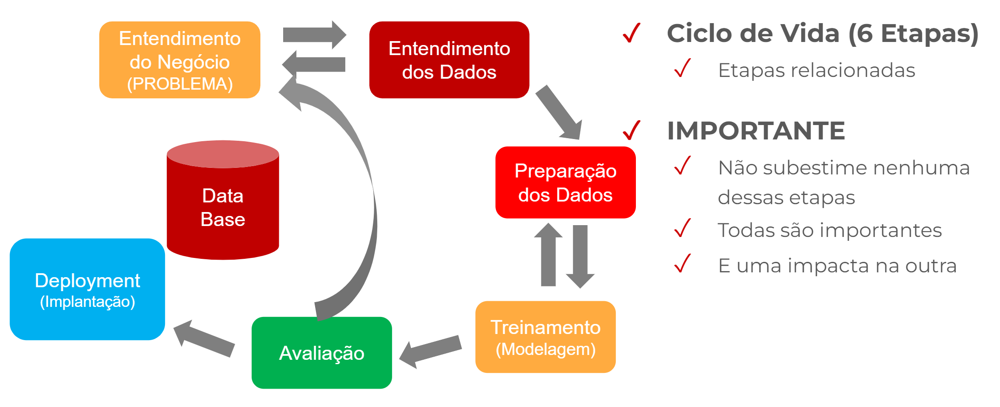

## **2. Entendimento dos Dados**

### 2.1. Imports iniciais

In [1]:
import pandas as pd
from pandas.plotting import lag_plot
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import yaml
import os

#### 2.1.1 Leitura do arquivo de configuração

In [2]:
# Leitura do arquivo de configuração

# folder para carregar os config files
CONFIG_PATH = "config/"

# Função para carregar os dados
def load_config(config_name):
    with open(os.path.join(CONFIG_PATH, config_name)) as file:
        config = yaml.safe_load(file)

    return config

In [3]:
config = load_config("data_preprocessing_config_sobral.yaml")

# mostrar todas as colunas
pd.set_option("display.max_columns", None)

#### 2.1.2. Leitura dos dados pré-processados

In [4]:
# Leitura dos dados a partir do CSV
codigo_wmo = config["input_data_parameters"]["codigo_wmo"]
estacao = config["input_data_parameters"]["estacao"]

input_dir = config["output_directory_preprocessing"]

filepath = f"{input_dir}/preprocessed_data_{codigo_wmo}_{estacao}.csv"

data = pd.read_csv(
    filepath,
    index_col=0,
)

### 2.2. Correlação entre variáveis

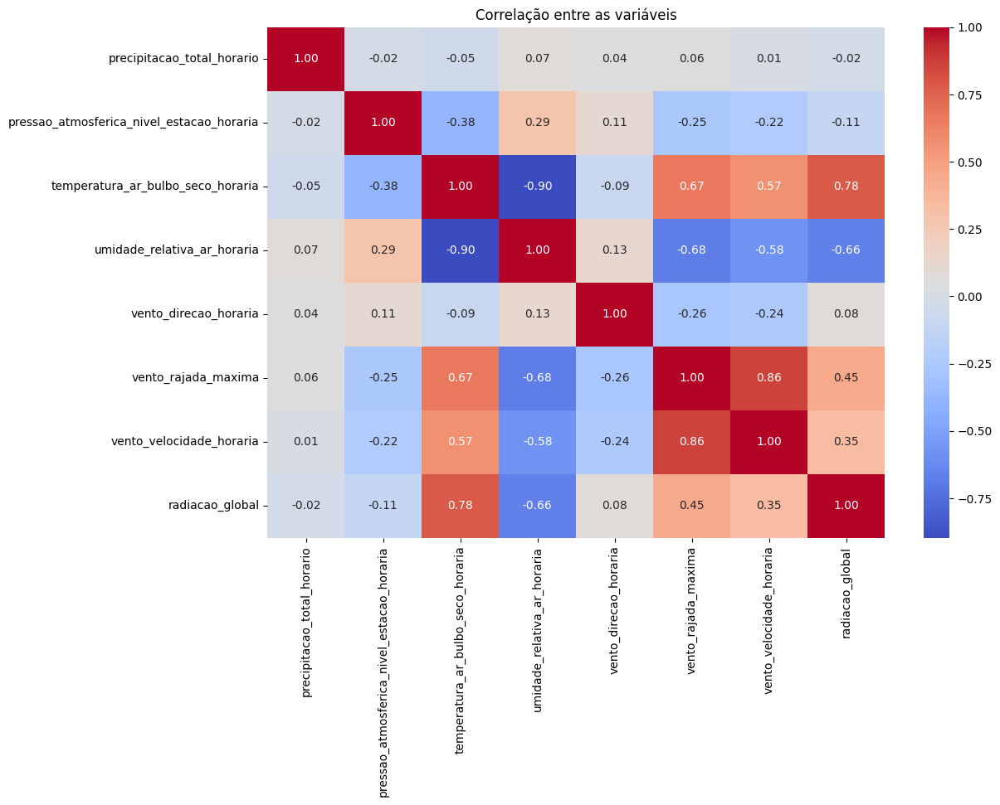

In [5]:
# plot dos valores da correlação entre as variáveis retirando a coluna year
plt.figure(figsize=(12, 8))
sns.heatmap(
    data.drop(columns=["year", "hora", "mes", "semana", "dia_ano"]).corr(),
    annot=True,
    cmap="coolwarm",
    fmt=".2f",
)
plt.title("Correlação entre as variáveis")
plt.show()

### 2.3. Tratamento de Valores 0

Temos inúmeros valores iguais a 0 na base. Enquanto eles fazem sentido físico, podem impactar análises estatísticas, como decomposição sazonal multiplicativa, etc. Vamos adicionar um epsilon bem pequeno, o qual será retirado ao fim das previsões

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43824 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43824 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  int64  


In [7]:
data.head()

,precipitacao_total_horario,pressao_atmosferica_nivel_estacao_horaria,temperatura_ar_bulbo_seco_horaria,umidade_relativa_ar_horaria,vento_direcao_horaria,vento_rajada_maxima,vento_velocidade_horaria,radiacao_global,year,hora,mes,semana,dia_ano
2015-01-01 00:00:00,0.0,1002.1,25.2,81.0,236.0,6.3,2.3,0.0,2015,0,1,1,1
2015-01-01 01:00:00,0.0,1001.7,24.7,83.0,236.0,4.5,2.0,0.0,2015,1,1,1,1
2015-01-01 02:00:00,0.0,1001.5,24.6,84.0,236.0,4.1,1.7,0.0,2015,2,1,1,1
2015-01-01 03:00:00,0.0,1001.5,24.4,84.0,236.0,3.3,1.2,0.0,2015,3,1,1,1
2015-01-01 04:00:00,0.0,1001.5,24.2,85.0,236.0,1.9,0.9,0.0,2015,4,1,1,1


In [8]:
# para 8 primeiras colunas, adicionar 0.01
data.iloc[:, :8] = data.iloc[:, :8] + 0.01

data.head()

,precipitacao_total_horario,pressao_atmosferica_nivel_estacao_horaria,temperatura_ar_bulbo_seco_horaria,umidade_relativa_ar_horaria,vento_direcao_horaria,vento_rajada_maxima,vento_velocidade_horaria,radiacao_global,year,hora,mes,semana,dia_ano
2015-01-01 00:00:00,0.01,1002.11,25.21,81.01,236.01,6.31,2.31,0.01,2015,0,1,1,1
2015-01-01 01:00:00,0.01,1001.71,24.71,83.01,236.01,4.51,2.01,0.01,2015,1,1,1,1
2015-01-01 02:00:00,0.01,1001.51,24.61,84.01,236.01,4.11,1.71,0.01,2015,2,1,1,1
2015-01-01 03:00:00,0.01,1001.51,24.41,84.01,236.01,3.31,1.21,0.01,2015,3,1,1,1
2015-01-01 04:00:00,0.01,1001.51,24.21,85.01,236.01,1.91,0.91,0.01,2015,4,1,1,1


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43824 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43824 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  int64  


### 2.4. Precipitação - EDA univariada

In [184]:
variavel = "precipitacao_total_horario"
label = "Precipitação Global (mm)"

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43824 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43824 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  int64  


#### 2.4.1 Estatísticas descritivas

In [12]:
data[variavel].describe()

count    43824.000000
mean         0.052557
std          0.652829
min          0.010000
25%          0.010000
50%          0.010000
75%          0.010000
max         42.010000
Name: precipitacao_total_horario, dtype: float64

Pela análise das métricas descritivas principais da variável Precipitação, vemos que a maior parte dos dados são de fato 0. Faz sentido visto se tratar de uma estação no semiárido nordestino, onde não chove na maior parte do tempo.

A média é puxada para 0 apesar do valor máximo ser de 42 mm

#### 2.4.2. Coeficiente de Variação

In [13]:
def calcula_cv(data, variavel):
    # Cálculo do Coeficiente de Variação
    cv = data[variavel].std() / data[variavel].mean() * 100

    return cv

In [14]:
print(calcula_cv(data, variavel))

1242.1454239993905


Temos, nesse, caso, uma distribuição altamente heterogênea

#### 2.4.3. Visualização de perfil

In [116]:
def plota_perfil_geral(data, variavel, label, inicio="2015-01-01", fim="2019-12-31"):
    import matplotlib.dates as mdates
    from matplotlib.ticker import MaxNLocator
    
    # Garantindo que o índice seja datetime
    if not isinstance(data.index, pd.DatetimeIndex):
        data.index = pd.to_datetime(data.index)

    # Filtrando os dados para o intervalo de tempo
    data_filtrada = data.loc[inicio:fim]

    # Plotando os dados
    data_filtrada[variavel].plot(figsize=(10, 6))

    # Adicionando rótulos e título
    plt.ylabel(label, fontsize=16)

    # Configurando o eixo x com formatação de data
    # plt.gca().xaxis.set_major_locator(MaxNLocator(5))  # Máximo de 5 ticks no eixo x
    # plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Formato YYYY-MM-DD

    # Ajustando estilos
    plt.xticks(fontsize=10, rotation=45)
    plt.yticks(fontsize=14)
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.tight_layout()

    # Exibindo o gráfico
    plt.show()

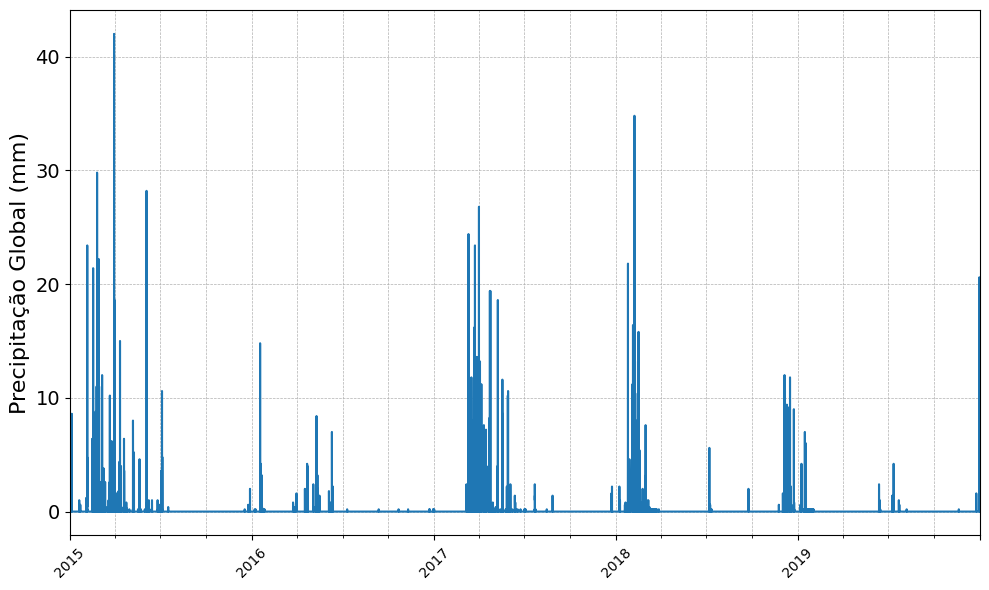

In [117]:
plota_perfil_geral(data, variavel, label)

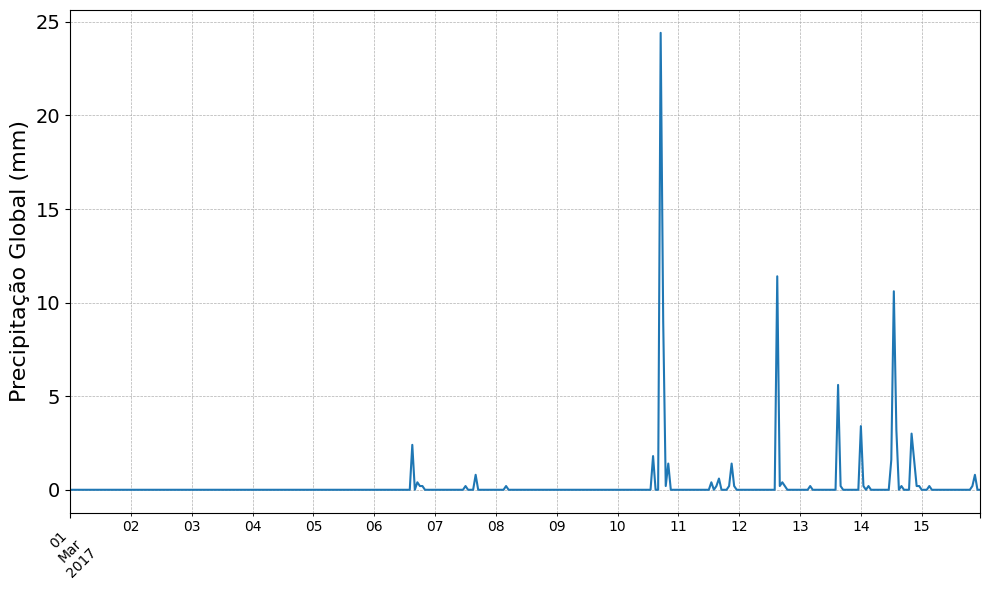

In [118]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

Visualmente, percebemos o padrão para a Precipitação de diversos valores 0 e algum picos de chuva espalhados (--> Dirac)

#### 2.4.4. Média móvel e desvio padrão móvel

In [154]:
def show_estat_moveis(
    data, variavel, label, inicio="2015-01-01", fim="2019-12-31", window=168
):
    # Garantindo que o índice seja datetime
    if not isinstance(data.index, pd.DatetimeIndex):
        data.index = pd.to_datetime(data.index)

    # Média móvel e desvio padrão móvel
    data["MMS"] = data[variavel].rolling(window=window).mean()
    data["DP-X"] = data[variavel].rolling(window=window).std()

    # Filtrando os dados para o intervalo de tempo
    data_filtrada = data.loc[inicio:fim]

    # Criando o gráfico
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Selecionando cores do colormap padrão
    cmap = plt.get_cmap("tab10")
    color1 = cmap(0)  
    color2 = cmap(1)  
    color3 = cmap(2)  

    # Primeiro eixo y (variável principal)
    ax1.plot(
        data_filtrada.index,
        data_filtrada[variavel],
        label=variavel,
        color=color1,
        alpha=0.7,
    )
    ax1.plot(
        data_filtrada.index,
        data_filtrada["MMS"],
        label="Média Móvel",
        color=color2,
        linestyle="--",
    )
    ax1.set_ylabel(label, fontsize=16)
    ax1.tick_params(axis="y", labelcolor=color2)
    ax1.grid(True, which="major", linestyle="--", linewidth=0.5)

    # Segundo eixo y (média móvel e desvio padrão)
    ax2 = ax1.twinx()
    ax2.plot(
        data_filtrada.index,
        data_filtrada["DP-X"],
        label="Desvio Padrão Móvel",
        color=color3,
        linestyle=":",
    )
    ax2.tick_params(axis="y", labelcolor=color3)

    # Adicionando legenda
    fig.legend(loc="upper left", bbox_to_anchor=(0.1, 0.9), fontsize=12)

    # Ajustando o layout
    plt.tight_layout()

    # Exibindo o gráfico
    plt.show()

    # Remoção de variáveis de média móvel e desvio padrão
    data.drop(columns=["MMS", "DP-X"], inplace=True)


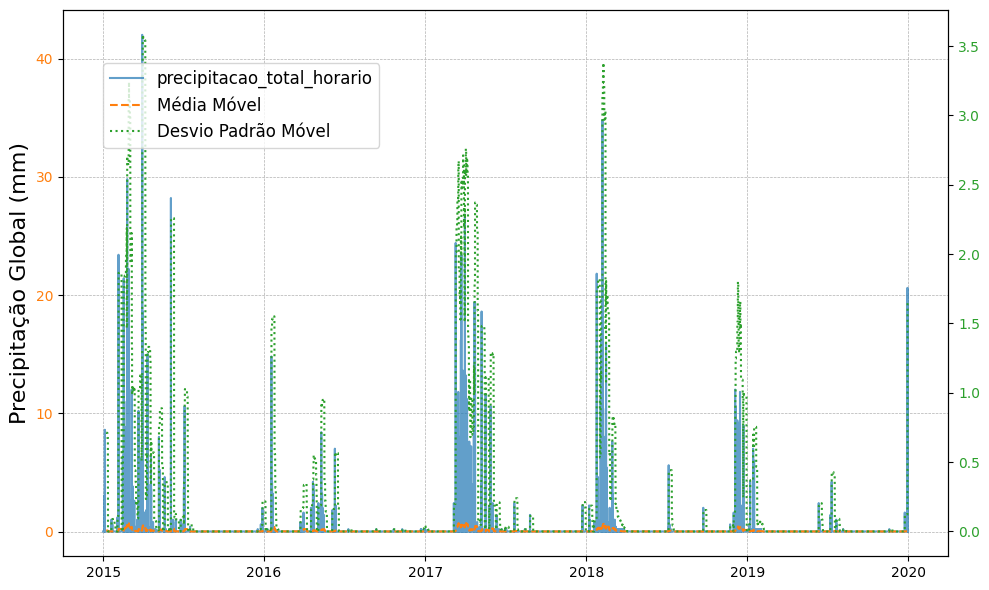

In [155]:
show_estat_moveis(data, variavel, label)

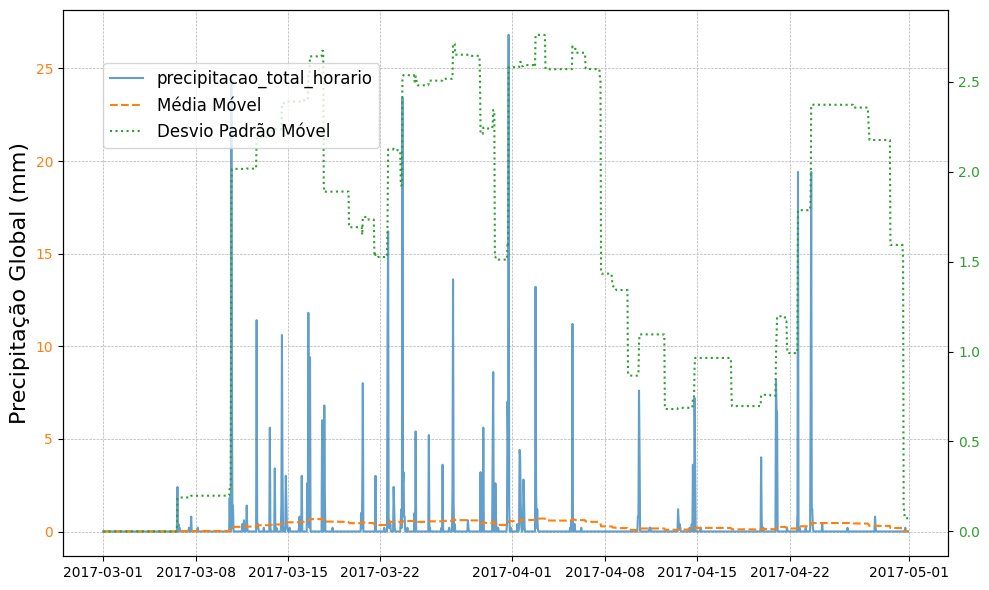

In [156]:
show_estat_moveis(data, variavel, label, inicio, fim)

#### 2.4.5. Boxplot geral

In [182]:
def plota_boxplot_geral(data, variavel, label):
    # Configurando a figura
    plt.figure(figsize=(20, 15))

    mean=data[variavel].mean()
    median=data[variavel].median()
    mode=data[variavel].mode().values[0]

    # Primeiro subplot: histograma com KDE
    plt.subplot(2, 1, 1)
    sns.histplot(data, x=variavel, kde=True)
    plt.ylabel("Frequência", fontsize=25)
    # plt.title("Distribuição da Radiação Global", fontsize=20)
    # remove xlabel
    plt.xlabel(None)

    plt.axvline(mean, color='r', linestyle='--', label="Mean")
    plt.axvline(median, color='g', linestyle='-', label="Median")
    plt.axvline(mode, color='b', linestyle='-', label="Mode")
    plt.legend(fontsize=20)


    plt.xticks(fontsize=22)
    plt.yticks(fontsize=22)

    # Segundo subplot: boxenplot
    plt.subplot(2, 1, 2)
    sns.boxenplot(
        data[variavel],
        orient="h",
        flier_kws={"marker": "d", "s": 90},  # Corrigido para `size`
        k_depth="tukey",
    )
    plt.xlabel(label, fontsize=25)
    plt.xticks(fontsize=22)
    plt.yticks([])  # Remover ticks do eixo y para o boxenplot
    # plt.title("Boxenplot da Radiação Global", fontsize=20)

    plt.axvline(mean, color='r', linestyle='--')
    plt.axvline(median, color='g', linestyle='-')
    plt.axvline(mode, color='b', linestyle='-')

    # Ajustando o layout
    plt.tight_layout()

    # Exibindo o gráfico
    plt.show()

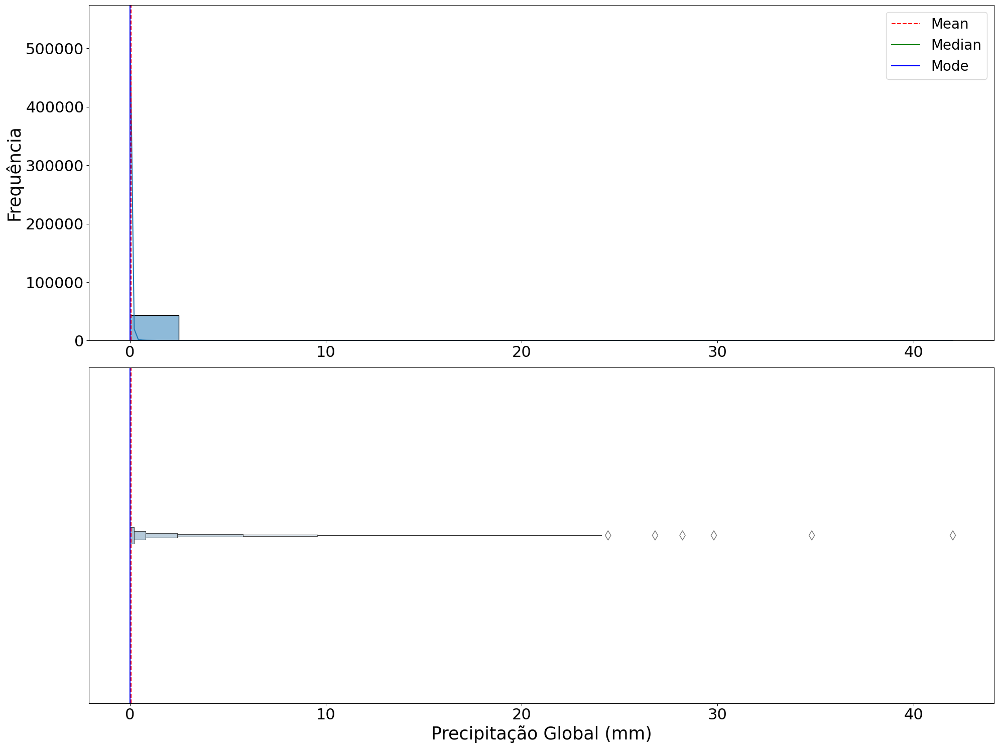

In [185]:
plota_boxplot_geral(data, variavel, label)

#### 2.4.6. Boxplot por semana e hora do dia

In [24]:
def plota_boxplot_semana_hora(data, variavel, label):
    # Criando a figura e os subgráficos (2 gráficos, 1 coluna)
    fig, axes = plt.subplots(2, 1, figsize=(15, 12))  # 2 linhas, 1 coluna

    # Boxplot por Semana
    sns.boxplot(
        x="semana",
        y=variavel,
        data=data,
        showmeans=True,
        meanline=True,
        meanprops={"color": "red", "linestyle": "--"},
        ax=axes[0],  # Primeiro gráfico
    )
    axes[0].set_title("Boxplot por Semana", fontsize=16)
    axes[0].set_xlabel("Semana", fontsize=14)
    axes[0].set_ylabel(label, fontsize=14)
    axes[0].tick_params(axis='both', which='major', labelsize=12)

    # Boxplot por Hora
    sns.boxplot(
        x="hora",
        y=variavel,
        data=data,
        showmeans=True,
        meanline=True,
        meanprops={"color": "red", "linestyle": "--"},
        ax=axes[1],  # Segundo gráfico
    )
    axes[1].set_title("Boxplot por Hora", fontsize=16)
    axes[1].set_xlabel("Hora", fontsize=14)
    axes[1].set_ylabel(label, fontsize=14)
    axes[1].tick_params(axis='both', which='major', labelsize=12)

    # Ajustando o layout para que os gráficos não se sobreponham e adicionando mais espaço
    plt.subplots_adjust(hspace=0.3)

    # Exibindo os gráficos
    plt.show()

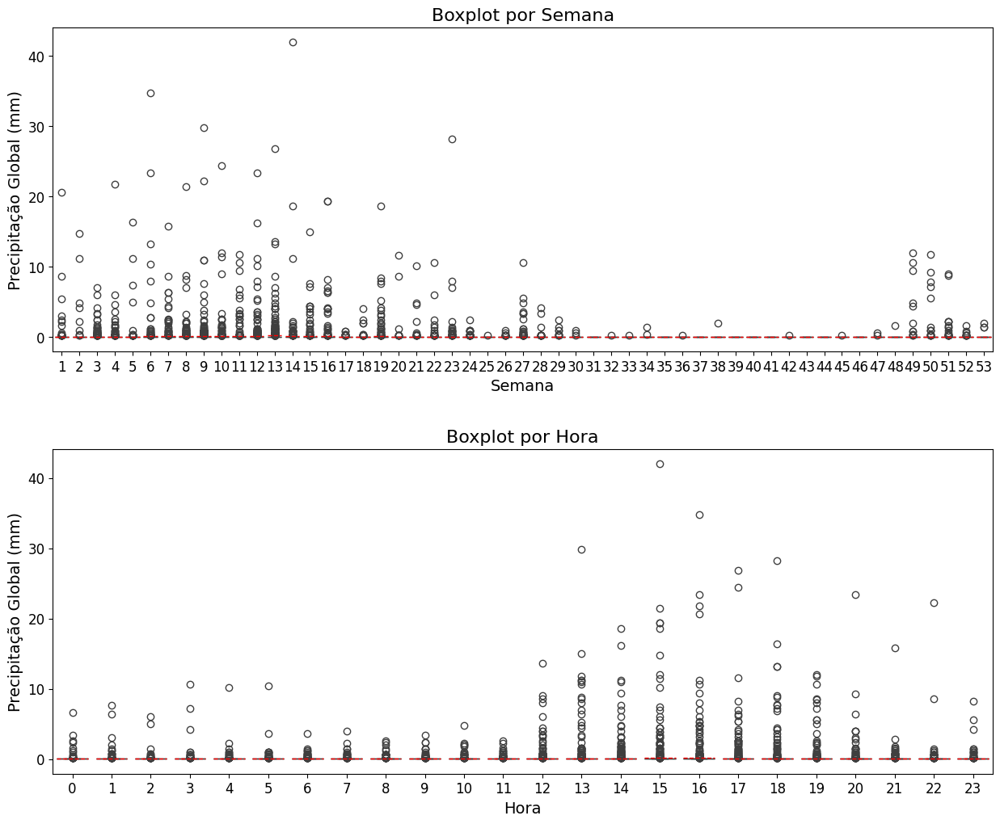

In [25]:
plota_boxplot_semana_hora(data, variavel, label)

#### 2.4.7. Teste de Estacionariedade (Dickey-Fuller)

In [26]:
def dickey_fuller(data, variavel, tipo="geral"):
    from statsmodels.tsa.stattools import adfuller

    # Teste para a série original
    if tipo == "1_diff":
        result = adfuller(np.diff(data["radiacao_global"]), autolag="AIC")
    elif tipo == "2_diff":
        result = adfuller(
            np.diff(np.diff(data["radiacao_global"])), autolag="AIC"
        )
    else:
        result = adfuller(data[variavel], autolag="AIC")
    print("ADF Statistic: %f" % result[0])
    print("p-value: %f" % result[1])
    print("Critical Values:")
    for key, value in result[4].items():
        print("\t%s: %.3f" % (key, value))

In [27]:
dickey_fuller(data, variavel)

ADF Statistic: -21.311620
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


Dessa forma, como o p-valor é suficientemente pequeno, podemos rejeitar a hipótese nulae, portanto, tomar que a série original é estacionária ou tendência-estacionária

In [28]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -46.323019
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [29]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -64.430540
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


Mesma coisa para primeiras e segundas diferenças

#### 2.4.8. Decomposição em Tendência e Sazonalidade

In [30]:
def decompoe_tendencia_sazonalidade(
    data,
    variavel,
    modelo="multiplicative",
    periodo=24,
    inicio="2015-01-01",
    fim="2019-12-31",
):
    from statsmodels.tsa.seasonal import seasonal_decompose
    from pylab import rcParams

    # Teste do modelo aditivo com período de 7 dias (suposição inicial)
    result = seasonal_decompose(
        data.loc[inicio:fim, variavel],
        model=modelo,
        period=periodo,
    )

    rcParams["figure.figsize"] = 10, 6

    fig = result.plot()

    # Removendo o título superior
    fig.suptitle("")  # Define o título superior como vazio

    # Personalizando os ticks e labels
    for ax in fig.axes:
        ax.tick_params(axis="x", bottom=False, labelbottom=False)  # Remove os ticks no eixo x
        ax.set_xlabel("")  # Remove o nome do eixo x
        ax.tick_params(axis="y", labelsize=14)  # Ajusta o tamanho dos ticks no eixo y
        ax.set_ylabel(ax.get_ylabel(), fontsize=16)  # Aumenta o tamanho do label do eixo y

    # Exibe o gráfico
    plt.tight_layout()

    plt.show()

##### 2.4.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [31]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

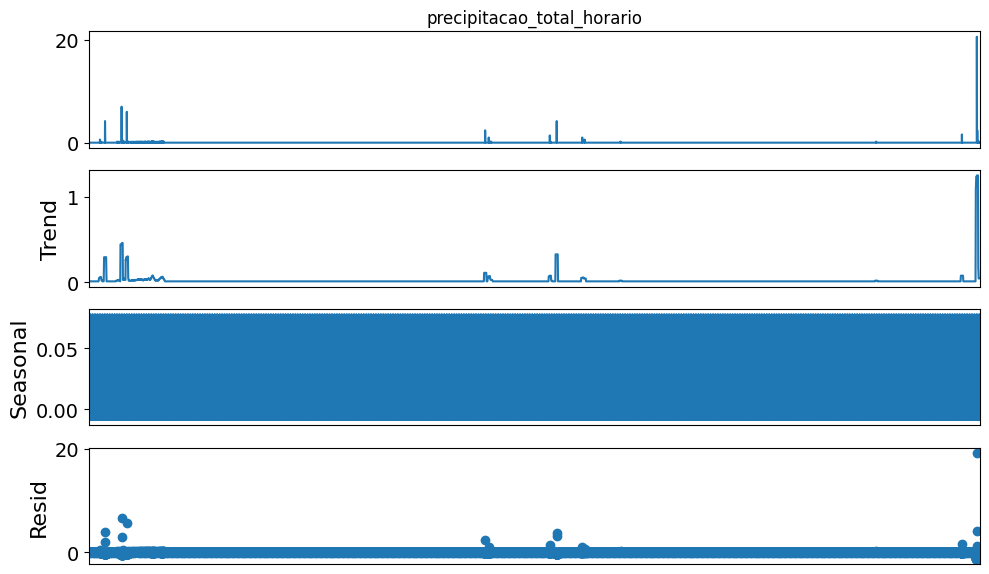

In [32]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.4.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [33]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

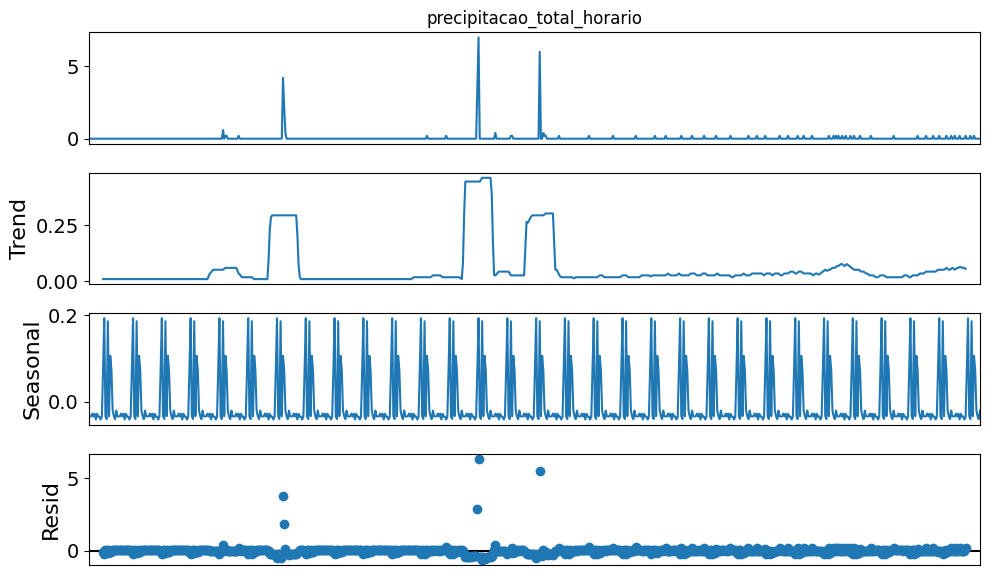

In [34]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.4.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [35]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

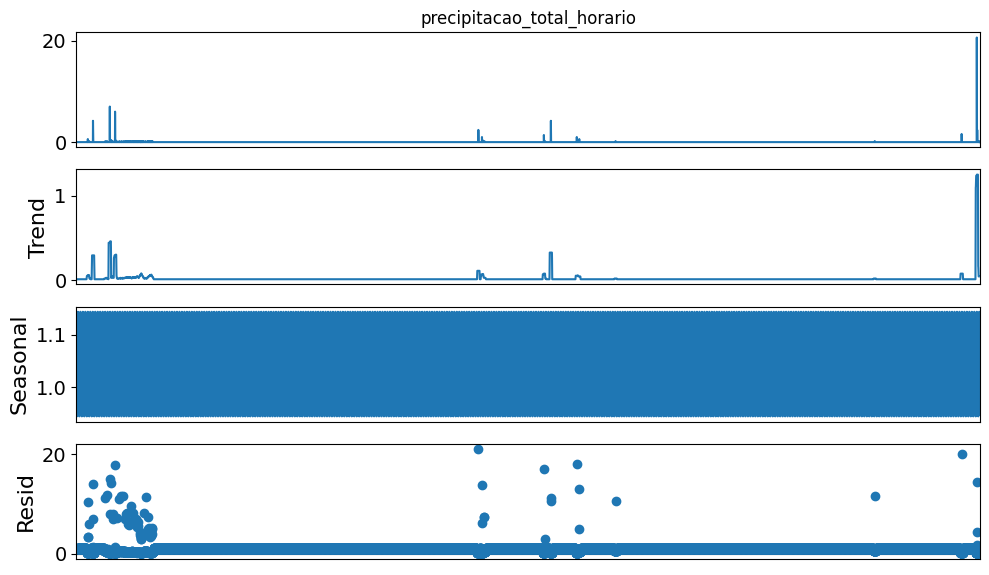

In [36]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.4.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [37]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

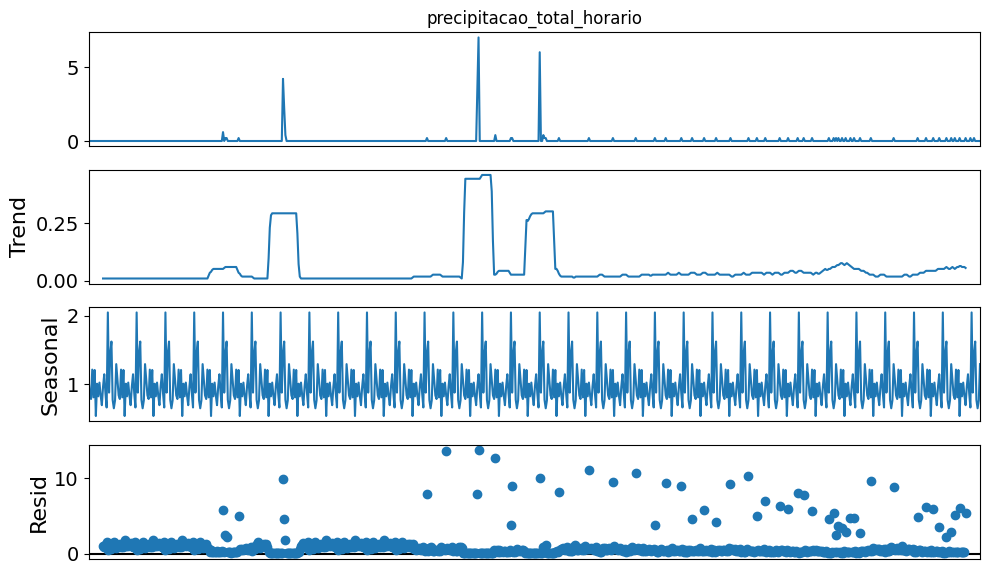

In [38]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.4.9. Análise de Autocorrelação

In [40]:
def plot_acf_pacf(data, variavel, lags=50):
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

    # Configurações
    y_label = "Autocorrelação"
    lags = 50

    # Criando os subgráficos em um quadro 2x2
    fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharey=False)

    # Gráfico ACF da série original (canto superior esquerdo)
    plot_acf(
        data[variavel], 
        lags=lags, 
        ax=axes[0, 0], 
        title="ACF - Série Original"
    )
    axes[0, 0].set_ylabel(y_label, fontsize=14)
    axes[0, 0].set_xlabel("Lags", fontsize=14)

    # Gráfico PACF da série original (canto inferior esquerdo)
    plot_pacf(
        data[variavel], 
        lags=lags, 
        ax=axes[1, 0], 
        title="PACF - Série Original"
    )
    axes[1, 0].set_ylabel(y_label, fontsize=14)
    axes[1, 0].set_xlabel("Lags", fontsize=14)

    # Primeira diferença da série
    diff_data = data[variavel].diff().dropna()

    # Gráfico ACF da primeira diferença (canto superior direito)
    plot_acf(
        diff_data, 
        lags=lags, 
        ax=axes[0, 1], 
        title="ACF - Primeira Diferença"
    )
    axes[0, 1].set_ylabel("")
    axes[0, 1].set_xlabel("Lags", fontsize=14)

    # Gráfico PACF da primeira diferença (canto inferior direito)
    plot_pacf(
        diff_data, 
        lags=lags, 
        ax=axes[1, 1], 
        title="PACF - Primeira Diferença"
    )
    axes[1, 1].set_ylabel("")
    axes[1, 1].set_xlabel("Lags", fontsize=14)

    # Ajustando os ticks e labels
    for ax_row in axes:
        for ax in ax_row:
            ax.tick_params(axis="both", labelsize=12)

    # Ajustando o layout para evitar sobreposição
    plt.tight_layout()
    plt.show()

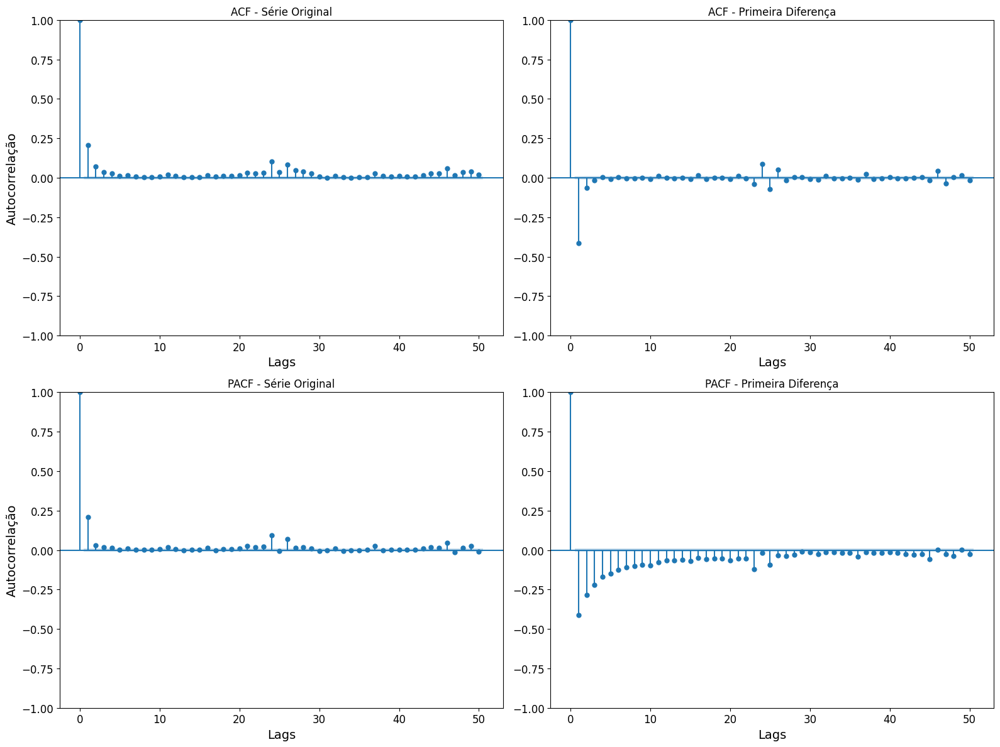

In [44]:
plot_acf_pacf(data, variavel)

Como já visualizado, não temos uma sazonalidade bem definida

### 2.5. Pressão Atmosférica - EDA univariada

In [186]:
variavel = "pressao_atmosferica_nivel_estacao_horaria"
label = "Pressão Atmosférica (mB)"

#### 2.5.1 Estatísticas descritivas

In [46]:
data[variavel].describe()

count    43824.000000
mean      1001.023154
std          2.148668
min        995.310000
25%        999.610000
50%       1001.110000
75%       1002.510000
max       1006.810000
Name: pressao_atmosferica_nivel_estacao_horaria, dtype: float64

Vemos que os dados se concentram por volta de 1000 mB, como esperado, com a média quase coincidindo com a mediana, logo, sem assimetria da distribuição.

#### 2.5.2. Coeficiente de Variação

In [47]:
print(calcula_cv(data, variavel))

0.21464717784608736


Temos, portanto, uma dispersão moderada dos dados, mas bem menor do que para a variável de Precipitação. Isso faz sentido visto a variável de precipitação ser predomiunantemente 0 com "picos" em alguns pontos de maior pluviosidade.

#### 2.5.3. Visualização de perfil

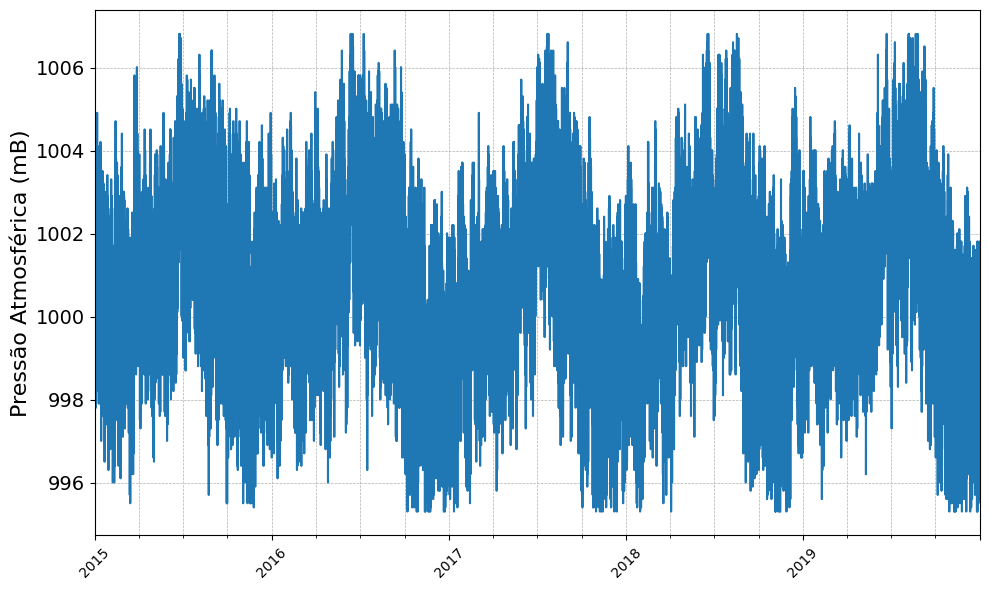

In [121]:
plota_perfil_geral(data, variavel, label)

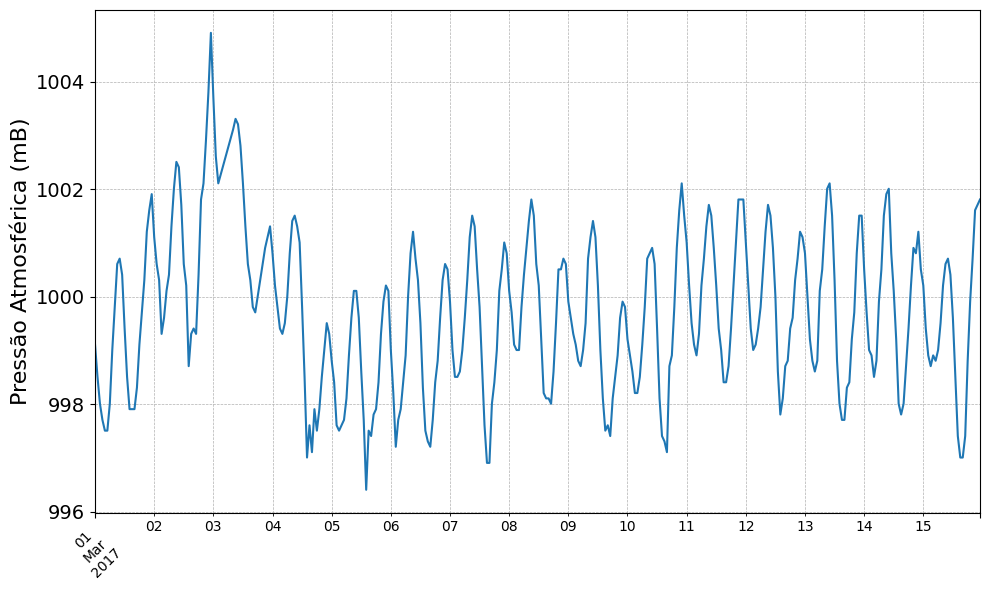

In [160]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

Vemos uma sazonalidade anual aparente dos dados, com uma segunda sazonalidade diária, quando olhamos no detalhe, padrão comum para variáveis atmosféricas

#### 2.5.4. Média móvel e desvio padrão móvel

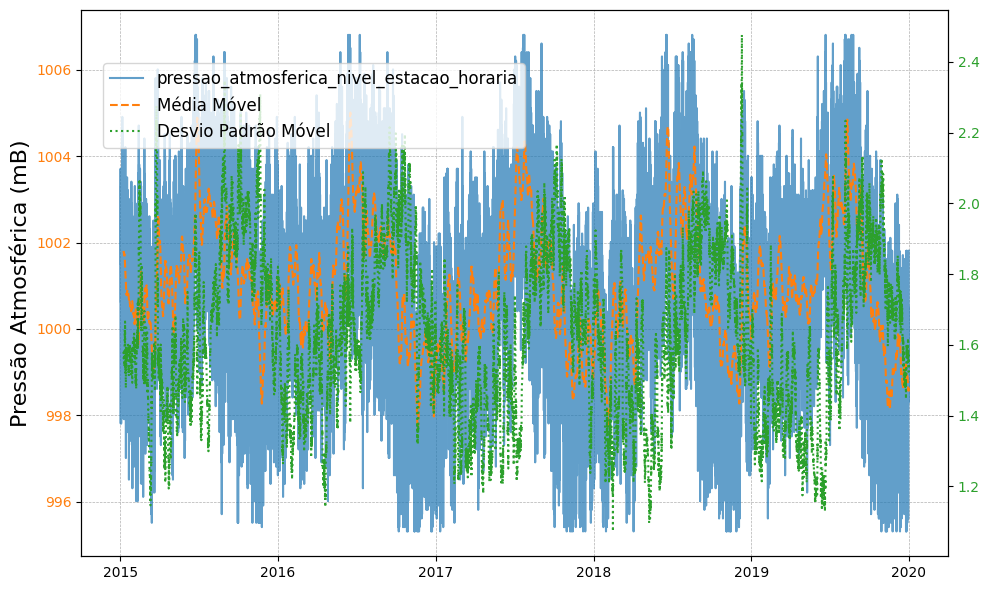

In [158]:
show_estat_moveis(data, variavel, label)

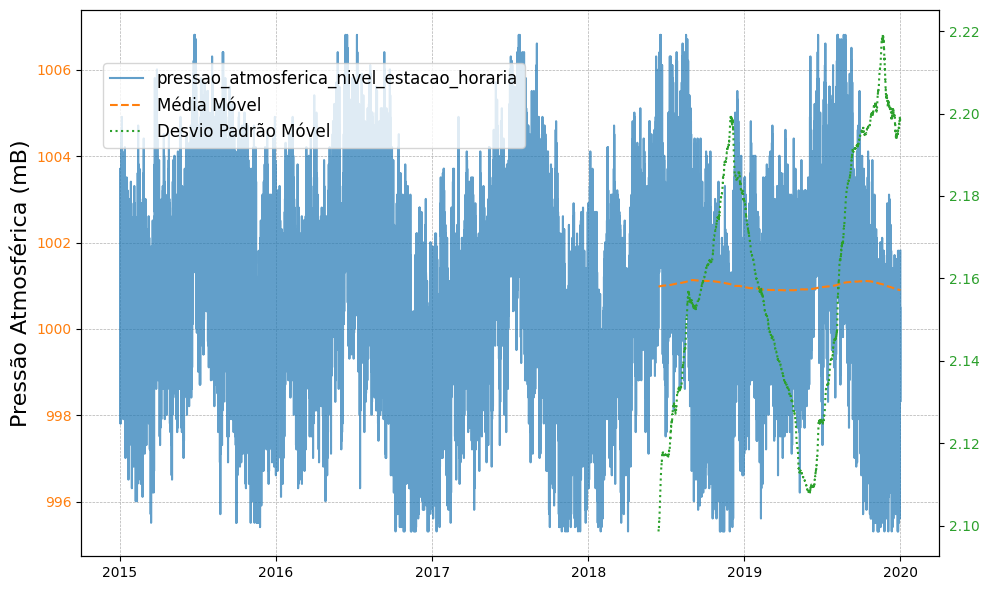

In [180]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

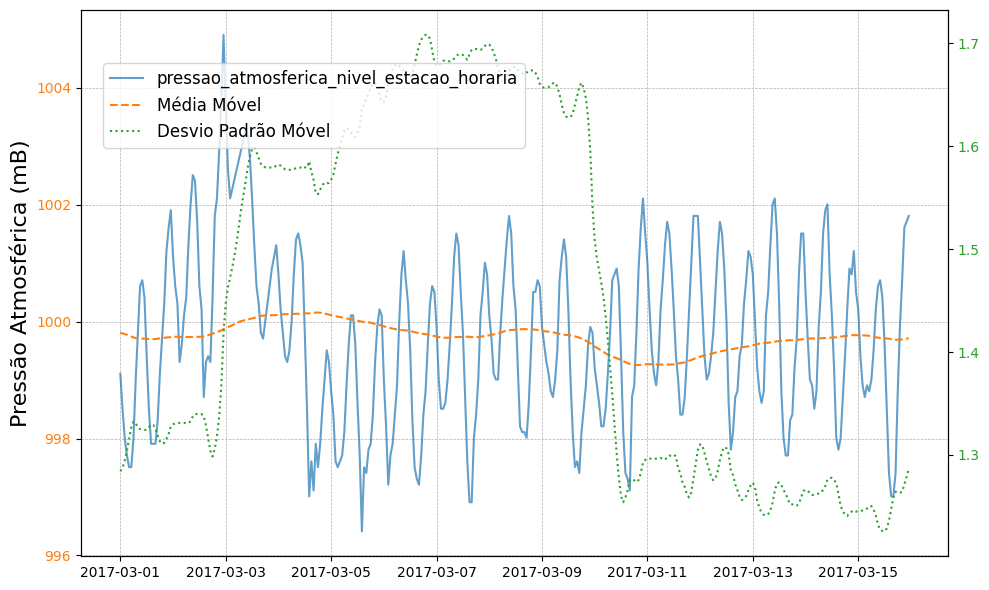

In [161]:
show_estat_moveis(data, variavel, label, inicio, fim)

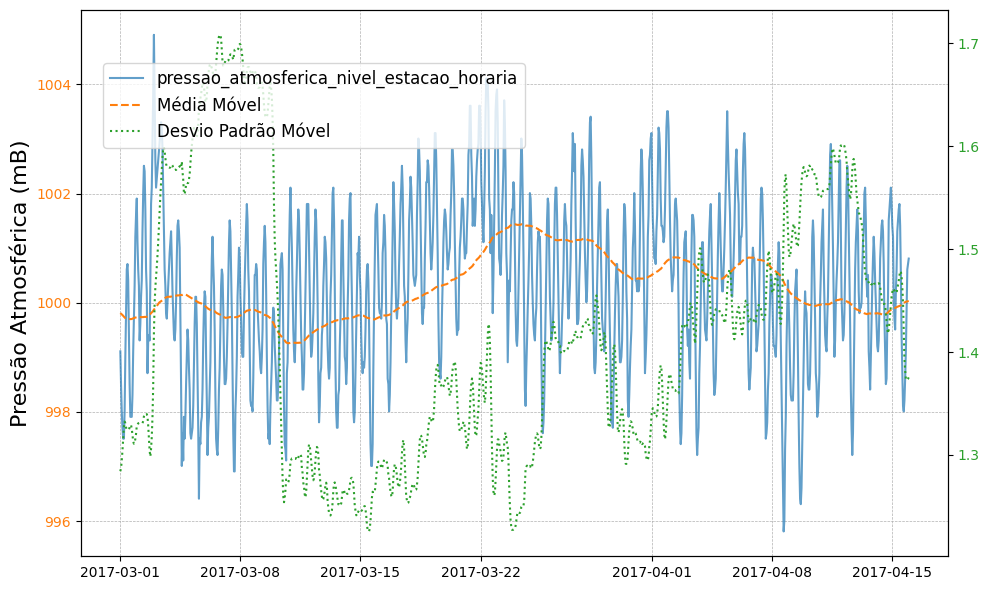

In [162]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

Vemos a média móvel semanal com a sazonalidade anual esperada, porém se considerarmos uma janela maior, vemos que fica relativamente estável em 1001 mB

#### 2.5.5. Boxplot geral

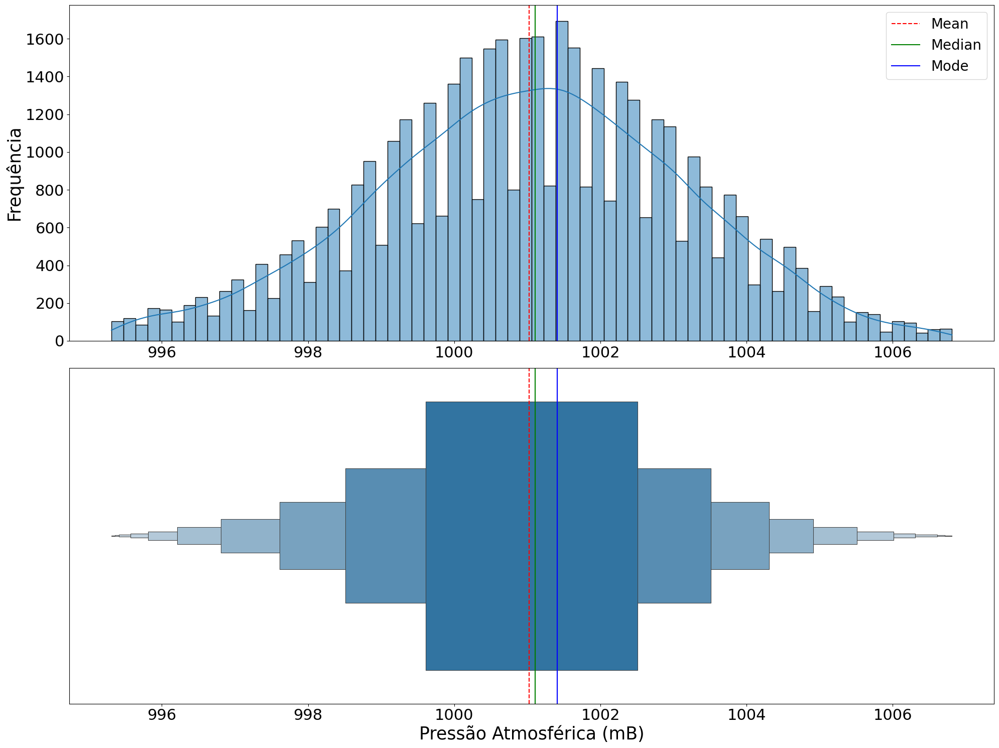

In [187]:
plota_boxplot_geral(data, variavel, label)

Identificamos o padrão de simetria esperado pelas estatísticas descritivas e média-mediana e moda bem próximas

#### 2.5.6. Boxplot por semana e hora do dia

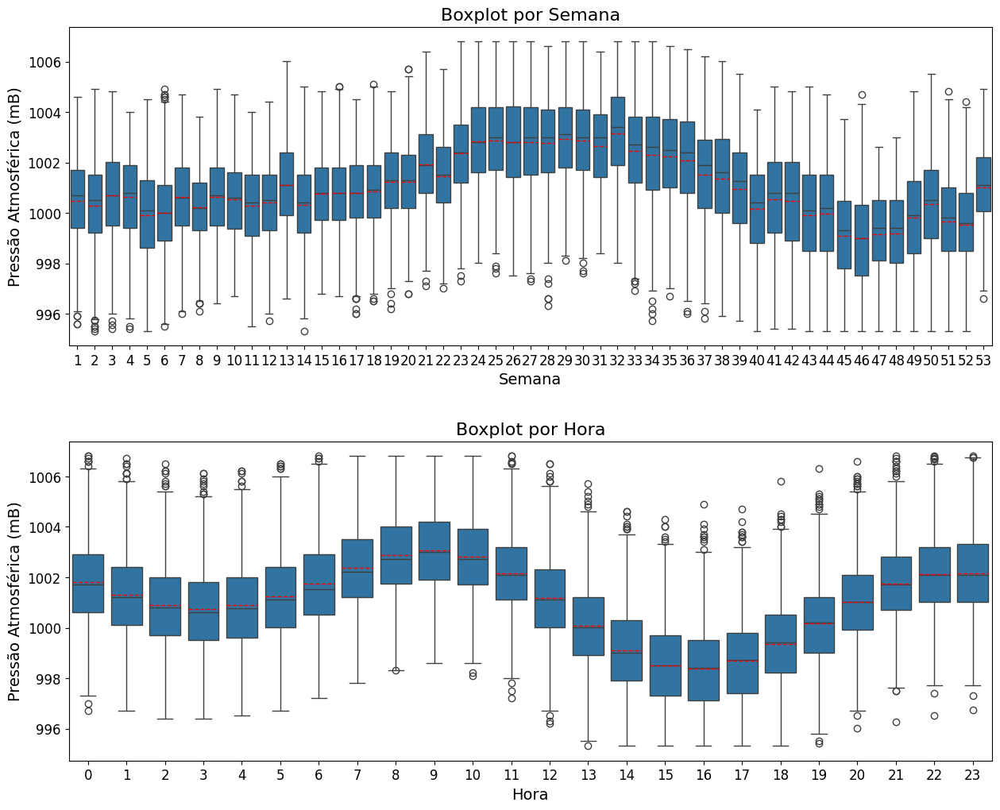

In [188]:
plota_boxplot_semana_hora(data, variavel, label)

Identificamos maiores valores de Pressão Atmosféricas no meio do ano e próximo às 9h da manhã. Menores valores são observados nos meses de outurbo-novembro e no final da tarde.

#### 2.5.7. Teste de Estacionariedade (Dickey-Fuller)

In [189]:
dickey_fuller(data, variavel)

ADF Statistic: -11.286279
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [190]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -46.323019
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [191]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -64.430540
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


Vemos a estacionariedade dos dados desde o primeiro teste

#### 2.5.8. Decomposição em Tendência e Sazonalidade

##### 2.5.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [208]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

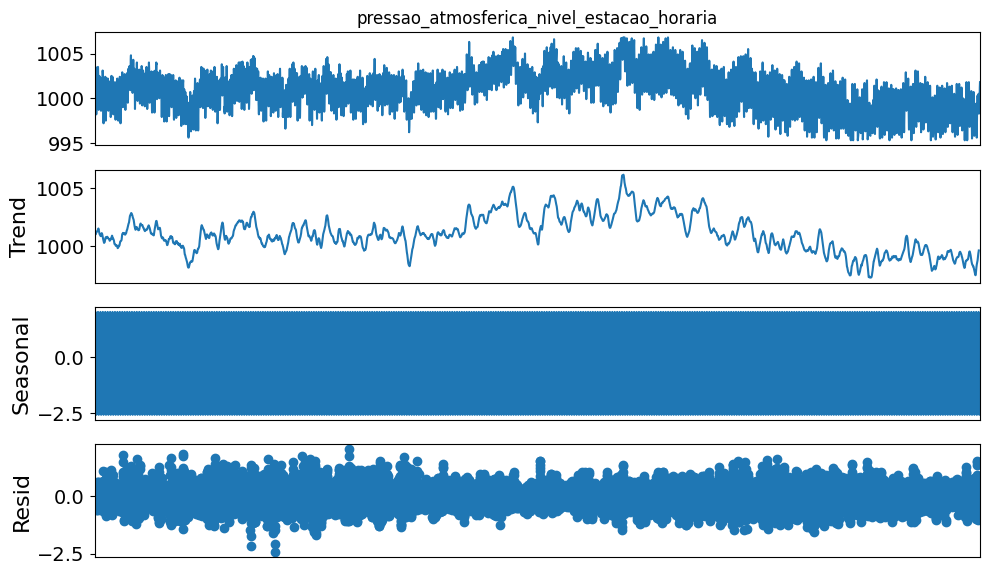

In [209]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.5.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [210]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

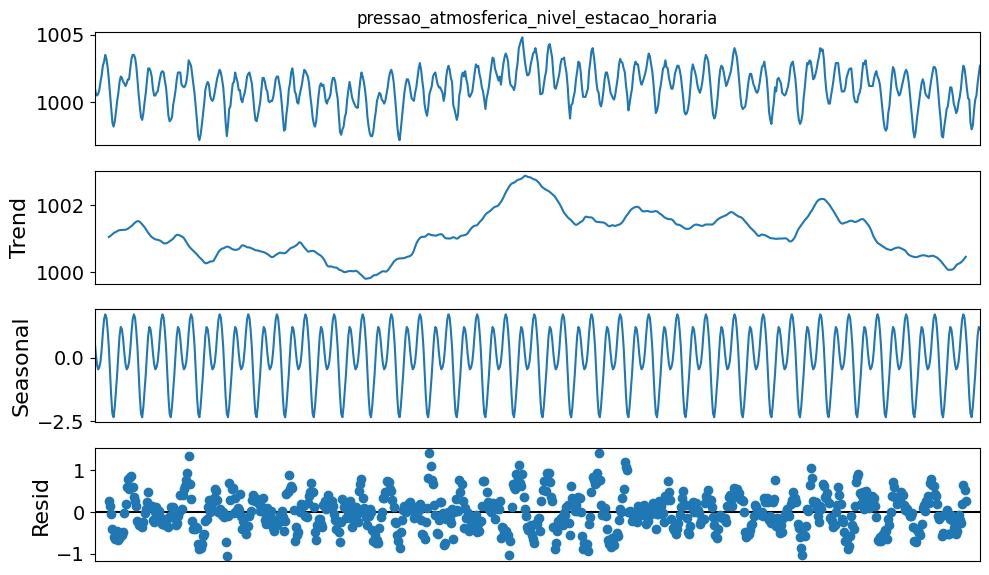

In [211]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.5.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [212]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

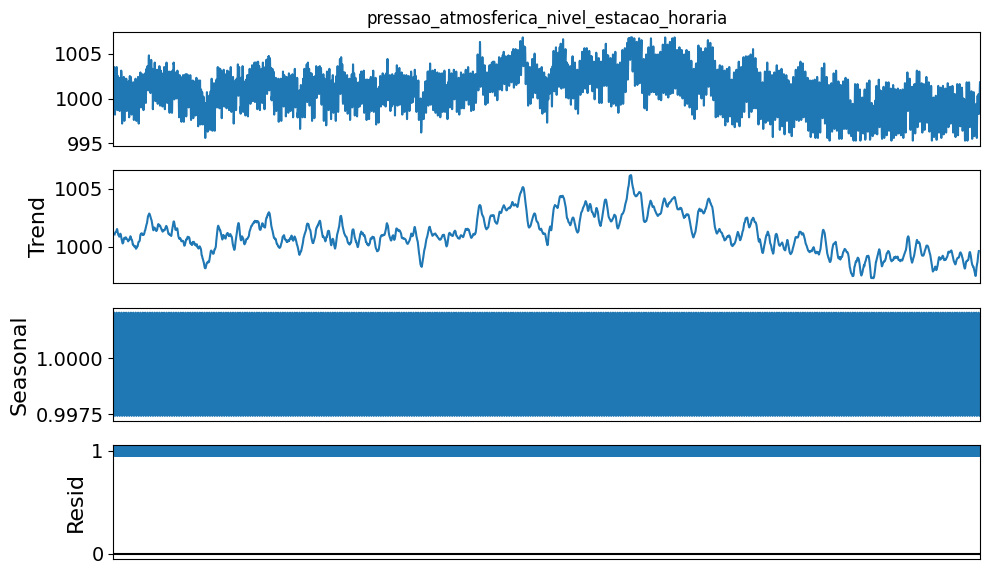

In [213]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.5.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [214]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

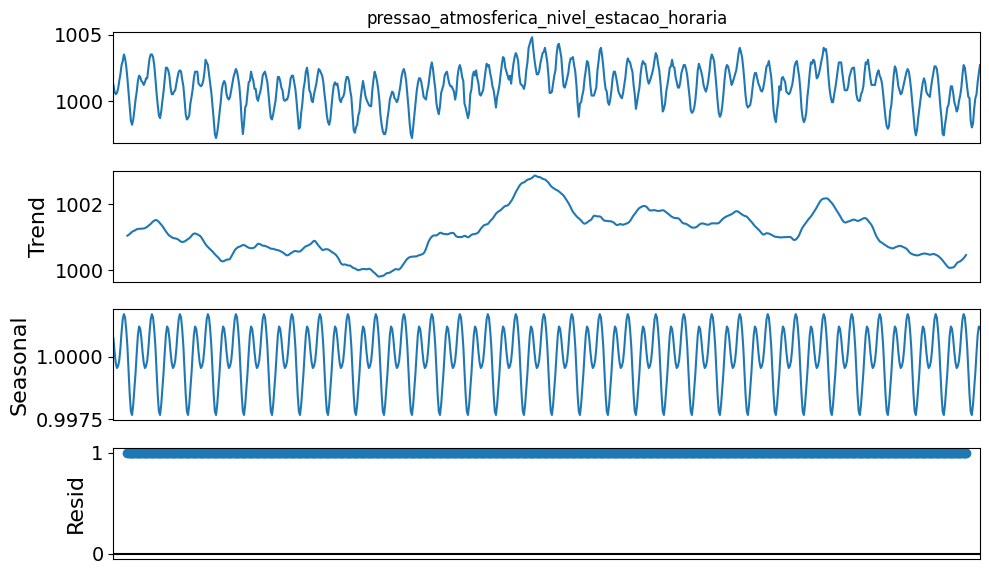

In [215]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.5.9. Análise de Autocorrelação

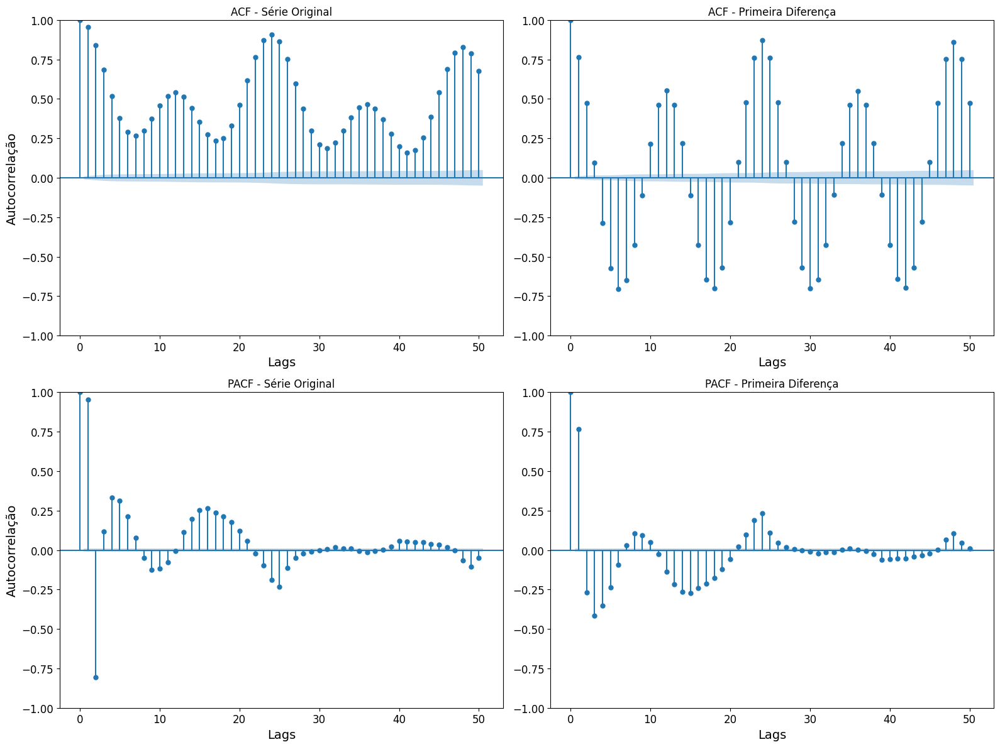

In [217]:
plot_acf_pacf(data, variavel)

Vemos o padrão sazonal dos dados

In [219]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43824 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43824 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  

### 2.6. Temperatura do Ar - EDA univariada

In [220]:
variavel = "temperatura_ar_bulbo_seco_horaria"
label = "Temperatura do Ar (°C)"

#### 2.6.1 Estatísticas descritivas

In [221]:
data[variavel].describe()

count    43824.000000
mean        27.592793
std          4.222508
min         17.310000
25%         24.210000
50%         26.510000
75%         30.710000
max         39.610000
Name: temperatura_ar_bulbo_seco_horaria, dtype: float64

Vemos dados concentrados em torno de 26-27 graus com média bem próxima da variância. Temperatura mínima e máxima fazem sentido. Variação de 4,2 graus

#### 2.6.2. Coeficiente de Variação

In [222]:
print(calcula_cv(data, variavel))

15.30293646170881


Identificamos uma forte dispersão dos dados

#### 2.6.3. Visualização de perfil

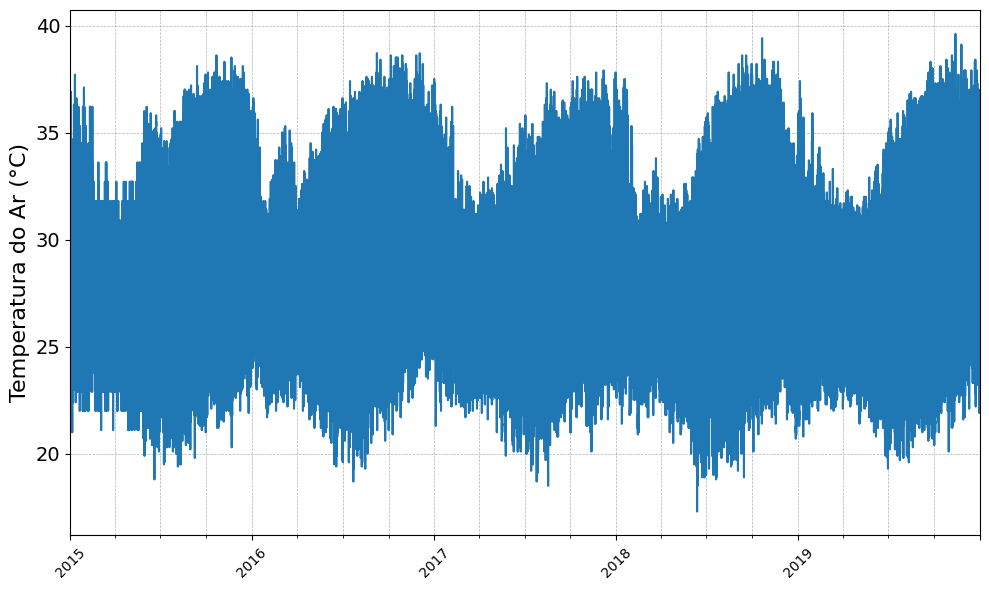

In [223]:
plota_perfil_geral(data, variavel, label)

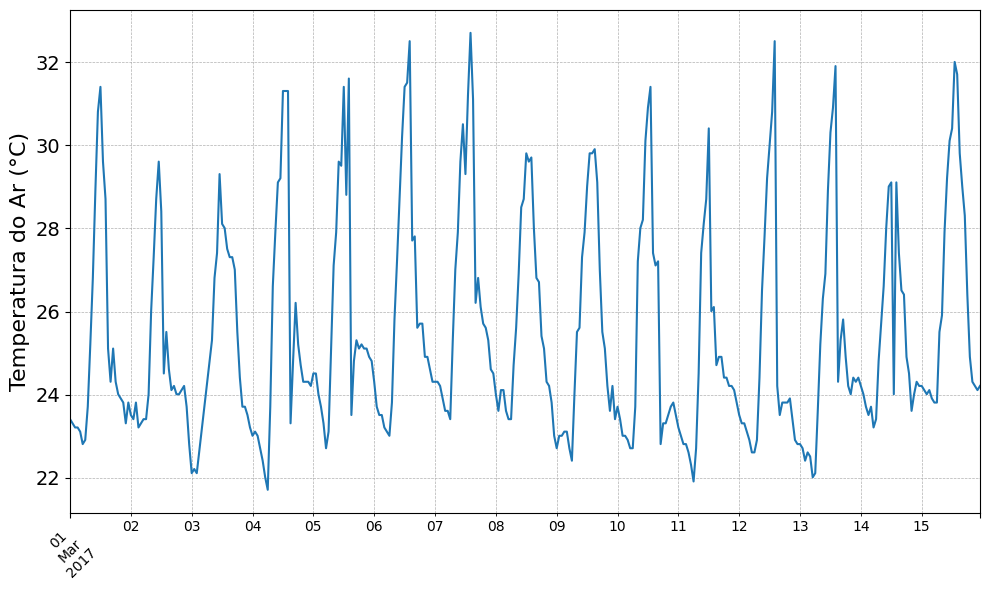

In [224]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

Vemos uma sazonalidade anual aparente dos dados, com uma segunda sazonalidade diária, quando olhamos no detalhe, padrão comum para variáveis atmosféricas

#### 2.6.4. Média móvel e desvio padrão móvel

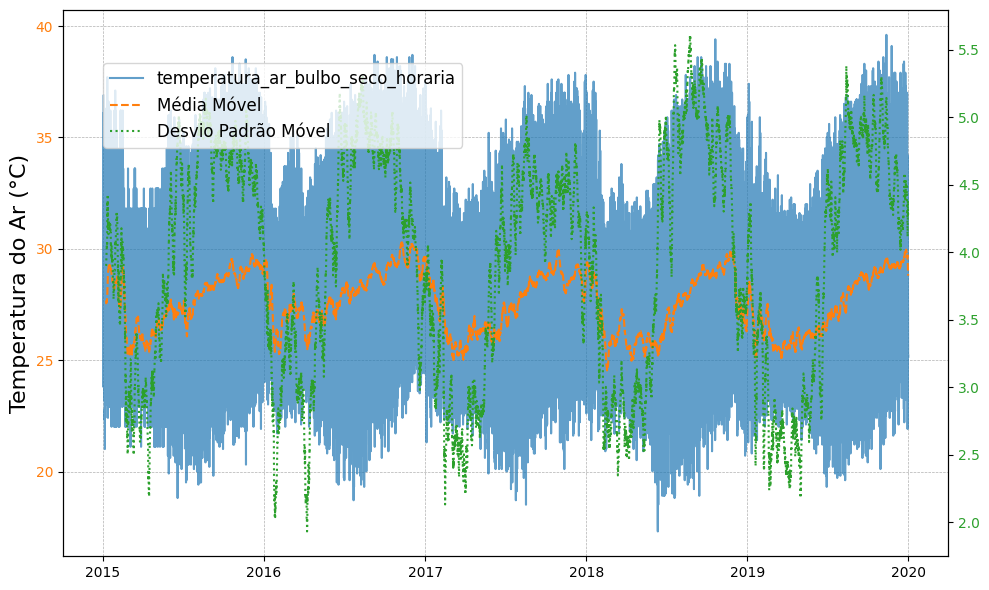

In [225]:
show_estat_moveis(data, variavel, label)

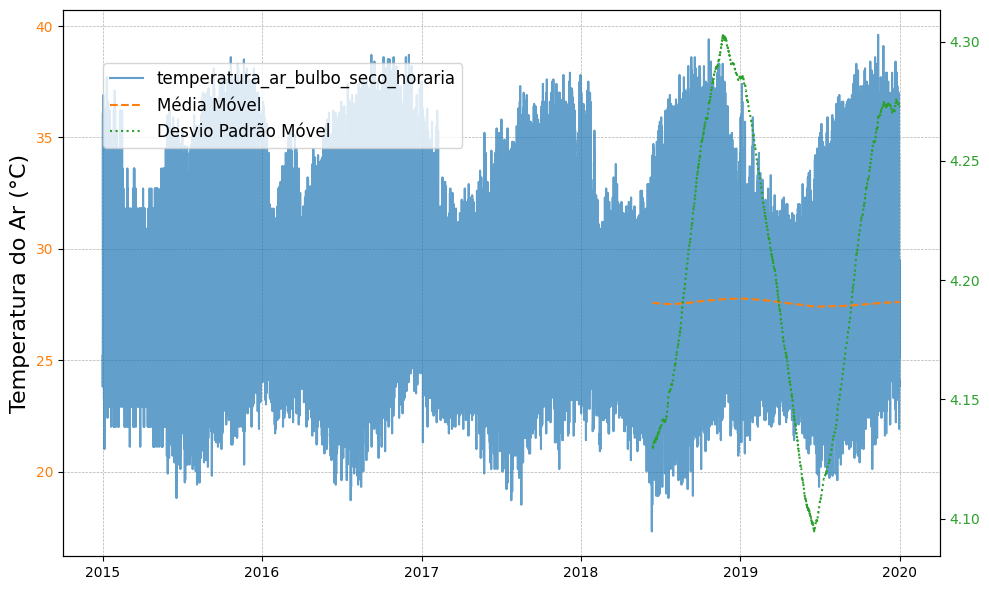

In [226]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

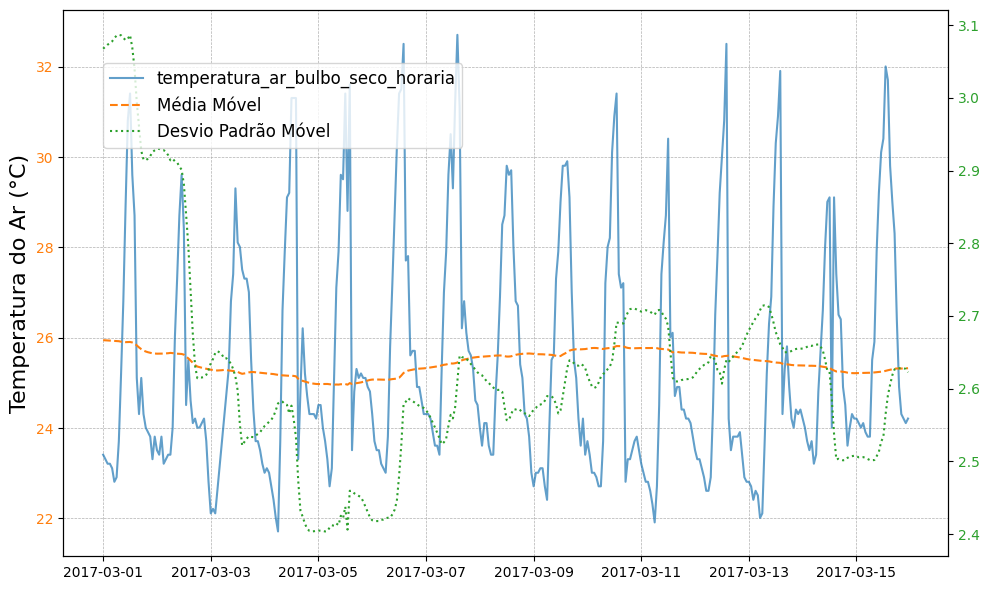

In [227]:
show_estat_moveis(data, variavel, label, inicio, fim)

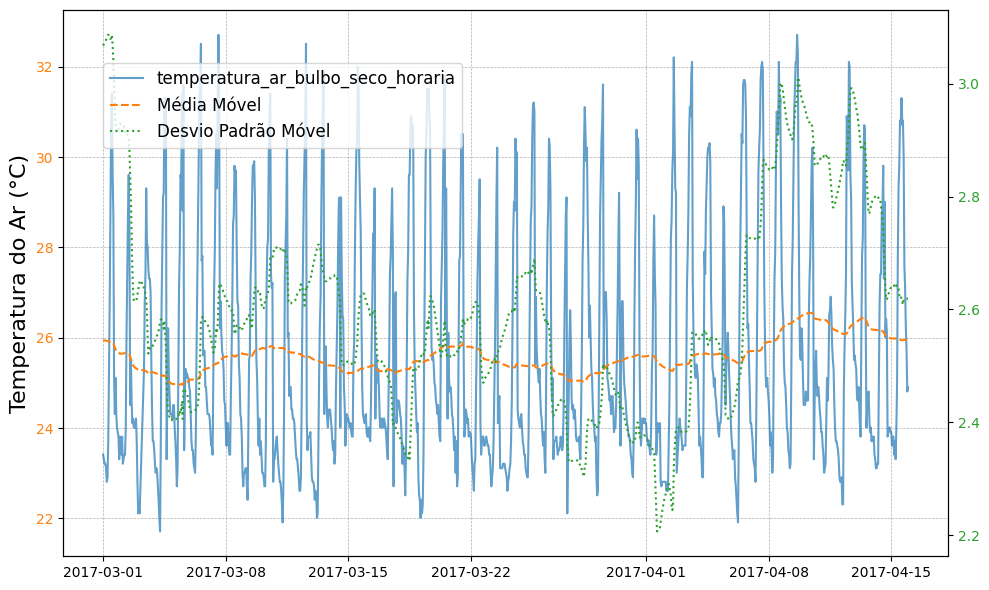

In [228]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

Vemos a média móvel semanal com a sazonalidade anual esperada, porém se considerarmos uma janela maior, vemos que fica relativamente estável em 28 graus, aproximadamente

#### 2.6.5. Boxplot geral

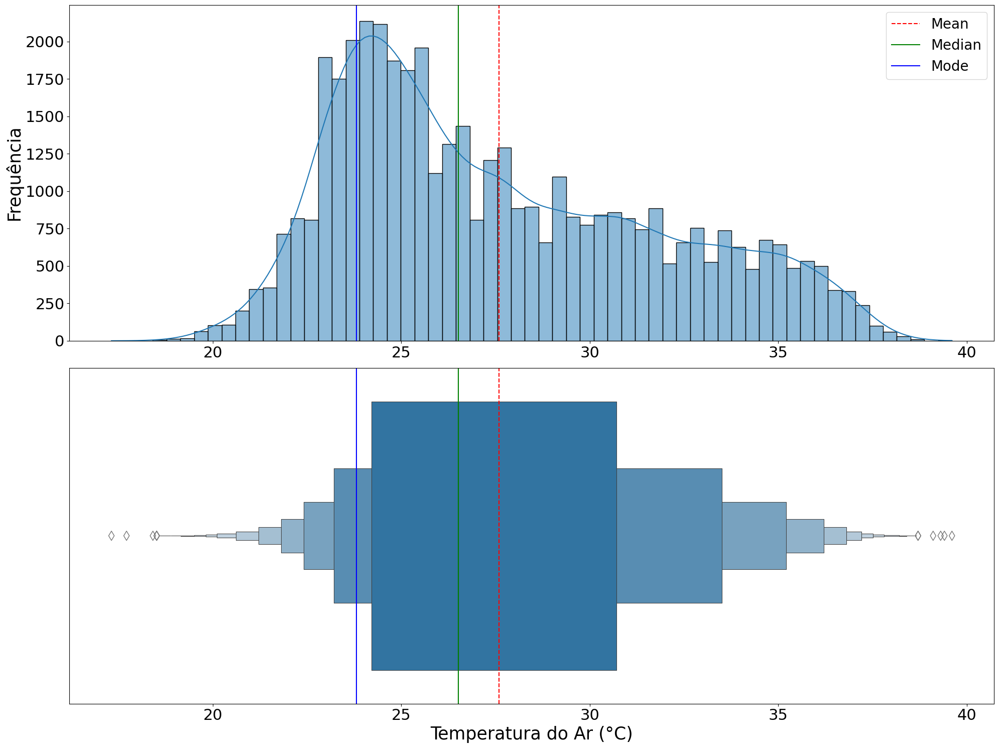

In [229]:
plota_boxplot_geral(data, variavel, label)

Vemos claramente a assimetria dos dados com uma mediana menor do que a média e uma moda ainda menor. Vemos também a dispersão destes.

#### 2.6.6. Boxplot por semana e hora do dia

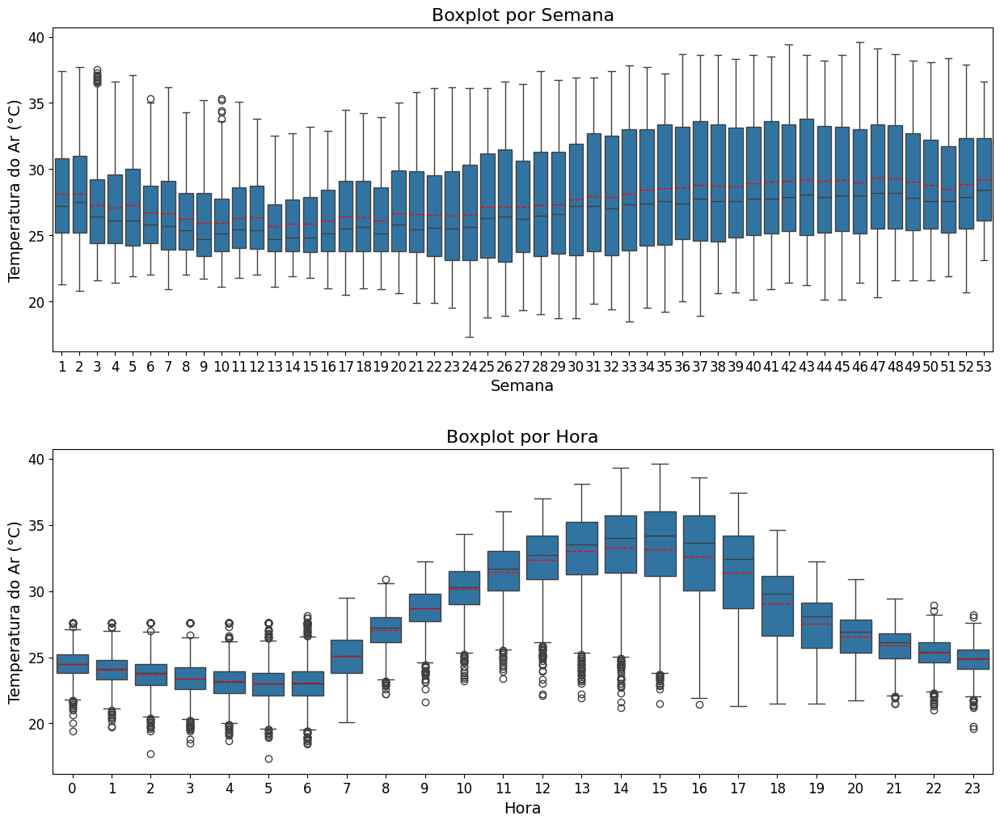

In [230]:
plota_boxplot_semana_hora(data, variavel, label)

Identificamos a média de temperatura relativamente estável durante todo o ano com uma maior variabilidade no segundo semestre. Vemos maiores temperaturas no período da tarde, onde temos menor pressão atmosférica também.

#### 2.6.7. Teste de Estacionariedade (Dickey-Fuller)

In [231]:
dickey_fuller(data, variavel)

ADF Statistic: -9.634476
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [232]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -46.323019
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [233]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -64.430540
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


#### 2.6.8. Decomposição em Tendência e Sazonalidade

##### 2.6.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [234]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

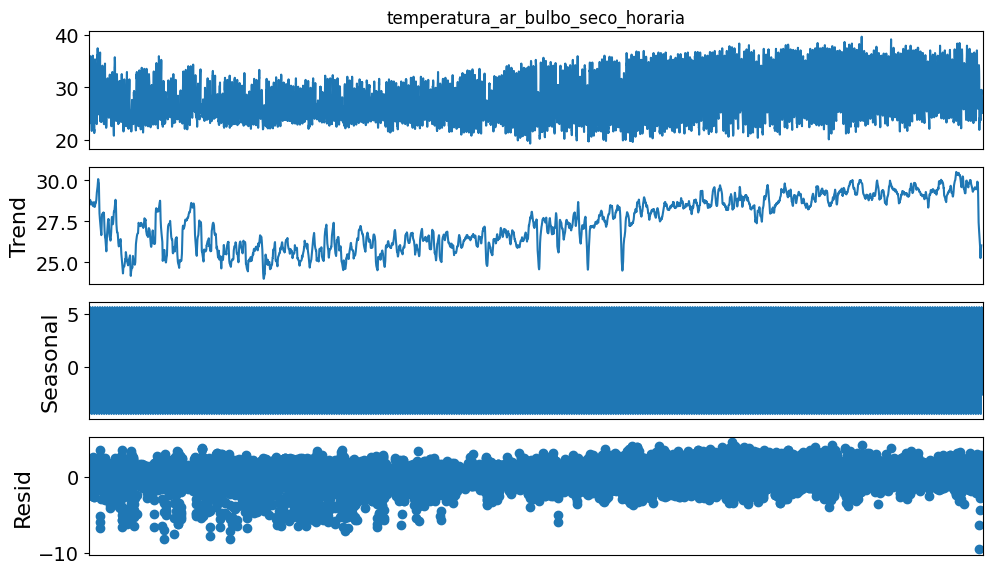

In [235]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.6.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [236]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

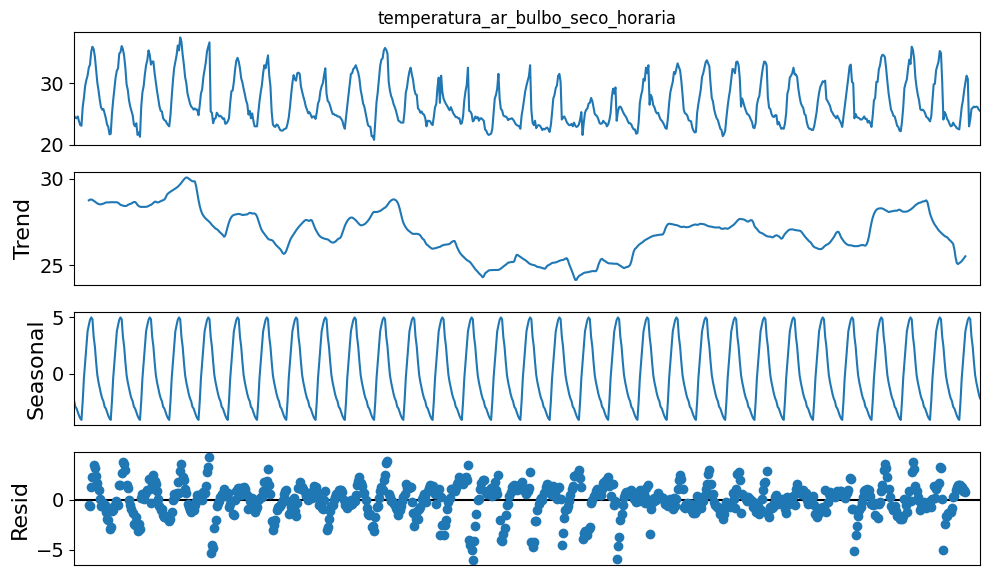

In [237]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.6.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [238]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

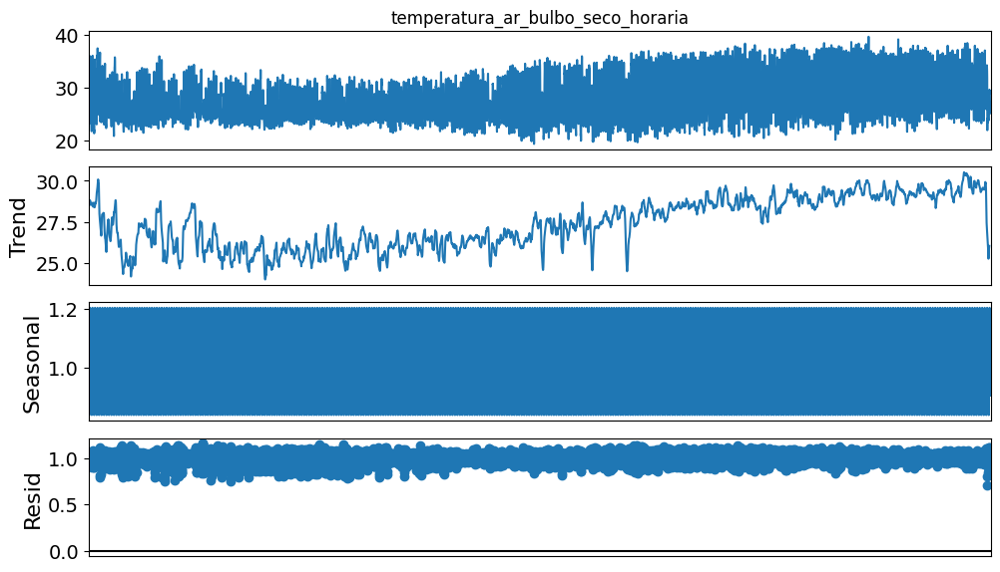

In [239]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.6.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [240]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

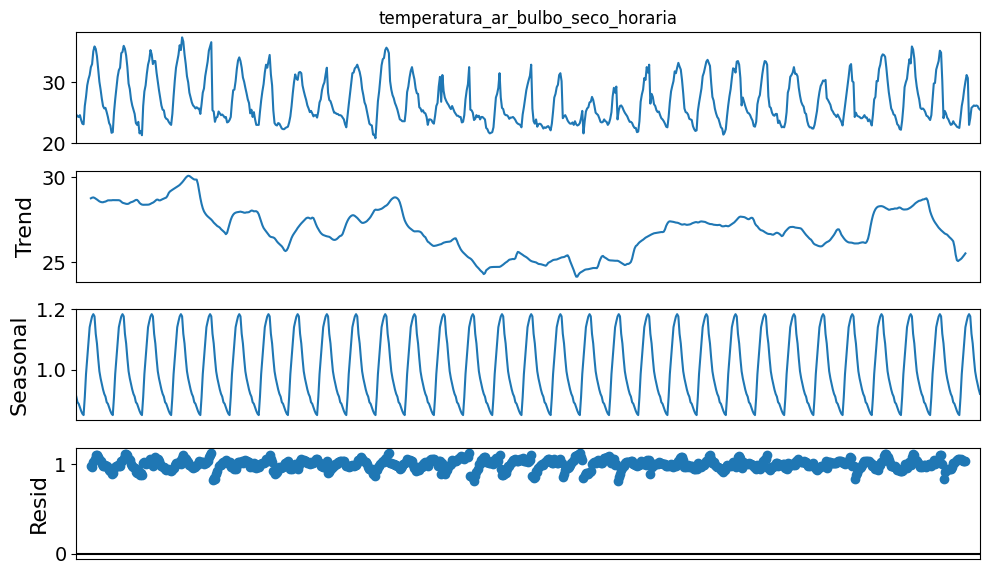

In [241]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

O modelo multiplicativo apresenta menores resíduos. Vemos a tendência de crescimento da temperatura anual e a sazonalidade diária

#### 2.6.9. Análise de Autocorrelação

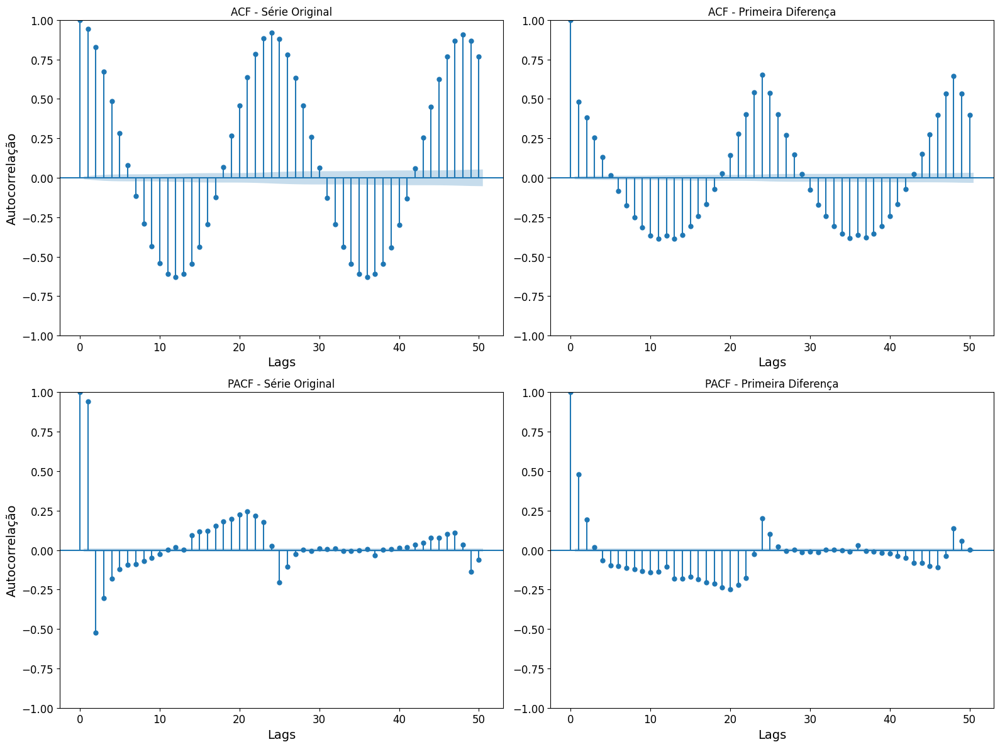

In [242]:
plot_acf_pacf(data, variavel)

Vemos o padrão sazonal dos dados

In [245]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43824 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43824 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  

### 2.7. Umidade Relativa do Ar - EDA univariada

In [250]:
variavel = "umidade_relativa_ar_horaria"
label = "Umidade Relativa do Ar (%)"

#### 2.7.1 Estatísticas descritivas

In [251]:
data[variavel].describe()

count    43824.000000
mean        67.655412
std         20.754611
min         13.010000
25%         52.010000
50%         71.010000
75%         85.010000
max        100.010000
Name: umidade_relativa_ar_horaria, dtype: float64

Média menor que a mediana, logo, assimetria da distribuição. Discrepância entre mínimo e máximo e grande desvio padrão, indicando alta variabilidade.

#### 2.7.2. Coeficiente de Variação

In [252]:
print(calcula_cv(data, variavel))

30.67694184552242


Alta variabilidade da distribuição.

#### 2.7.3. Visualização de perfil

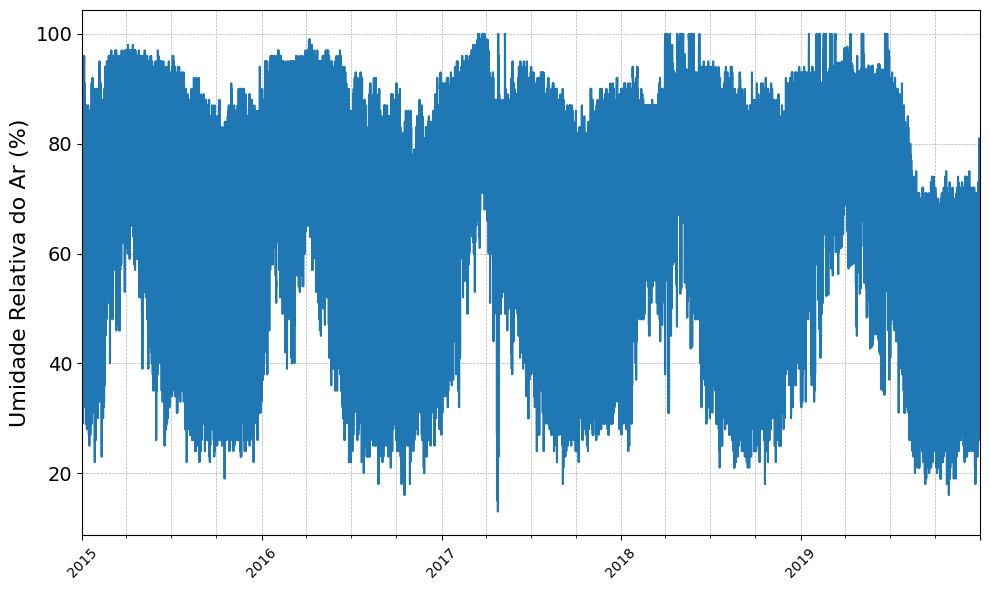

In [253]:
plota_perfil_geral(data, variavel, label)

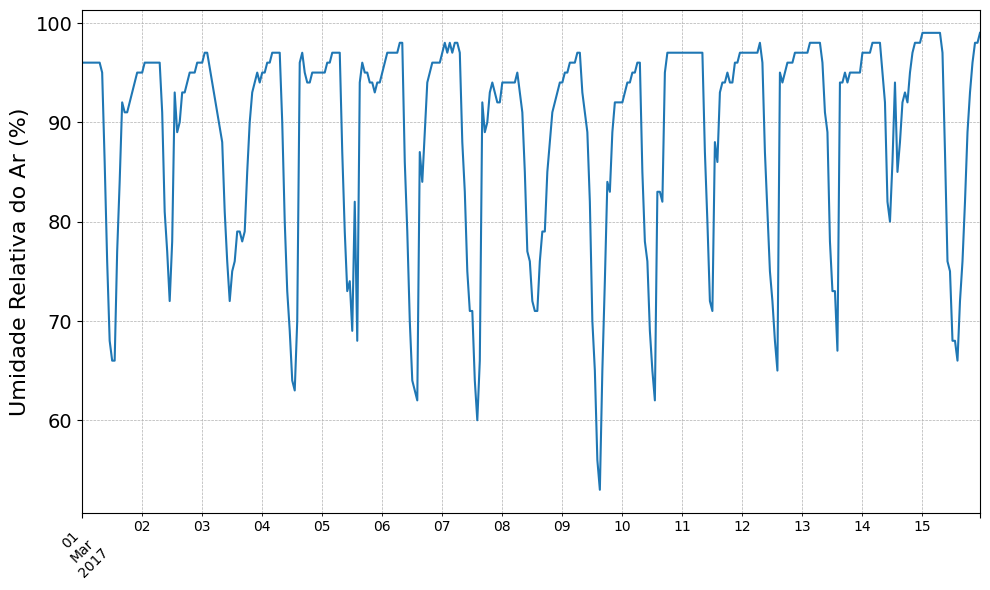

In [254]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

Vemos uma sazonalidade anual aparente dos dados, com uma segunda sazonalidade diária, quando olhamos no detalhe, padrão comum para variáveis atmosféricas

#### 2.7.4. Média móvel e desvio padrão móvel

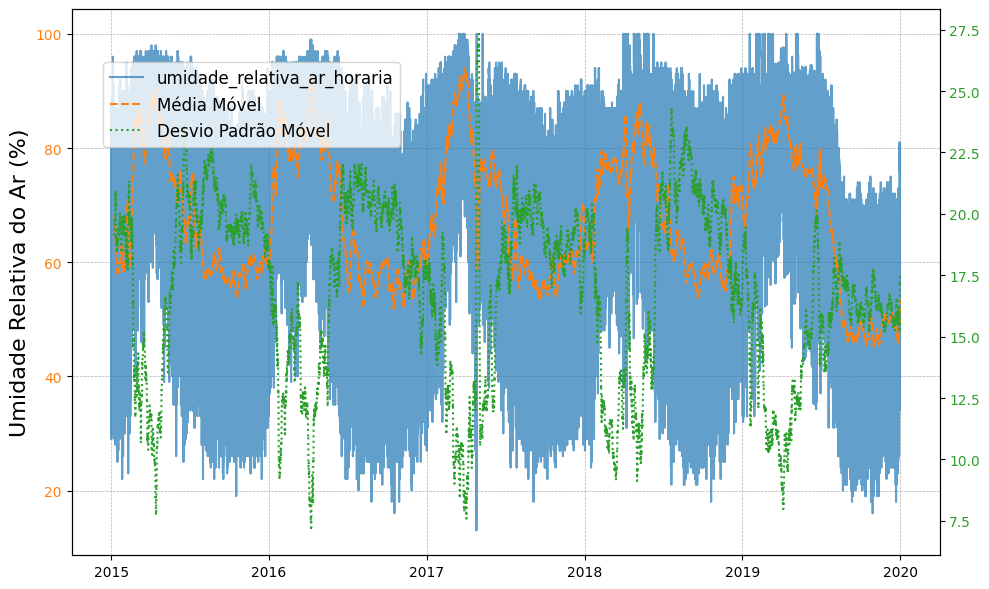

In [255]:
show_estat_moveis(data, variavel, label)

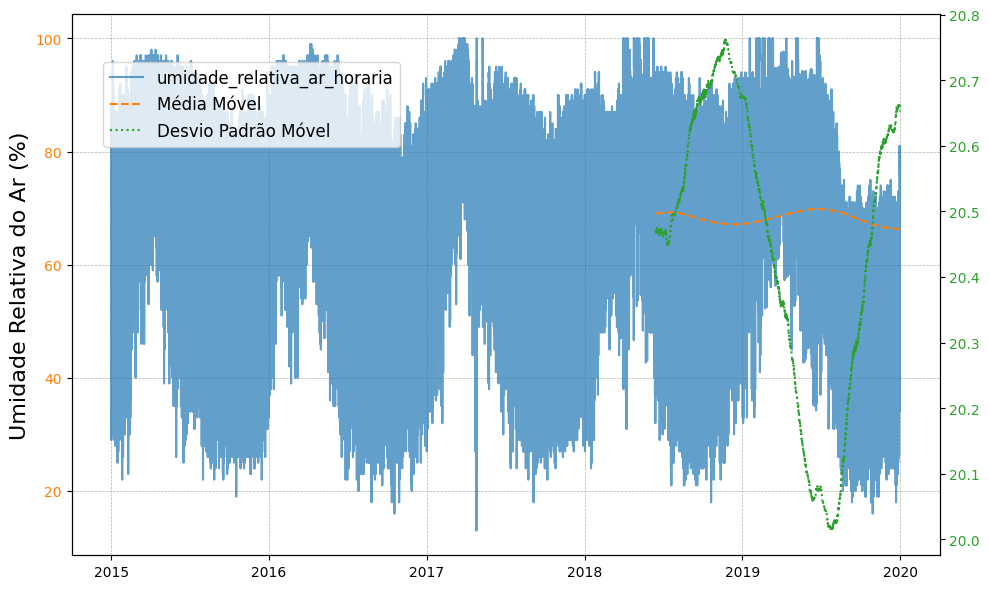

In [256]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

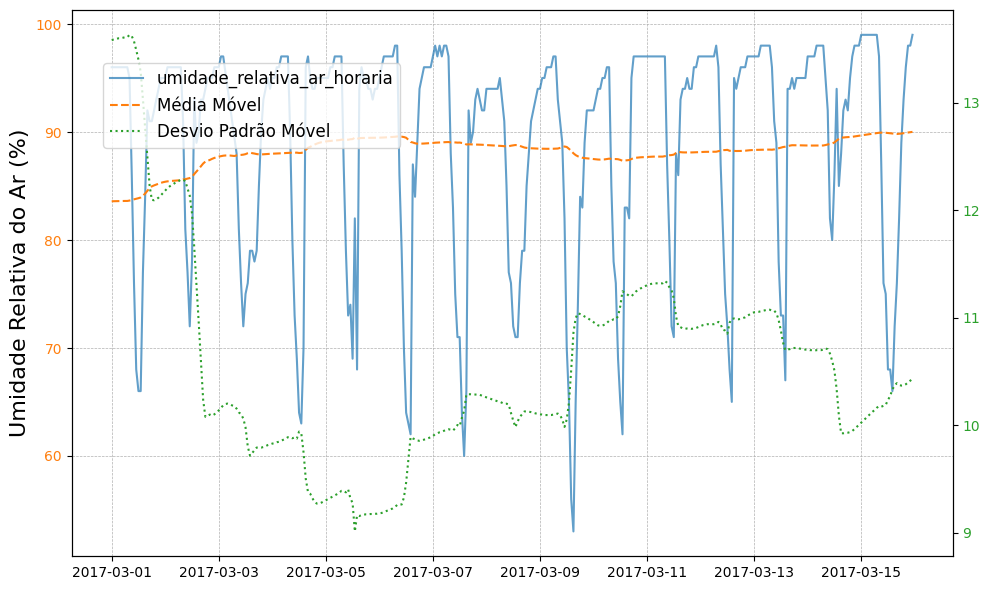

In [257]:
show_estat_moveis(data, variavel, label, inicio, fim)

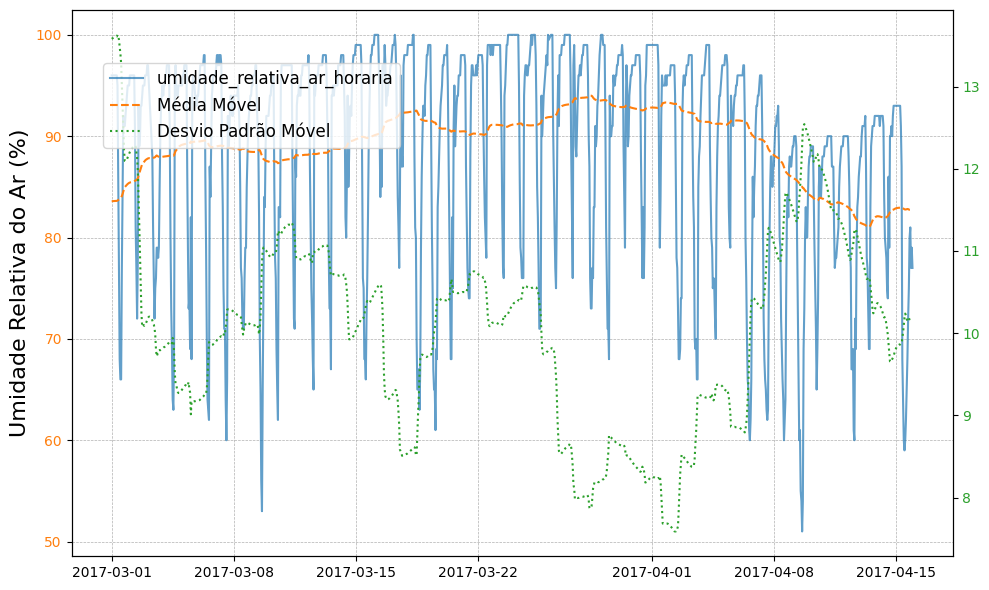

In [258]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

Vemos a média móvel semanal com a sazonalidade anual esperada, porém se considerarmos uma janela maior, vemos que fica relativamente estável em 75%, aproximadamente

#### 2.7.5. Boxplot geral

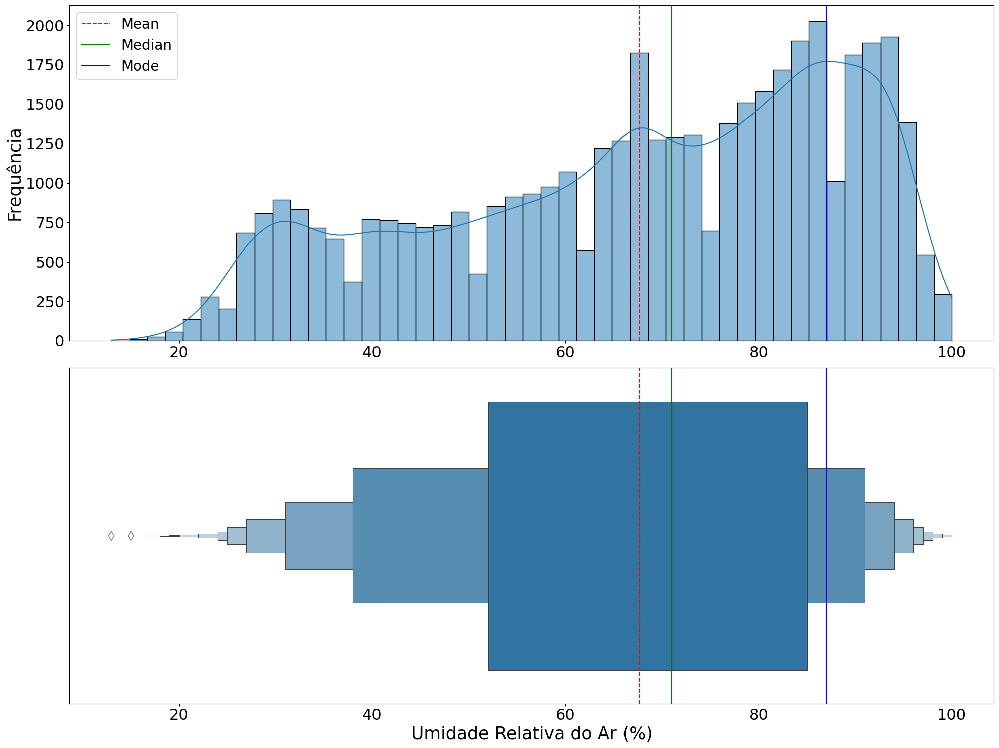

In [259]:
plota_boxplot_geral(data, variavel, label)

Vemos claramente a assimetria dos dados (contrária à temperatura) com uma mediana maior do que a média e uma moda ainda maior. Vemos também a dispersão destes.

#### 2.7.6. Boxplot por semana e hora do dia

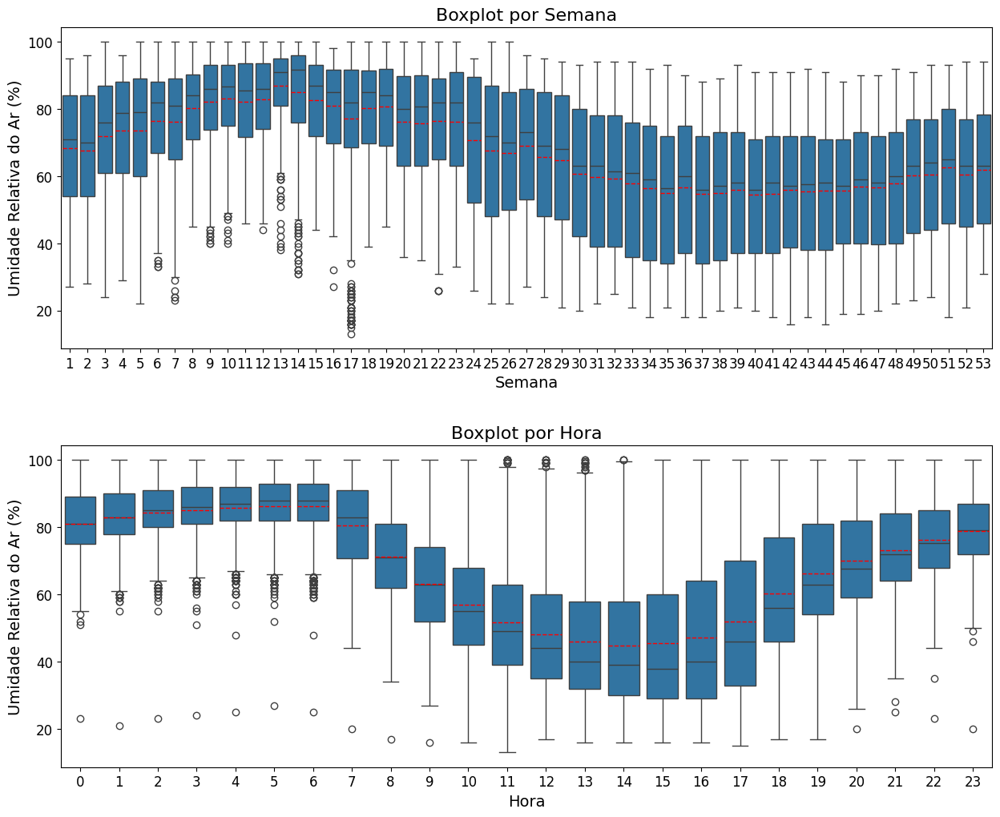

In [260]:
plota_boxplot_semana_hora(data, variavel, label)

Identificamos a média de umidade relativamente estável durante todo o ano com uma maior variabilidade no segundo semestre e maiores valores no primeiro semestre. Vemos menores umidades no período da tarde, onde temos menor pressão atmosférica também.

#### 2.7.7. Teste de Estacionariedade (Dickey-Fuller)

In [261]:
dickey_fuller(data, variavel)

ADF Statistic: -7.642200
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [262]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -46.323019
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [263]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -64.430540
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


Distribuição estacionária ou tendência-estacionária

#### 2.7.8. Decomposição em Tendência e Sazonalidade

##### 2.7.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [264]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

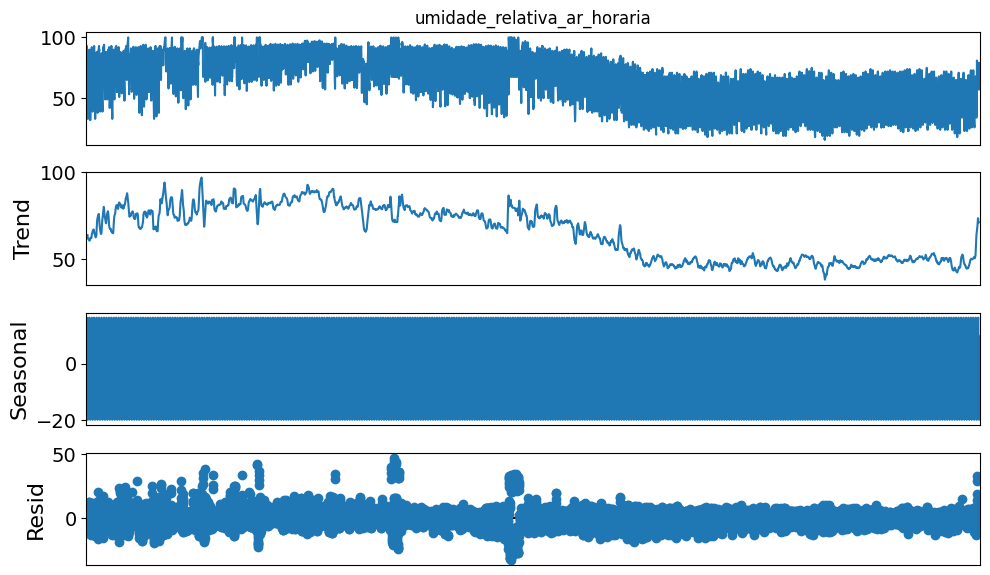

In [265]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.7.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [266]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

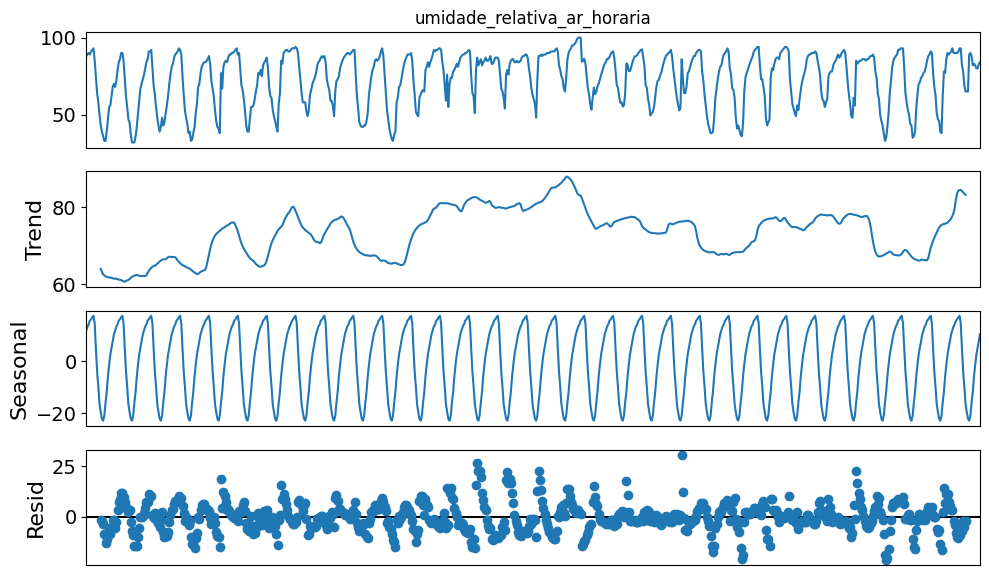

In [267]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.7.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [268]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

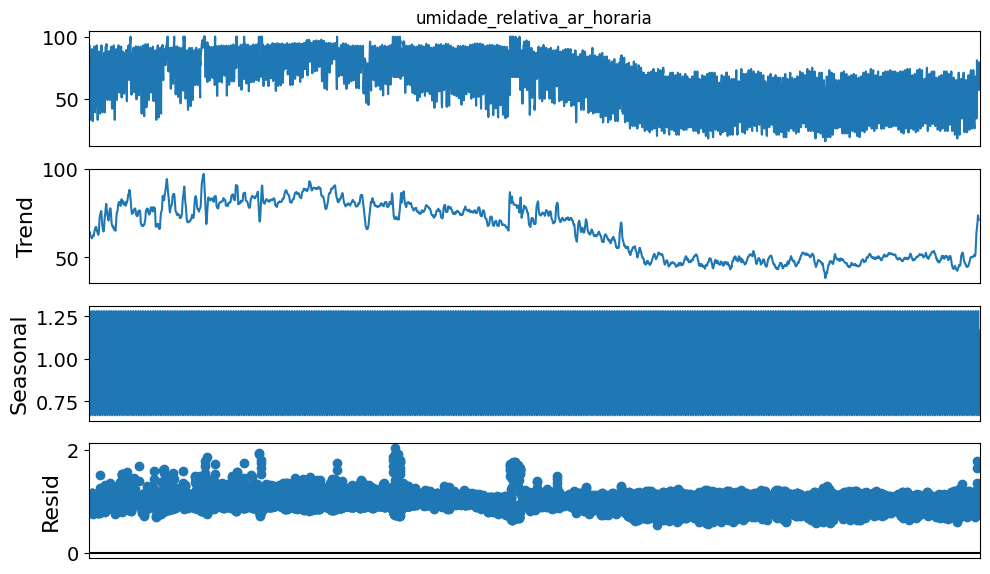

In [269]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.7.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [270]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

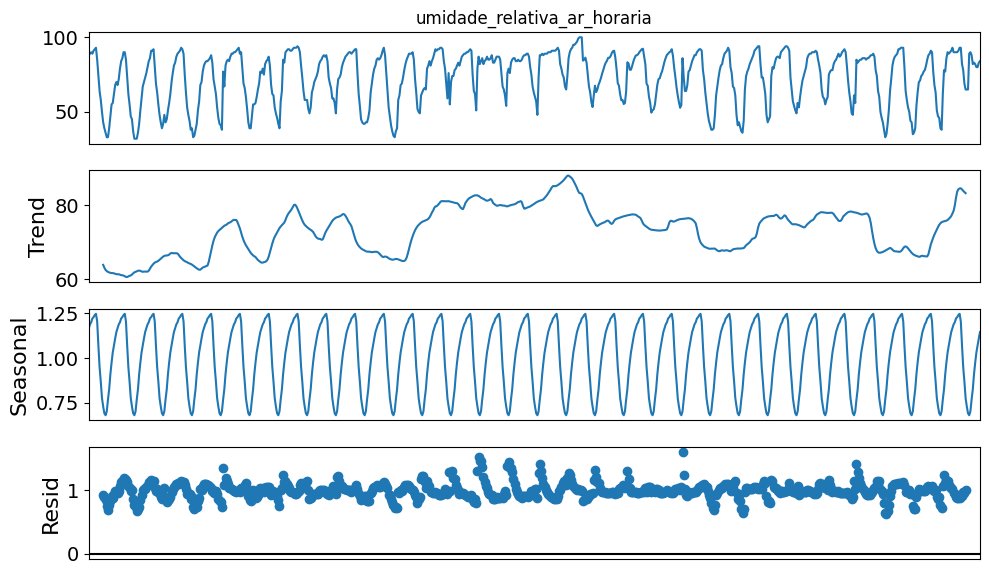

In [271]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

- Menores resíduos para o modelo multiplicativo
- Vemos a tendência de umidade maior no começo do ano e o padrão sazonal diário

#### 2.7.9. Análise de Autocorrelação

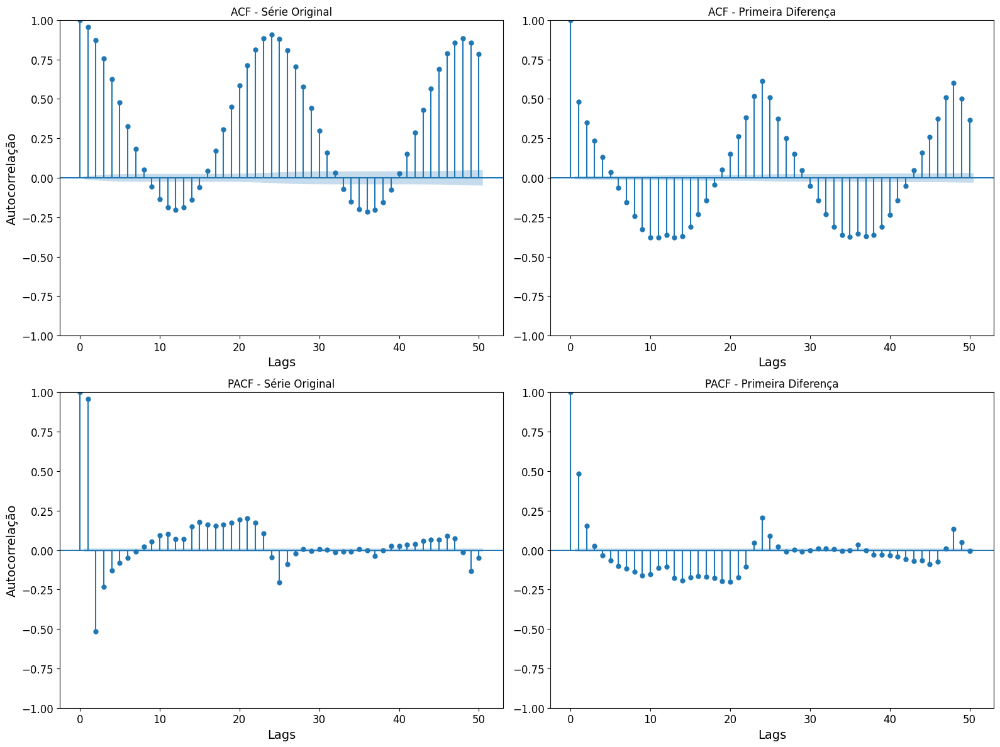

In [272]:
plot_acf_pacf(data, variavel)

Vemos o padrão sazonal dos dados

In [274]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43824 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43824 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  

### 2.8. Direção do Vento - EDA univariada

In [277]:
variavel = "vento_direcao_horaria"
label = "Direção do Vento (°)"

#### 2.8.1 Estatísticas descritivas

In [278]:
data[variavel].describe()

count    43824.000000
mean        97.884749
std         75.176534
min          1.010000
25%         37.010000
50%         78.010000
75%        132.010000
max        347.010000
Name: vento_direcao_horaria, dtype: float64

- Média maior do que a mediana, logo distribuição assimétrica
- Desvio quase da magnitude da média => alta variabilidade

#### 2.8.2. Coeficiente de Variação

In [279]:
print(calcula_cv(data, variavel))

76.80106986396473


Alta variabilidade dos dados

#### 2.8.3. Visualização de perfil

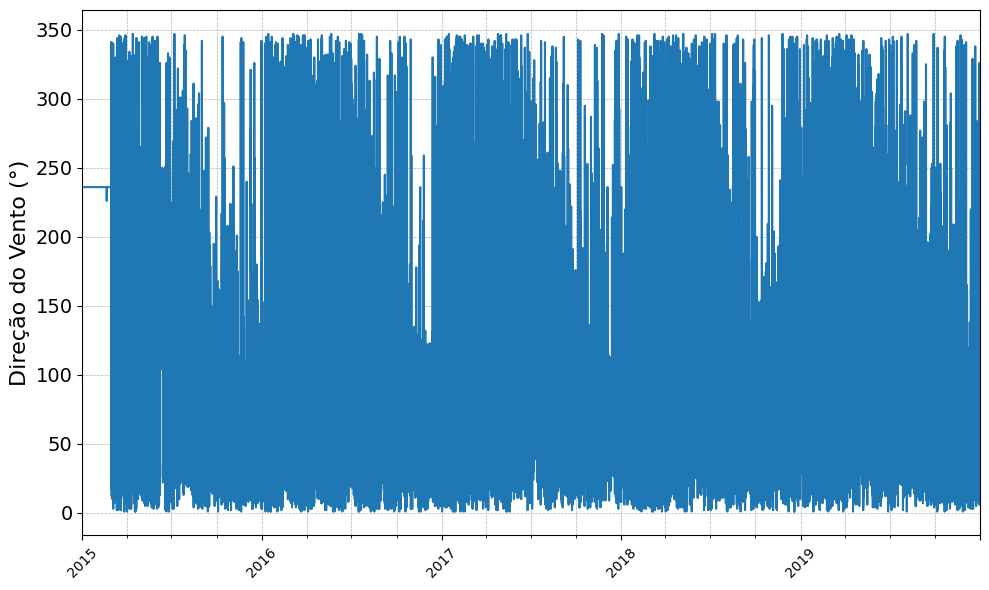

In [280]:
plota_perfil_geral(data, variavel, label)

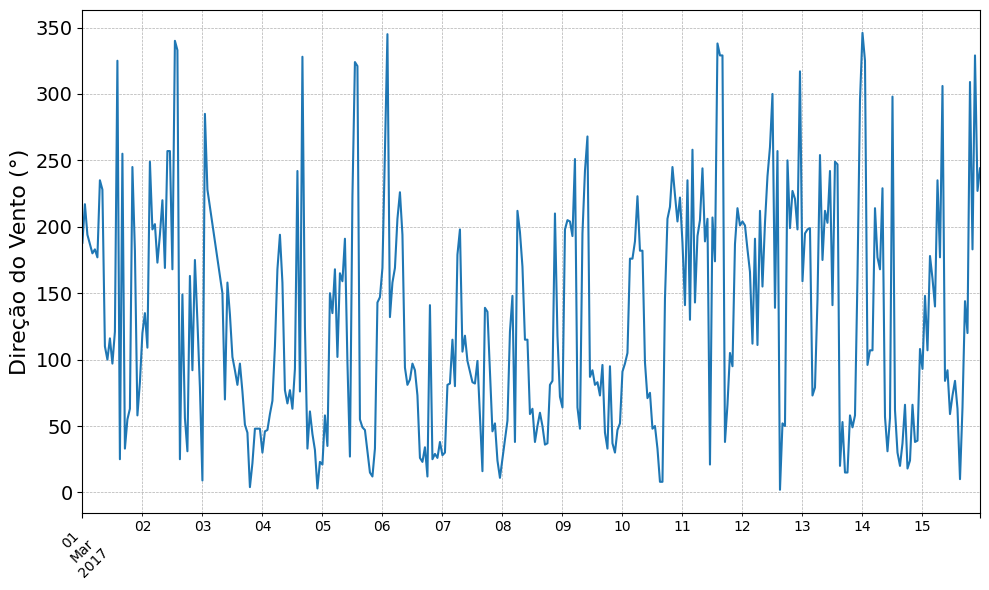

In [281]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

- Temos algum tipo de sazonalidade anual
- Não temos diária

#### 2.8.4. Média móvel e desvio padrão móvel

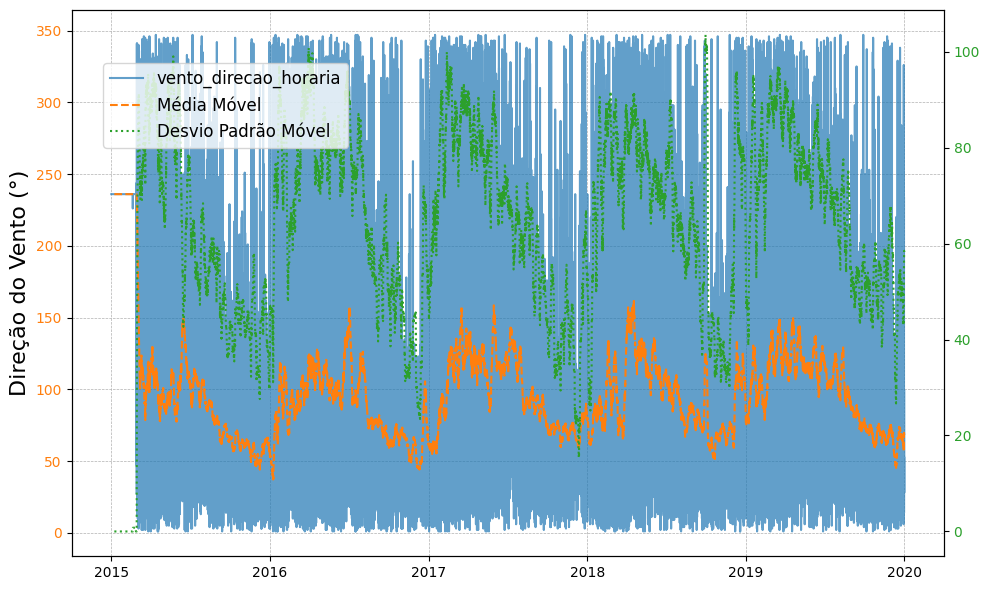

In [282]:
show_estat_moveis(data, variavel, label)

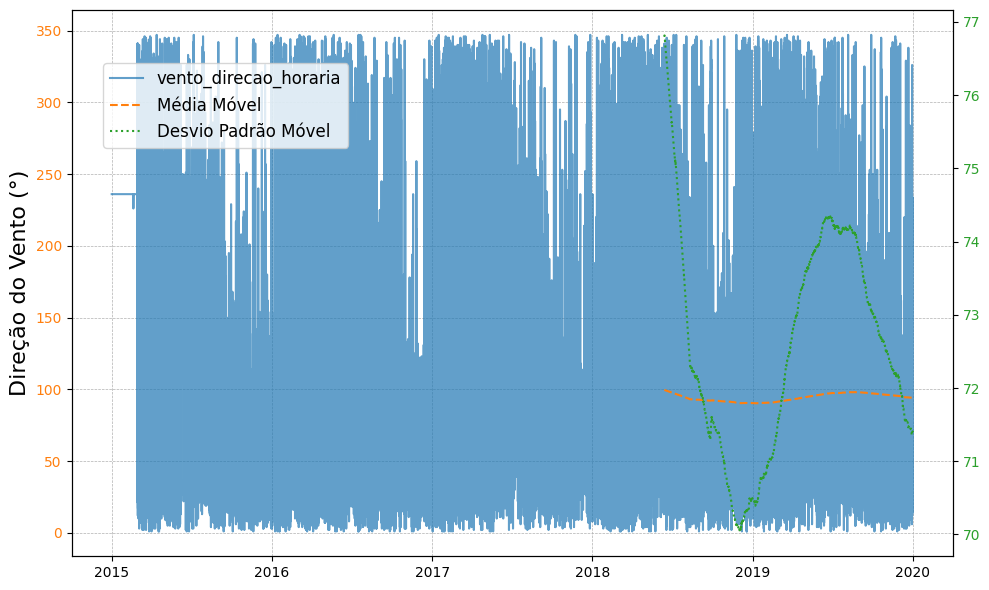

In [283]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

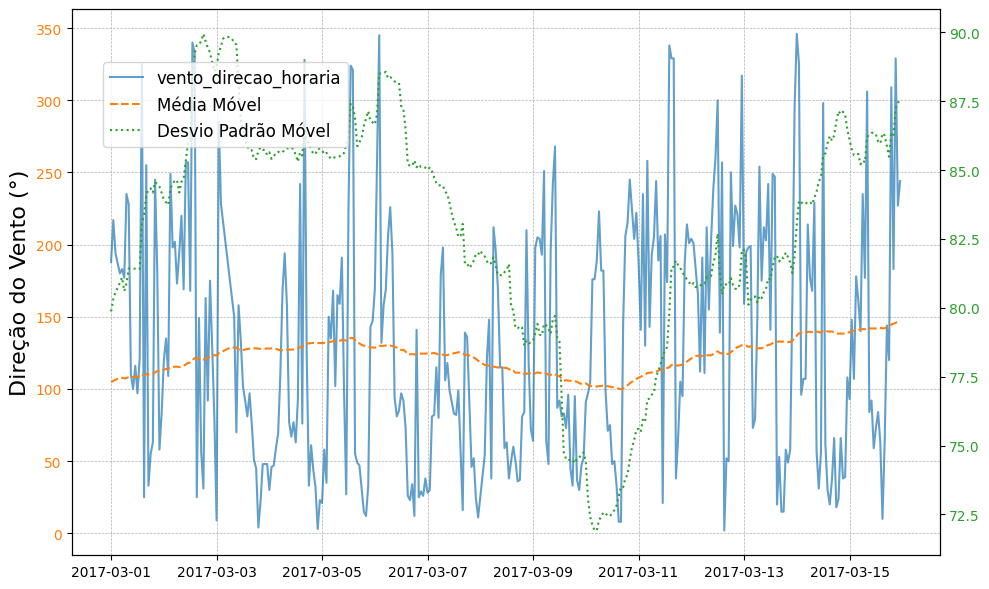

In [284]:
show_estat_moveis(data, variavel, label, inicio, fim)

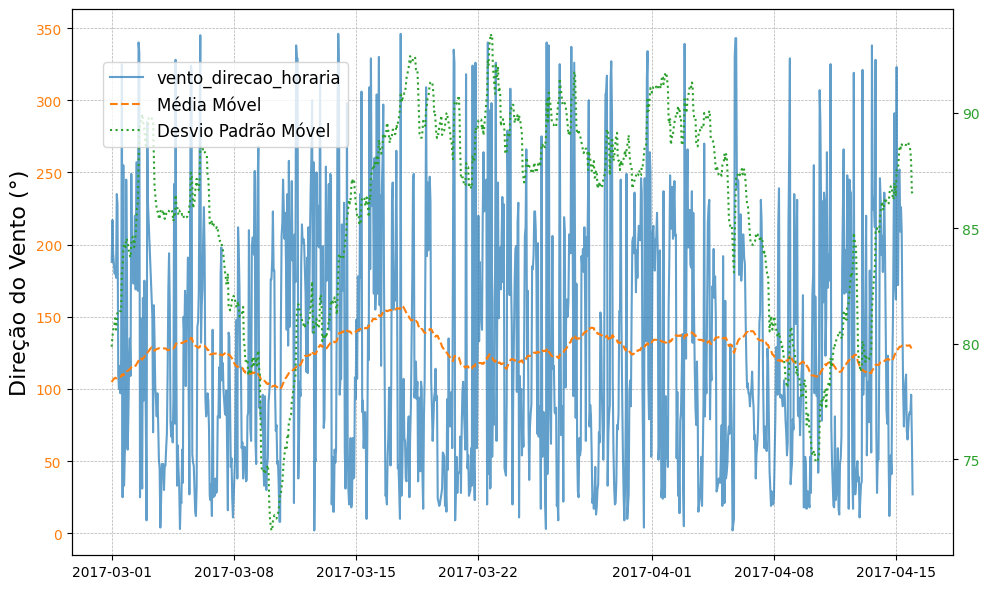

In [285]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

Média estável se considerarmos maior janela

#### 2.8.5. Boxplot geral

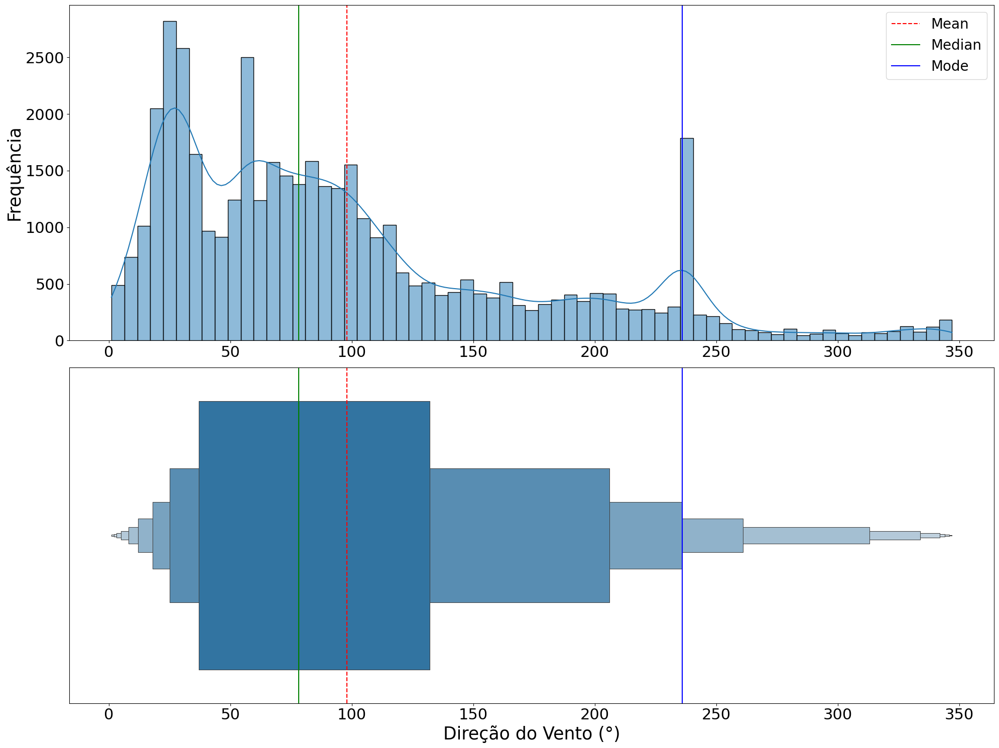

In [286]:
plota_boxplot_geral(data, variavel, label)

Confirmamos a assimetria da distribuição

#### 2.8.6. Boxplot por semana e hora do dia

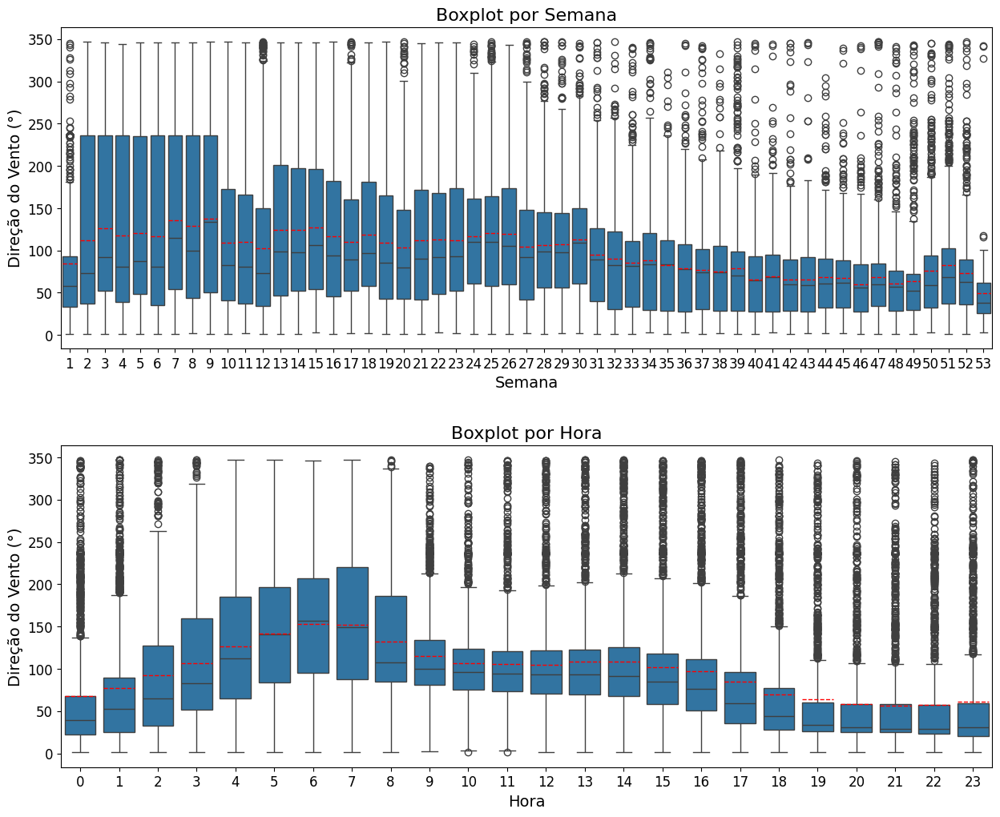

In [287]:
plota_boxplot_semana_hora(data, variavel, label)

- Aparentemente o vento sopra mais próximo dos 160 graus pela manhã e mais próximo dos 50 graus no final do dia

#### 2.8.7. Teste de Estacionariedade (Dickey-Fuller)

In [288]:
dickey_fuller(data, variavel)

ADF Statistic: -11.346825
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [289]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -46.323019
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [290]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -64.430540
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


- Distribuição Estacionária ou Tendência-Estacionária

#### 2.8.8. Decomposição em Tendência e Sazonalidade

##### 2.8.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [291]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

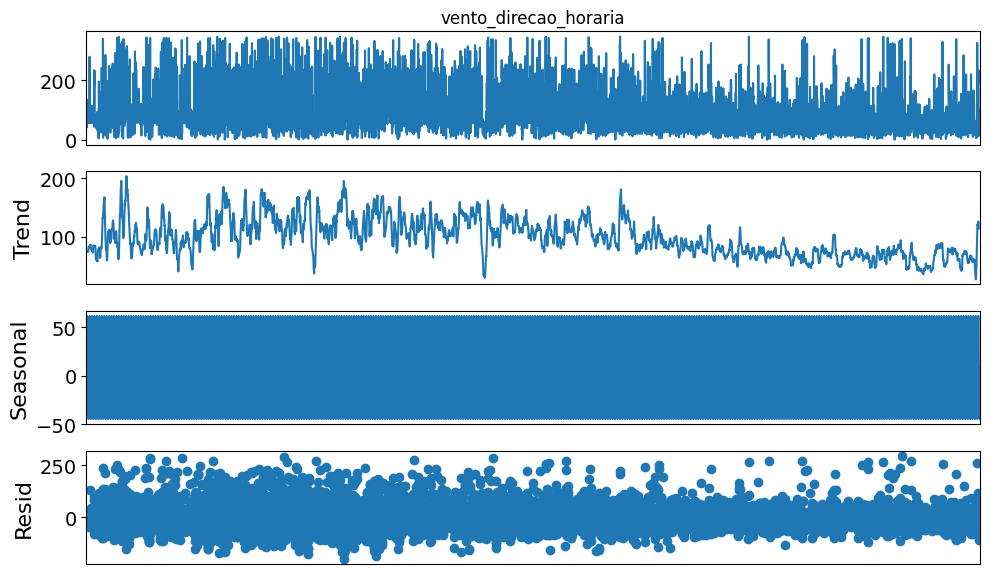

In [292]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.8.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [293]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

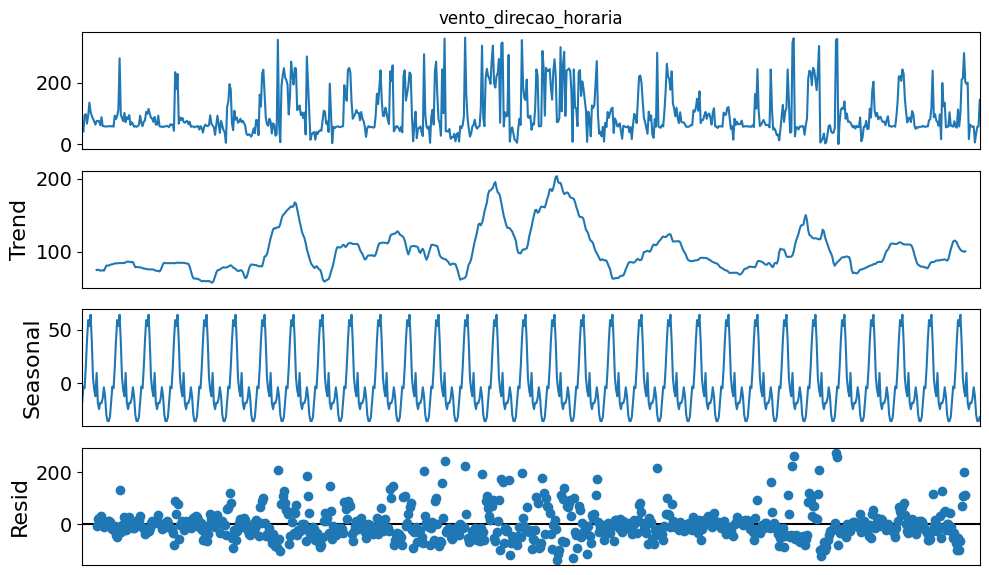

In [294]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.8.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [295]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

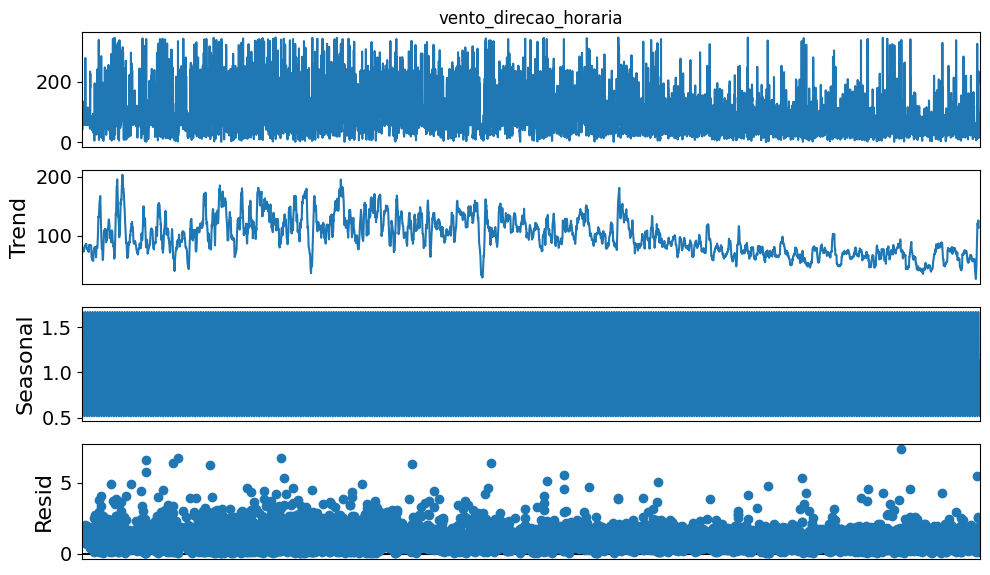

In [296]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.8.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [297]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

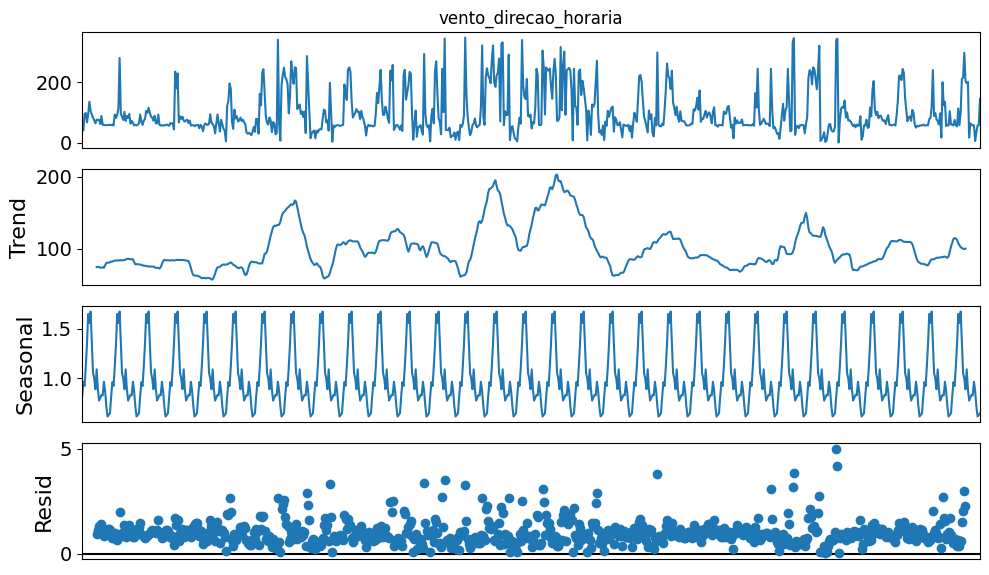

In [298]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

- Modelo multiplicativo captura melhor os dados e, como esperado, a sazonalidade n~åo é muito definitiva para janelas menores

#### 2.8.9. Análise de Autocorrelação

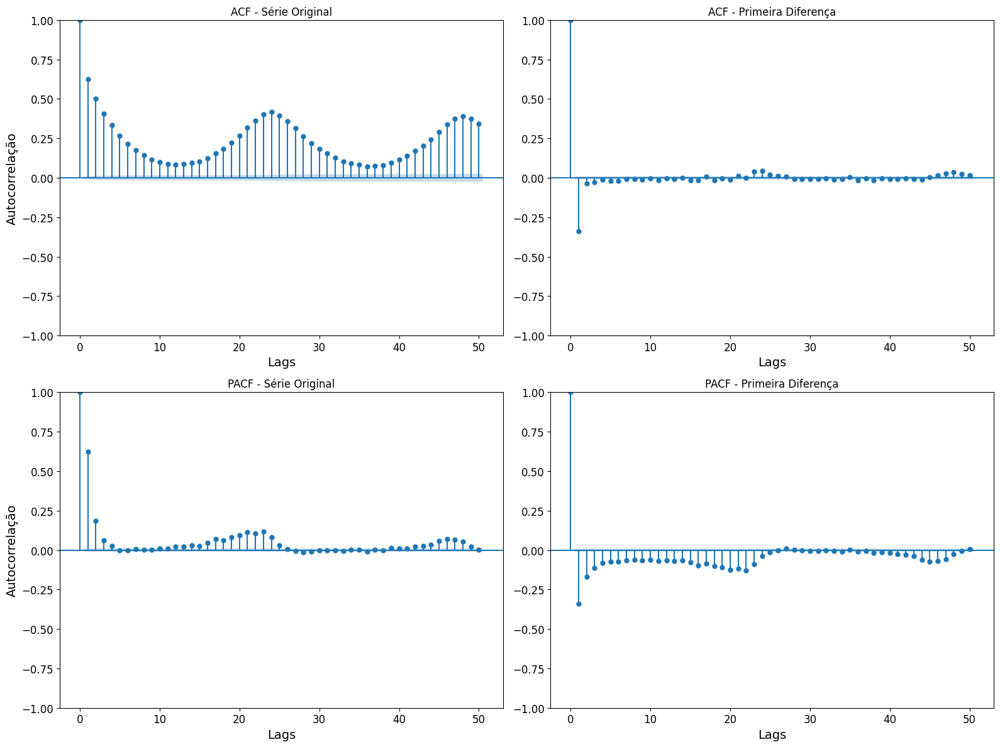

In [299]:
plot_acf_pacf(data, variavel)

In [301]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43824 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43824 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  

### 2.9. Rajada Máxima do Vento - EDA univariada

In [303]:
variavel = "vento_rajada_maxima"
label = "Rajada Máxima (m/s)"

#### 2.9.1 Estatísticas descritivas

In [304]:
data[variavel].describe()

count    43824.000000
mean         4.828462
std          3.629497
min          0.010000
25%          1.610000
50%          4.710000
75%          7.810000
max         17.310000
Name: vento_rajada_maxima, dtype: float64

#### 2.9.2. Coeficiente de Variação

In [305]:
print(calcula_cv(data, variavel))

75.16879761061443


#### 2.9.3. Visualização de perfil

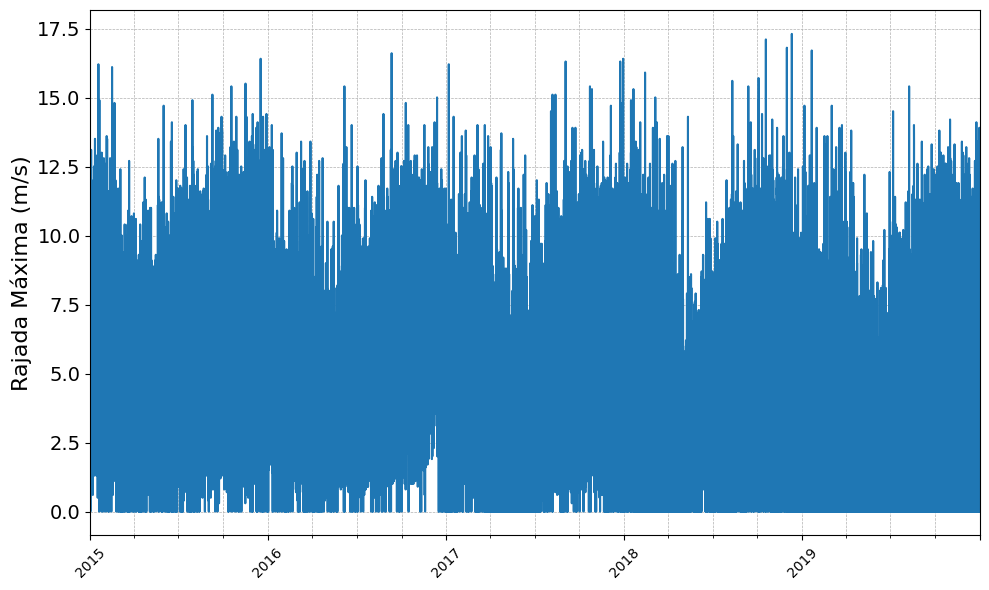

In [306]:
plota_perfil_geral(data, variavel, label)

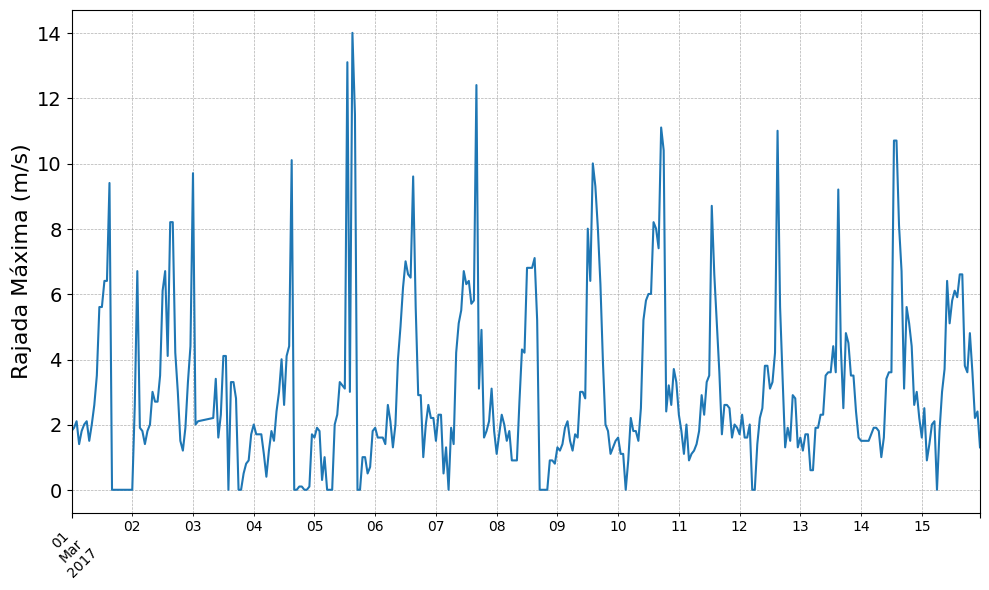

In [307]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

Vemos uma sazonalidade anual e uma leve sazonalidade diária

#### 2.9.4. Média móvel e desvio padrão móvel

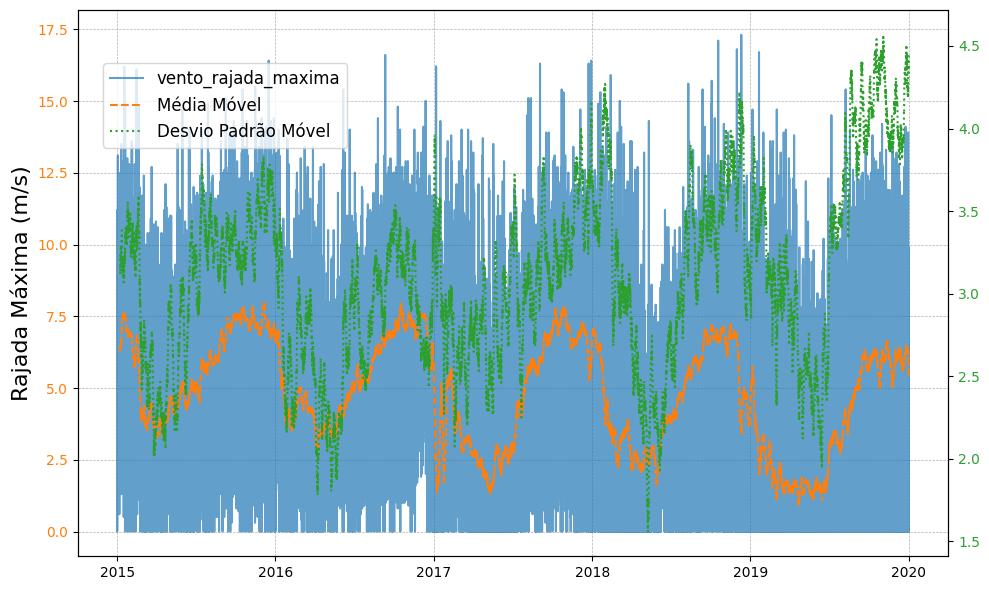

In [308]:
show_estat_moveis(data, variavel, label)

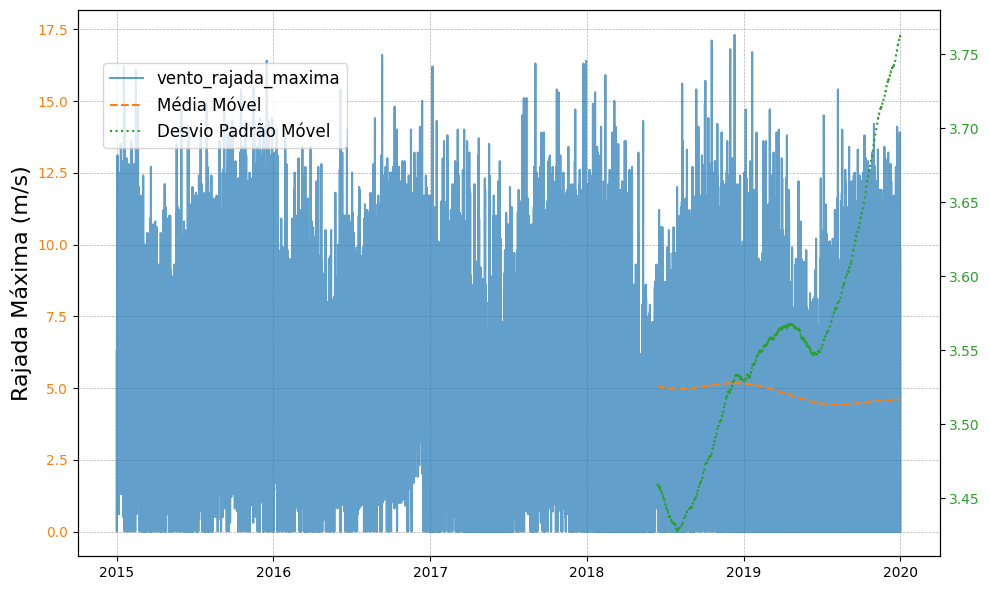

In [309]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

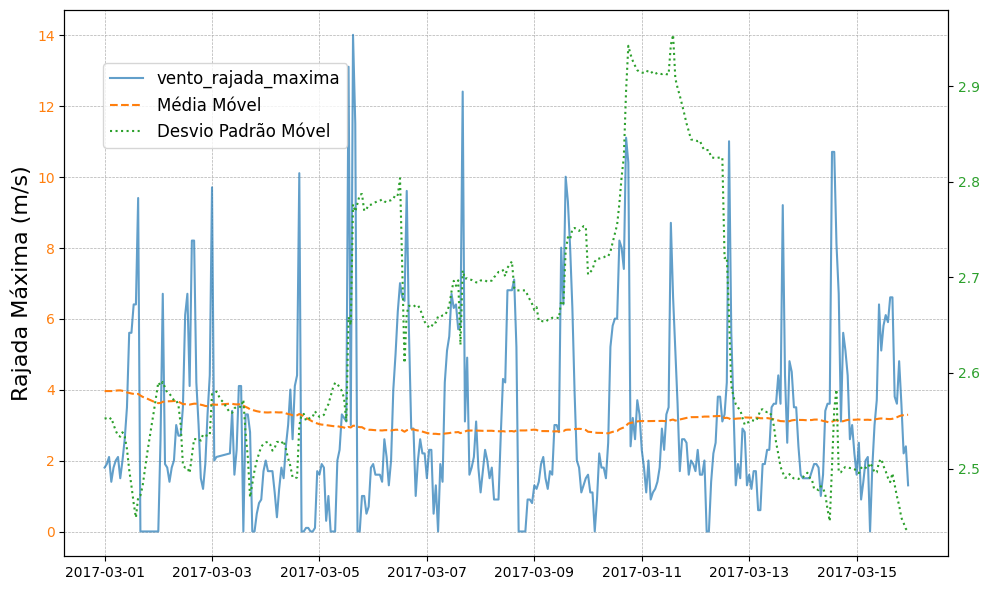

In [310]:
show_estat_moveis(data, variavel, label, inicio, fim)

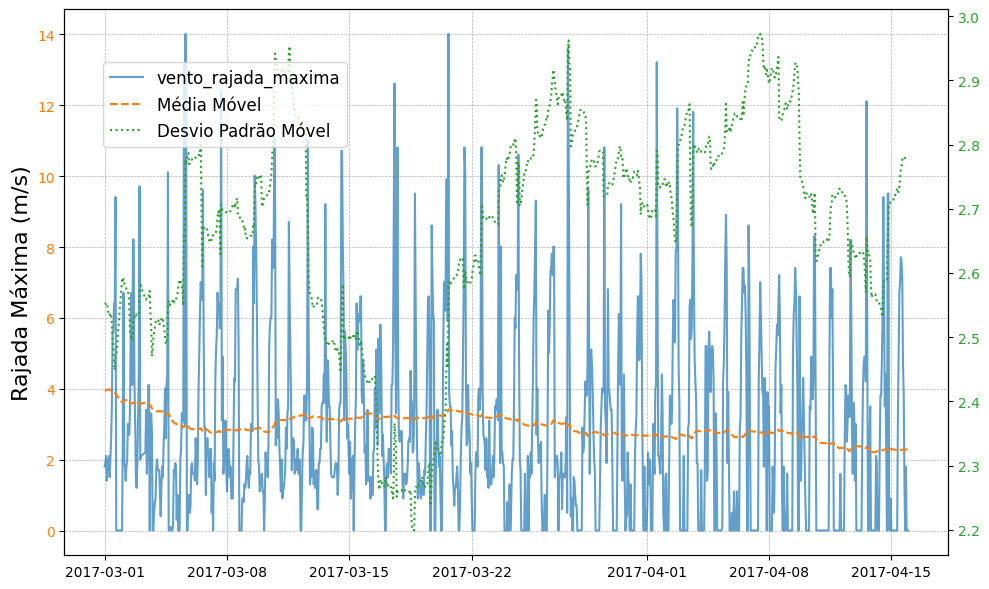

In [311]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

- Mesmo padrão para as outras variáveis

#### 2.9.5. Boxplot geral

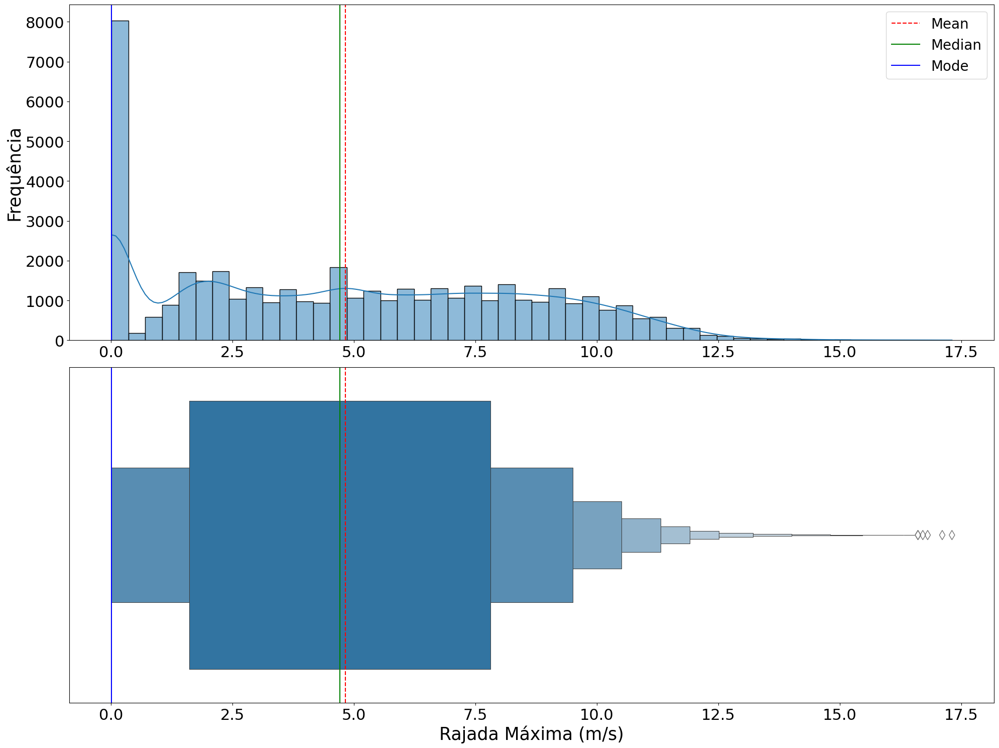

In [312]:
plota_boxplot_geral(data, variavel, label)

Vemos uma distribuição com baixa assimetria mas com moda bem desviantes da média-mediana. Maior parte dos valores iguais a 0 (sem vento).

#### 2.9.6. Boxplot por semana e hora do dia

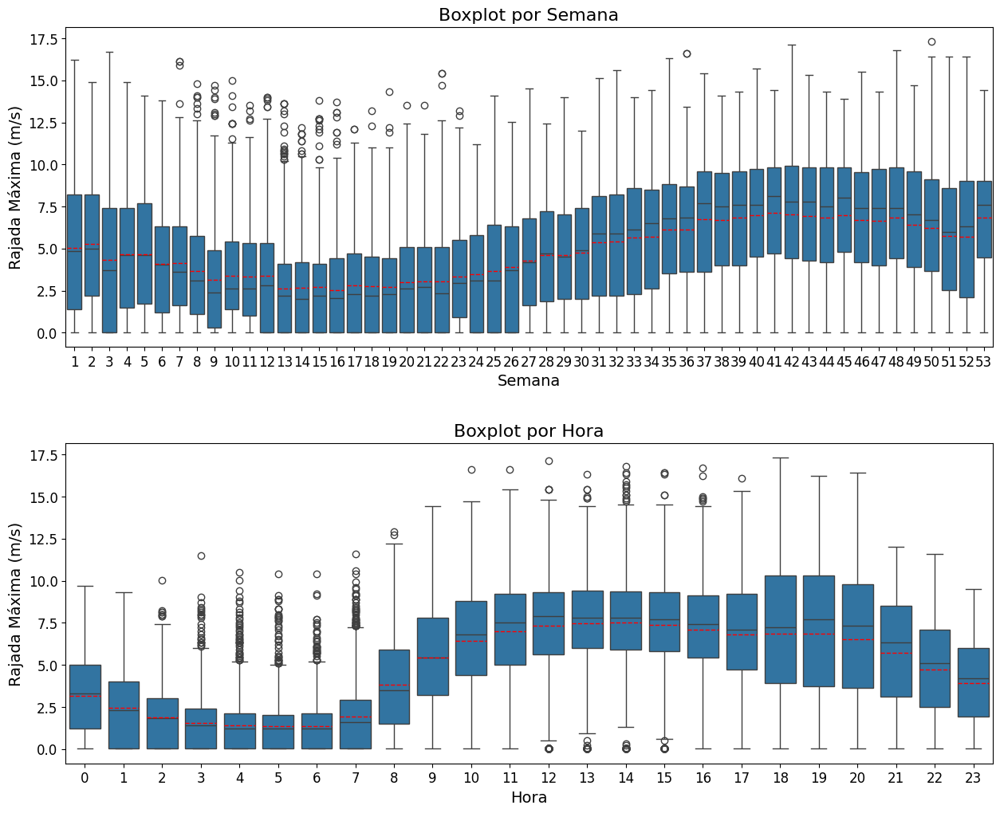

In [313]:
plota_boxplot_semana_hora(data, variavel, label)

- Menores valores de Rajada Máxima no primeiro semestre e maiores valores no segundo semestre
- Maiores valores no período da tarde - início da noite

#### 2.9.7. Teste de Estacionariedade (Dickey-Fuller)

In [314]:
dickey_fuller(data, variavel)

ADF Statistic: -7.089155
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [315]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -46.323019
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [316]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -64.430540
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


- Distribuição estacionária ou tendência-estacionária

#### 2.9.8. Decomposição em Tendência e Sazonalidade

##### 2.9.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [317]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

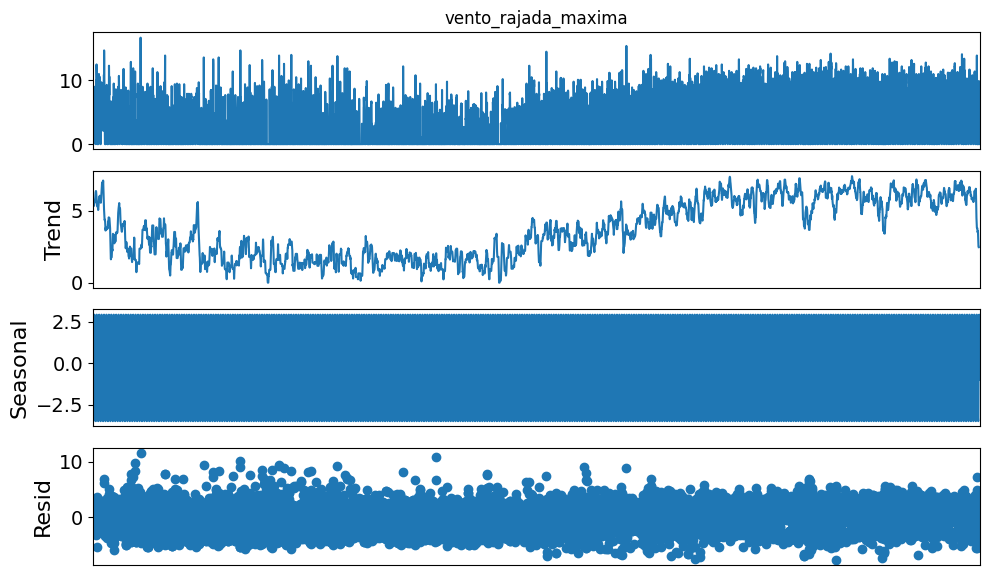

In [318]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.9.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [319]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

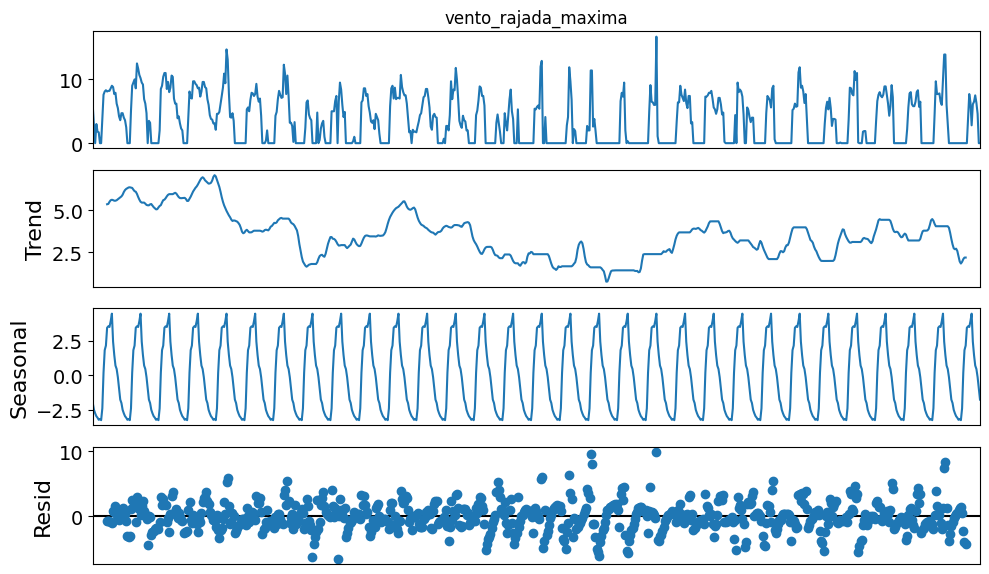

In [320]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.9.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [321]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

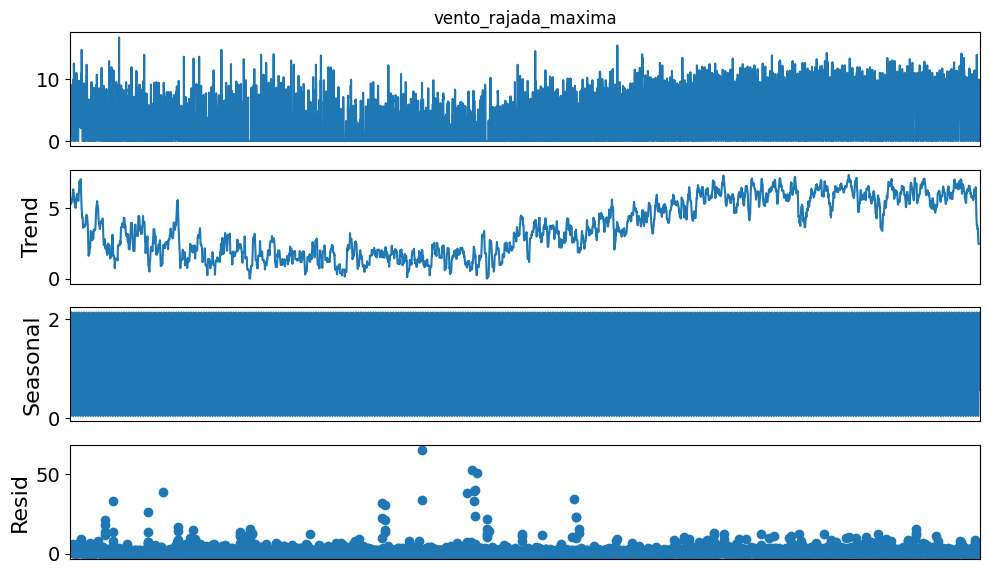

In [322]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.9.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [323]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

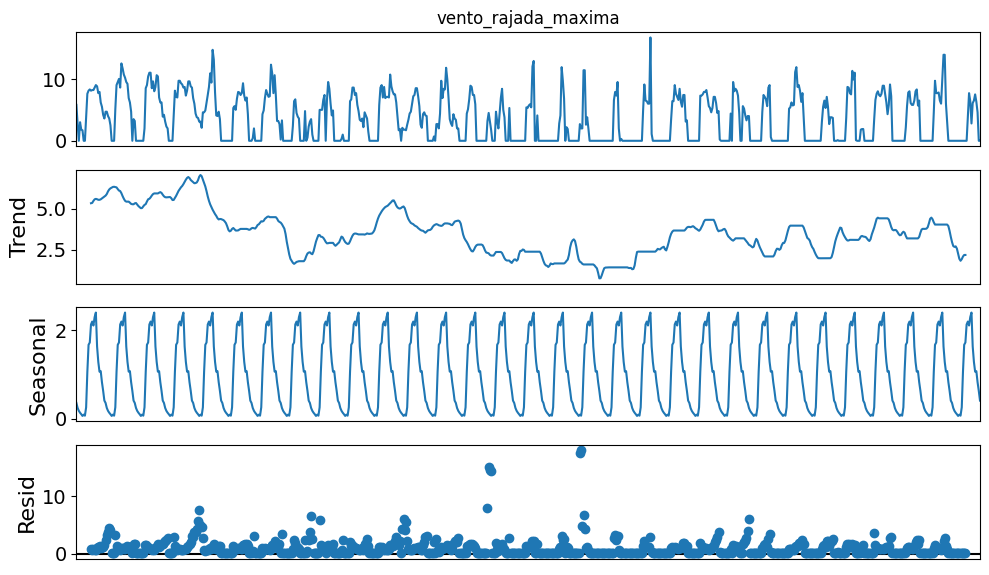

In [324]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

- Modelo aditivo com menores resíduos
- Sazonalidade verificada

#### 2.9.9. Análise de Autocorrelação

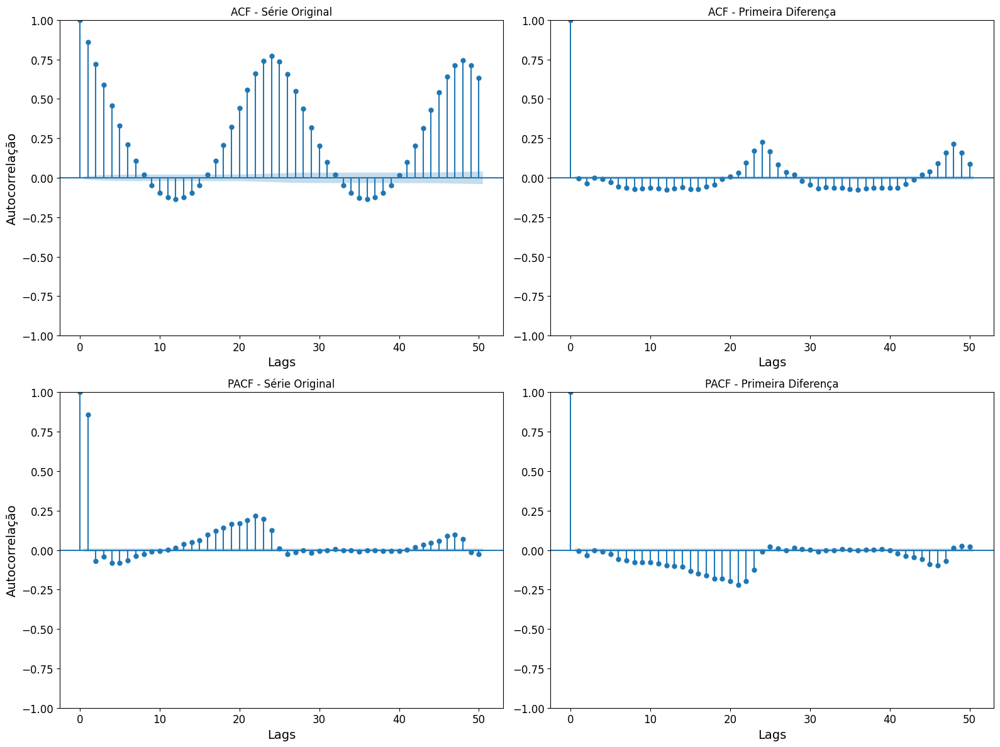

In [325]:
plot_acf_pacf(data, variavel)

- Mais uma vez, conseguimos identificar a sazonalidade dos dados

In [327]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43824 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43824 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  

### 2.10. Velocidade do Vento - EDA univariada

In [328]:
variavel = "vento_velocidade_horaria"
label = "Velocidade do Vento (m/s)"

#### 2.10.1 Estatísticas descritivas

In [329]:
data[variavel].describe()

count    43824.000000
mean         1.718914
std          1.745597
min          0.010000
25%          0.010000
50%          1.310000
75%          3.010000
max          7.510000
Name: vento_velocidade_horaria, dtype: float64

#### 2.10.2. Coeficiente de Variação

In [330]:
print(calcula_cv(data, variavel))

101.55233458712809


#### 2.10.3. Visualização de perfil

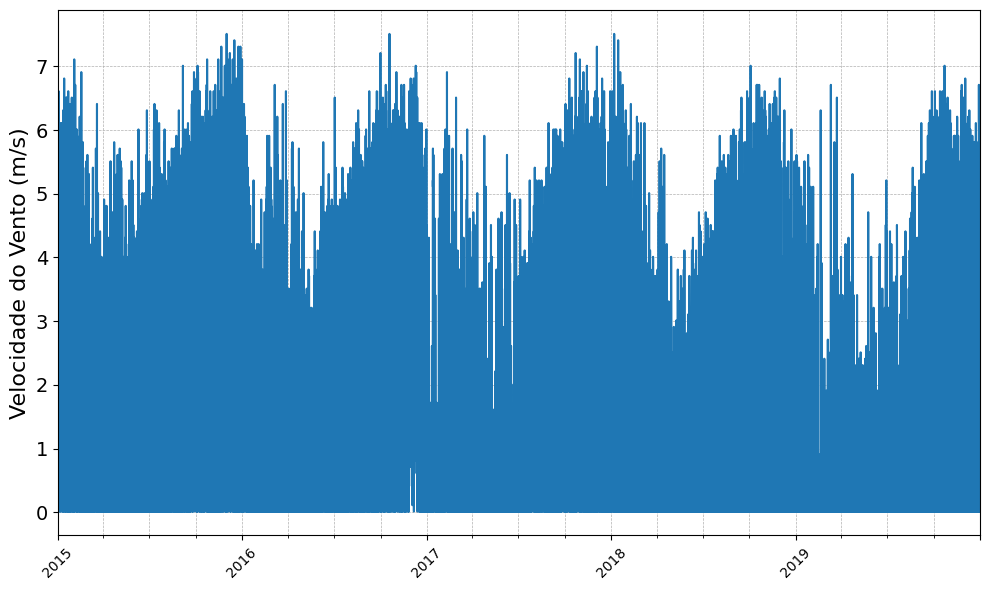

In [331]:
plota_perfil_geral(data, variavel, label)

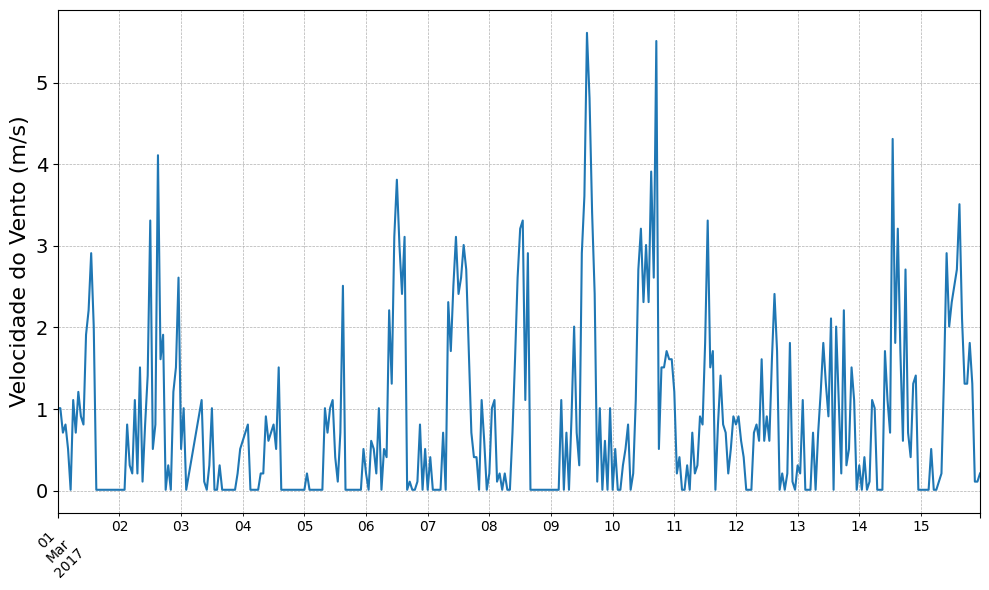

In [332]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

- Vemos o perfil sazonal anual e um leve perfil diário

#### 2.10.4. Média móvel e desvio padrão móvel

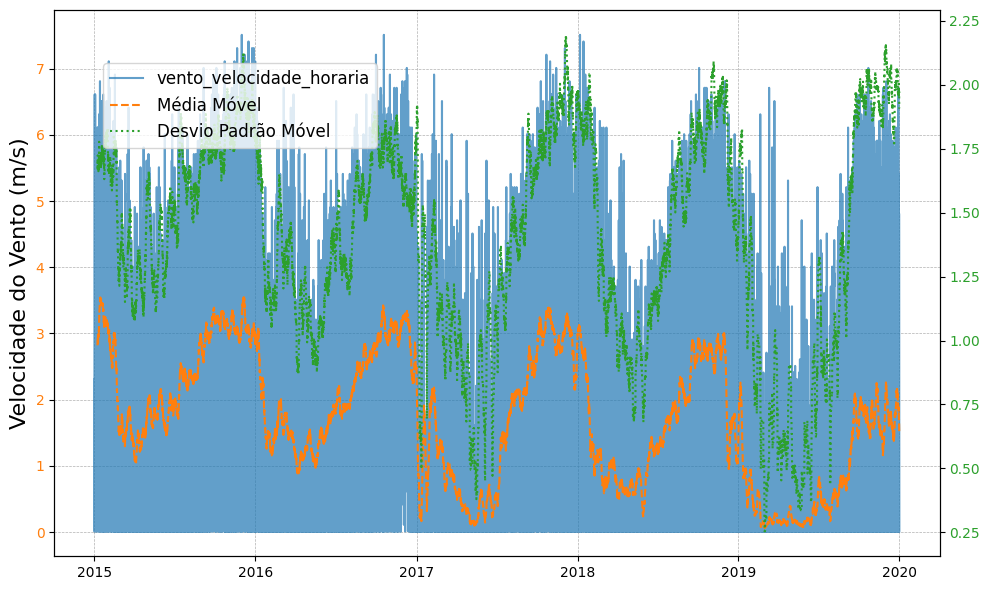

In [333]:
show_estat_moveis(data, variavel, label)

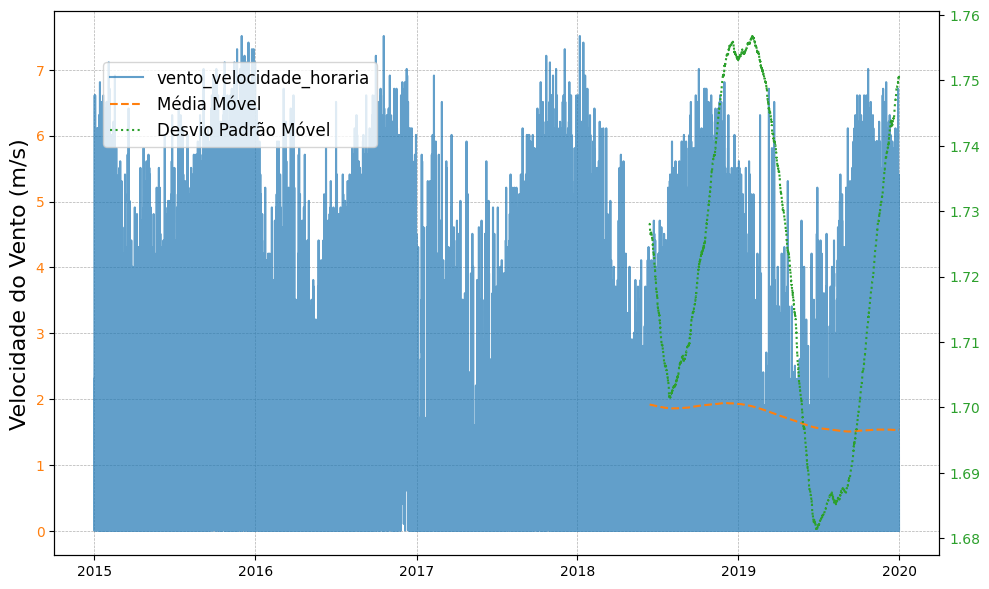

In [334]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

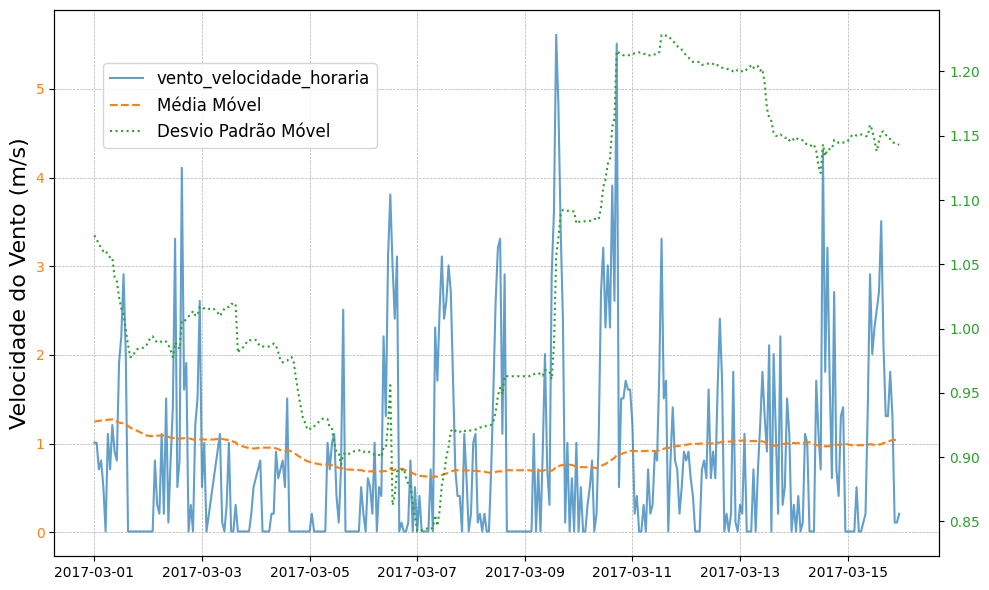

In [335]:
show_estat_moveis(data, variavel, label, inicio, fim)

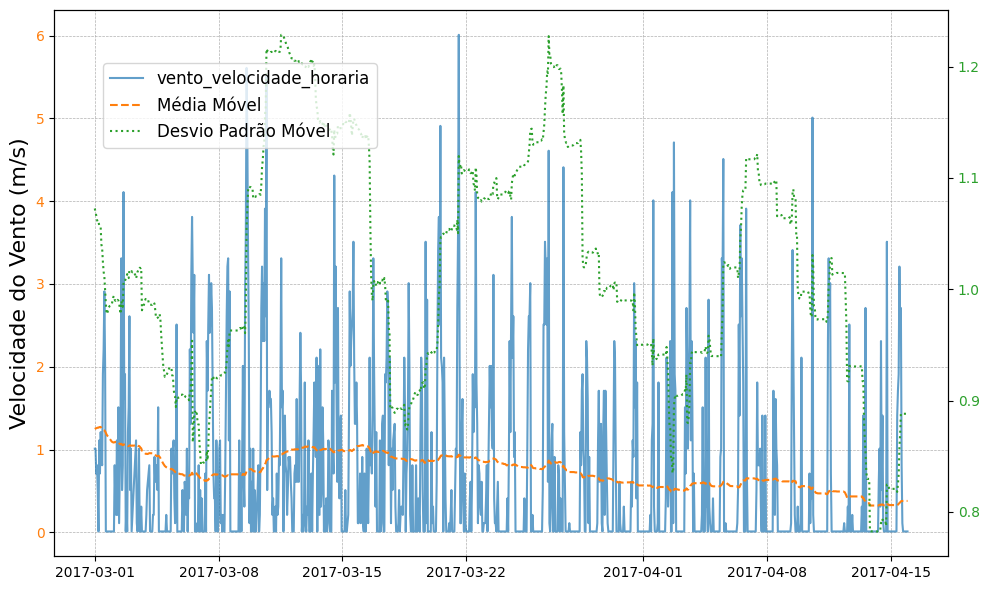

In [336]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

- Valores parecem ter uma tendência de queda no passar dos anos

#### 2.10.5. Boxplot geral

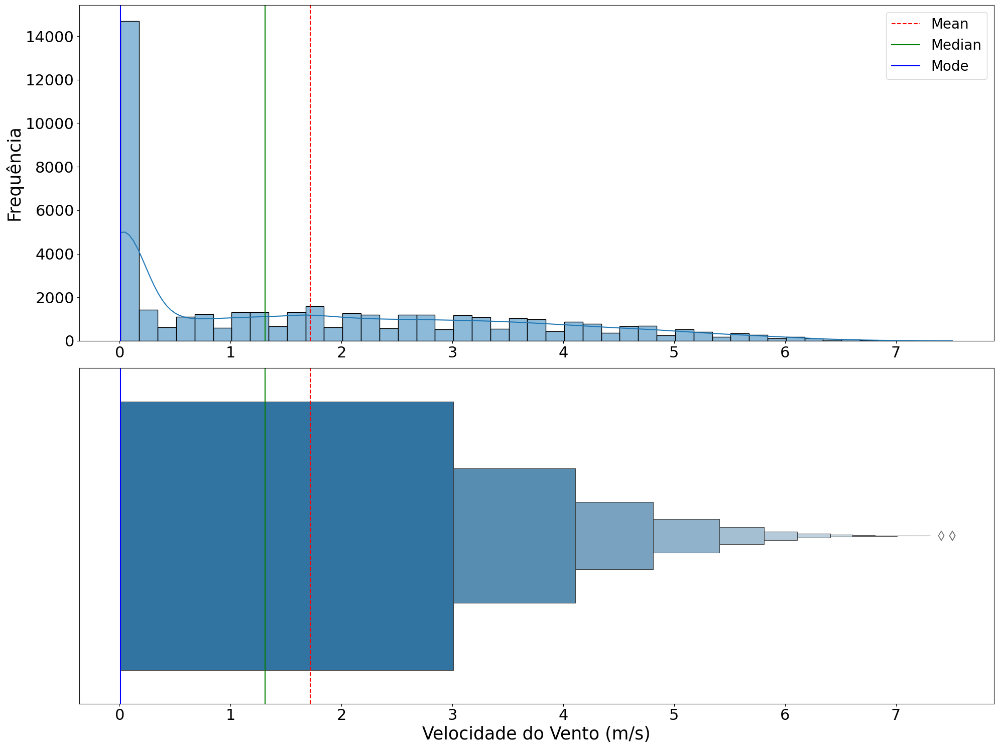

In [337]:
plota_boxplot_geral(data, variavel, label)

- Confirmamos a assimetria
- Maior parte dos valores é 0

#### 2.10.6. Boxplot por semana e hora do dia

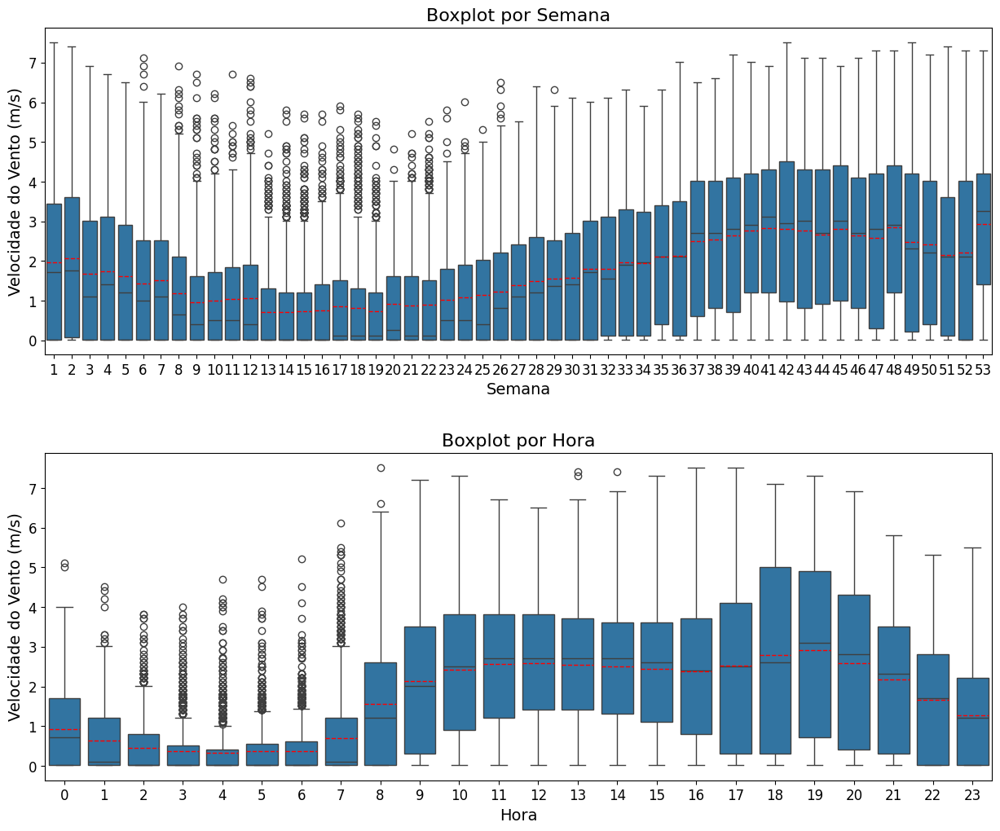

In [338]:
plota_boxplot_semana_hora(data, variavel, label)

- Temos maiores valores no segundo semetre do ano
- Maiores valores (com maior variação tbm) à tarde e noite

#### 2.10.7. Teste de Estacionariedade (Dickey-Fuller)

In [339]:
dickey_fuller(data, variavel)

ADF Statistic: -7.161465
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [340]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -46.323019
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [341]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -64.430540
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


Distribuição estacionária ou tendência-estacionária

#### 2.10.8. Decomposição em Tendência e Sazonalidade

##### 2.10.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [381]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

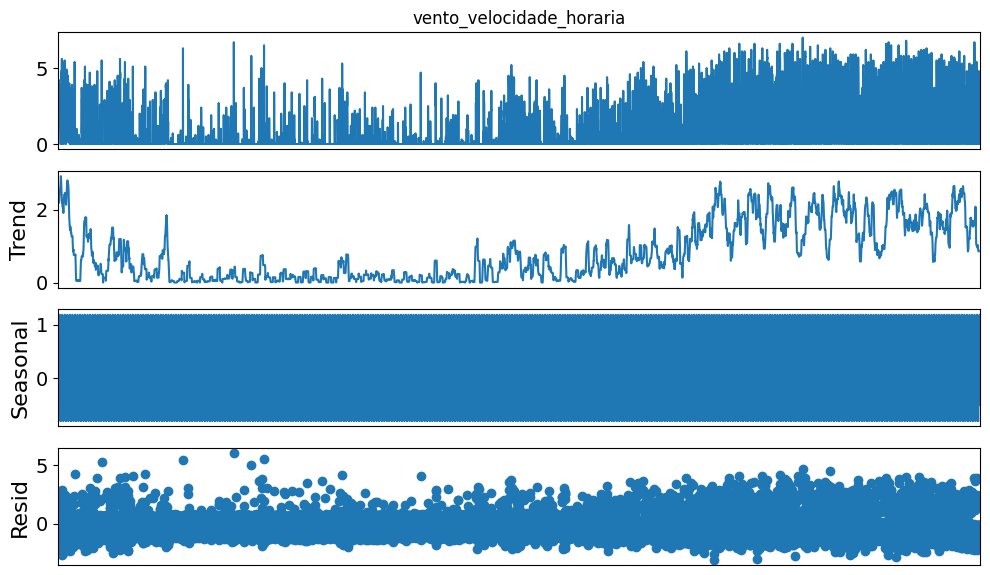

In [382]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.10.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [383]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

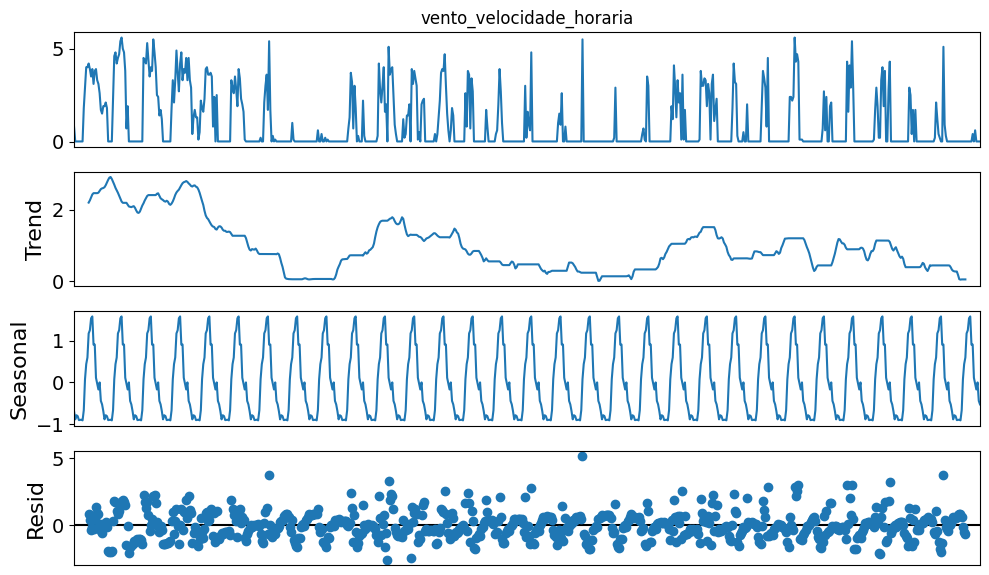

In [384]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.10.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [385]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

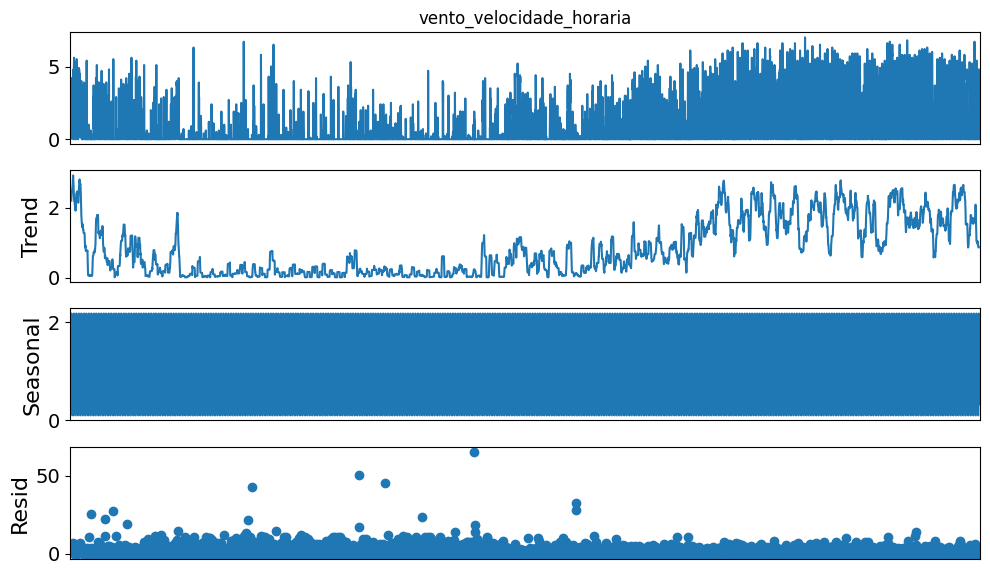

In [386]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.10.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [387]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

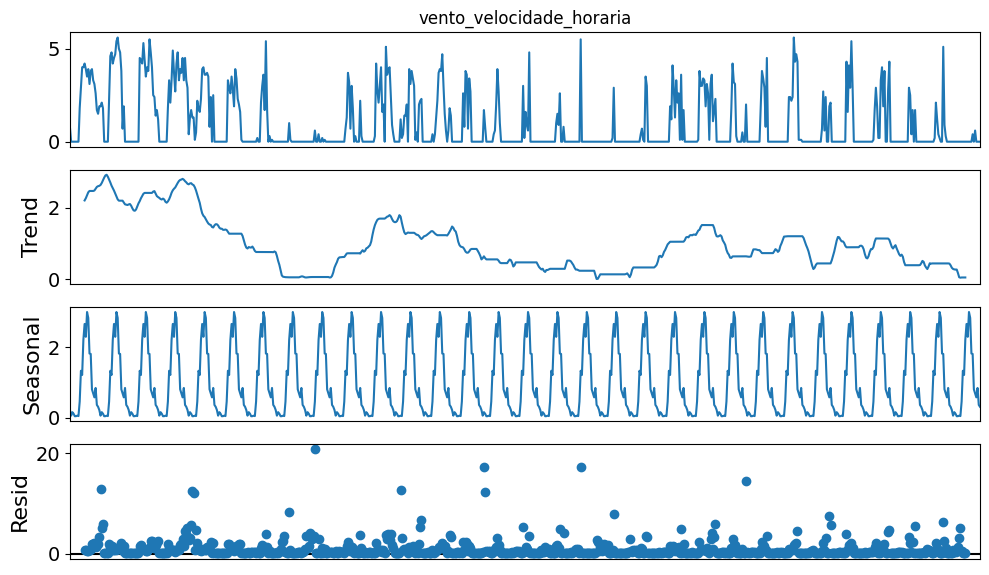

In [388]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

- Modelo aditivo reduziu mais os resíduos
- Vemos a tendência decrescente dos valores e a sazonalidade diária

#### 2.10.9. Análise de Autocorrelação

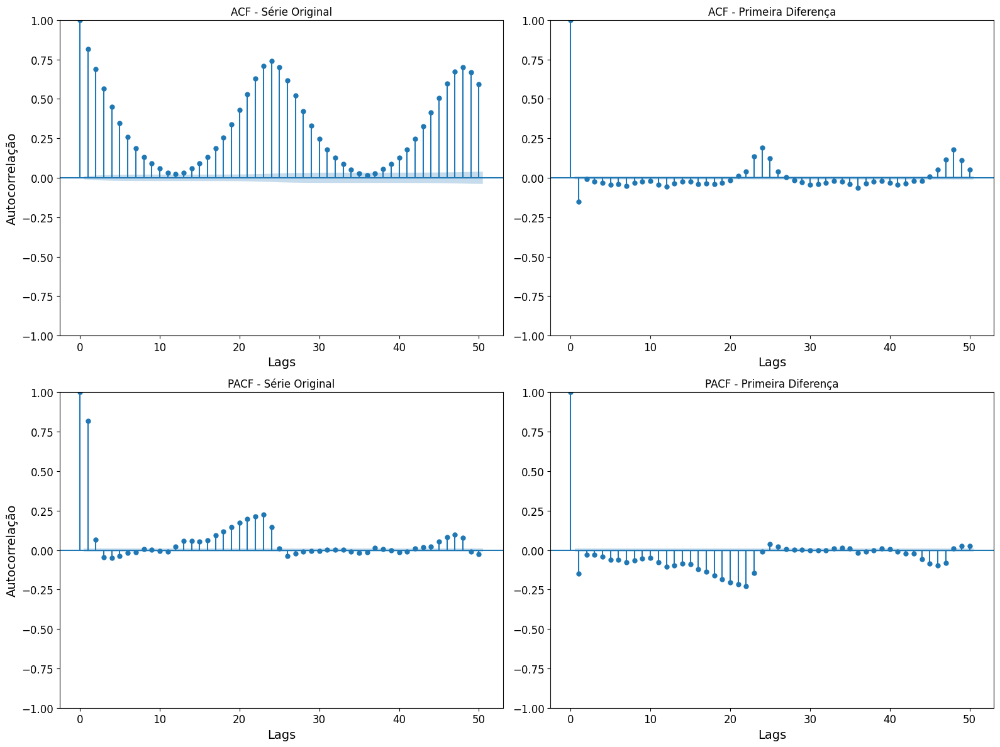

In [389]:
plot_acf_pacf(data, variavel)

- Vemos a sazonalidade

In [391]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 15 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43824 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43824 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  

### 2.11. Radiação Global - EDA univariada

In [392]:
variavel = "radiacao_global"
label = "Radiação Global (kW/m²)"

#### 2.11.1 Estatísticas descritivas

In [393]:
data[variavel].describe()

count    43824.000000
mean       833.469007
std       1117.533546
min          0.010000
25%          0.010000
50%         83.810000
75%       1651.035000
max       4151.010000
Name: radiacao_global, dtype: float64

#### 2.11.2. Coeficiente de Variação

In [394]:
print(calcula_cv(data, variavel))

134.08219580984544


#### 2.11.3. Visualização de perfil

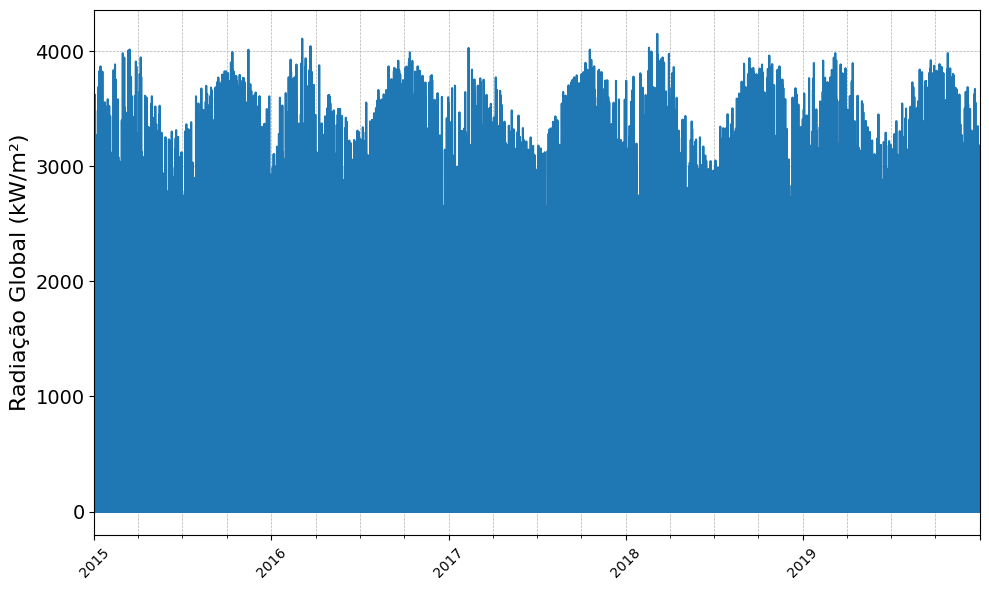

In [395]:
plota_perfil_geral(data, variavel, label)

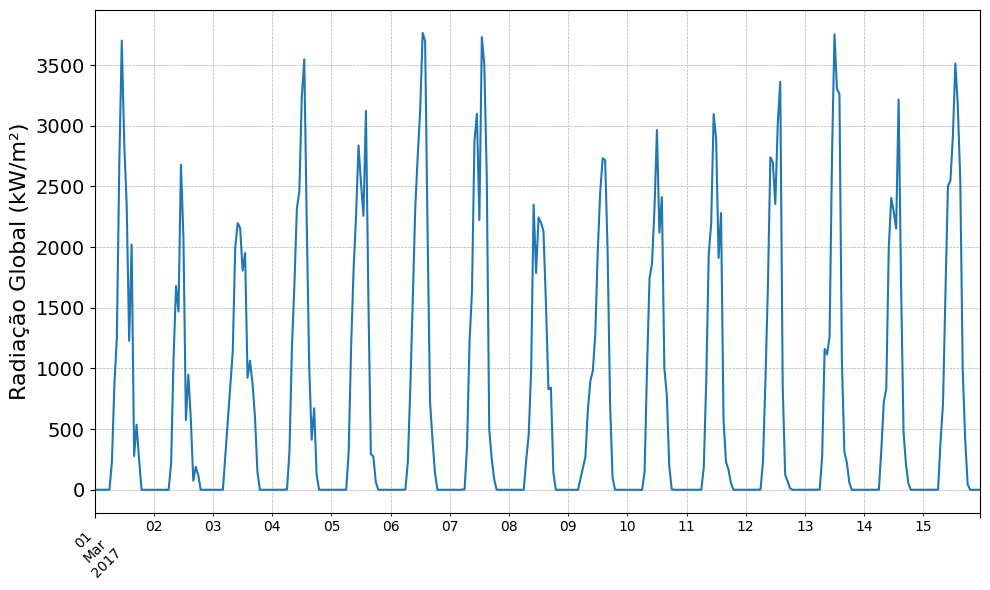

In [396]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

#### 2.11.4. Média móvel e desvio padrão móvel

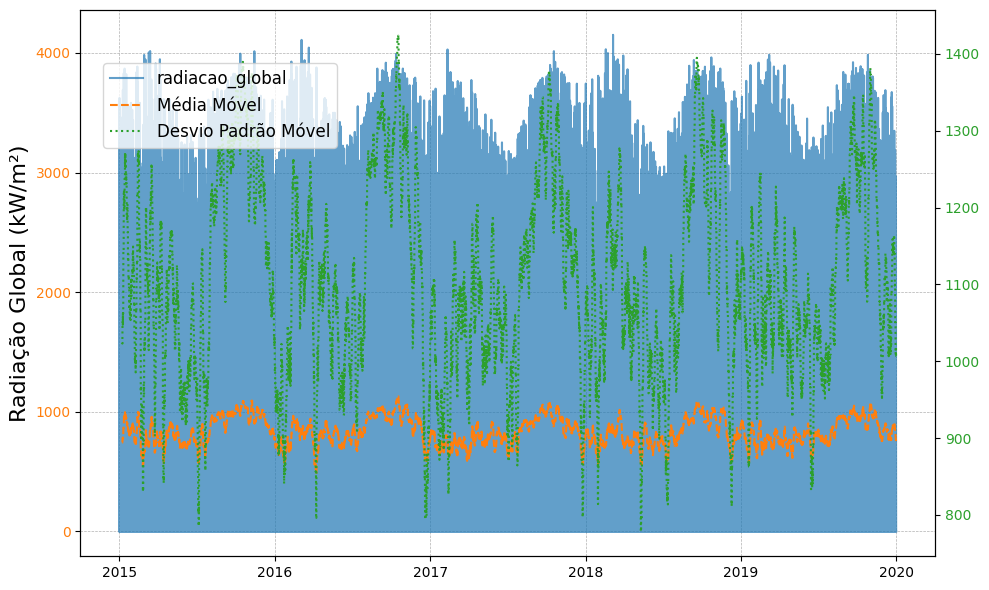

In [397]:
show_estat_moveis(data, variavel, label)

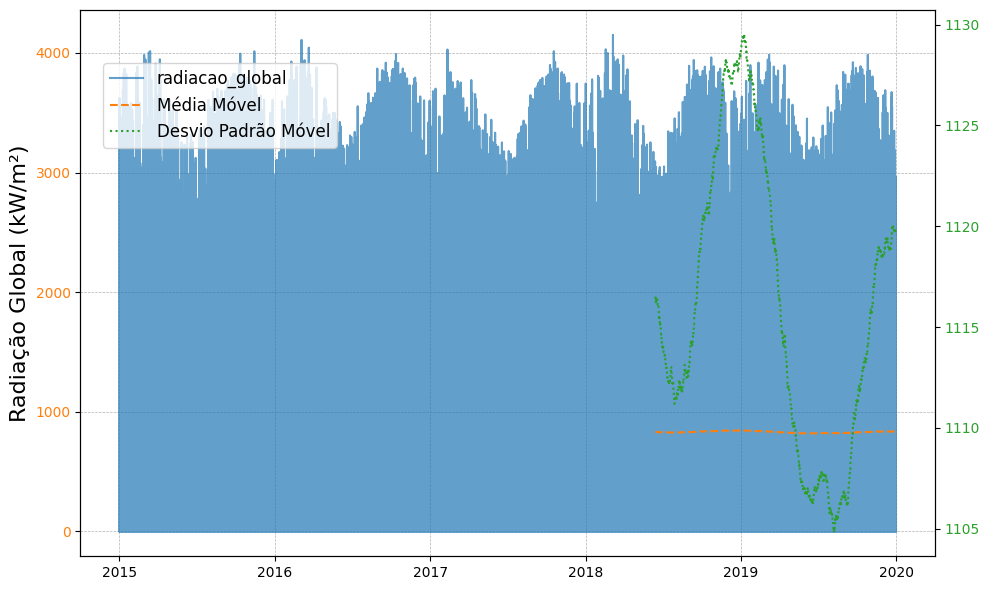

In [398]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

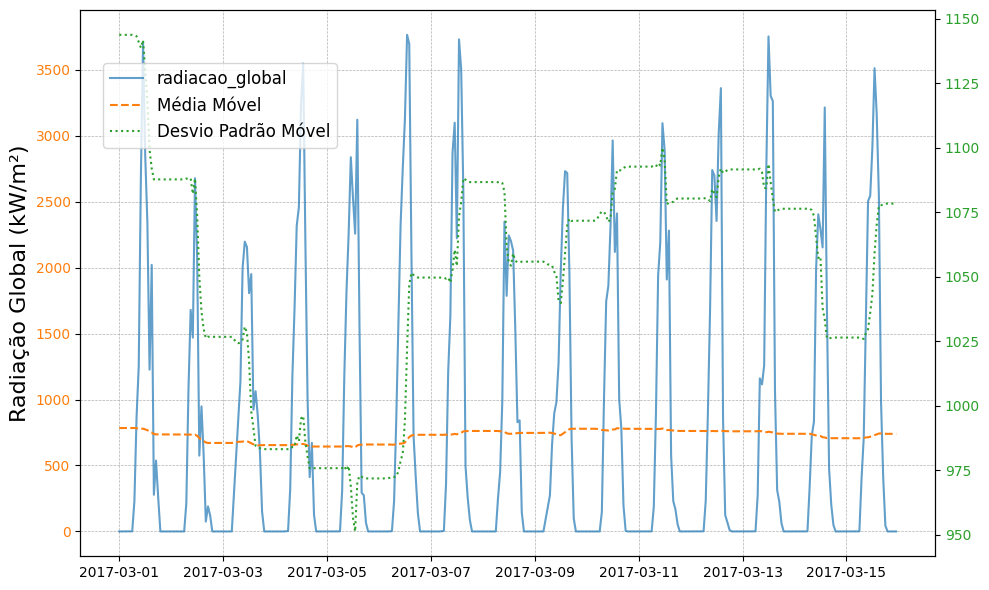

In [399]:
show_estat_moveis(data, variavel, label, inicio, fim)

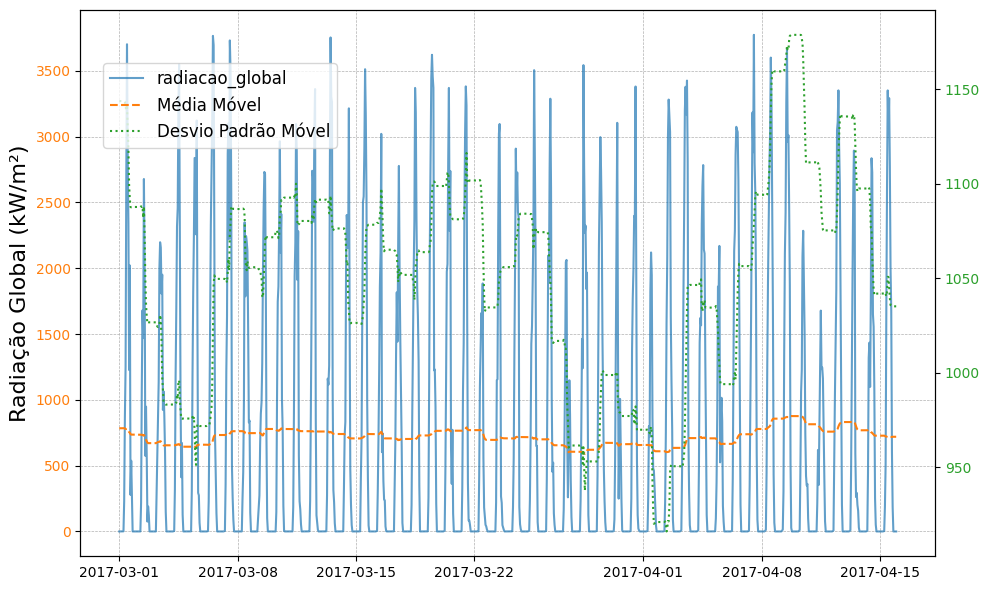

In [400]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

#### 2.11.5. Boxplot geral

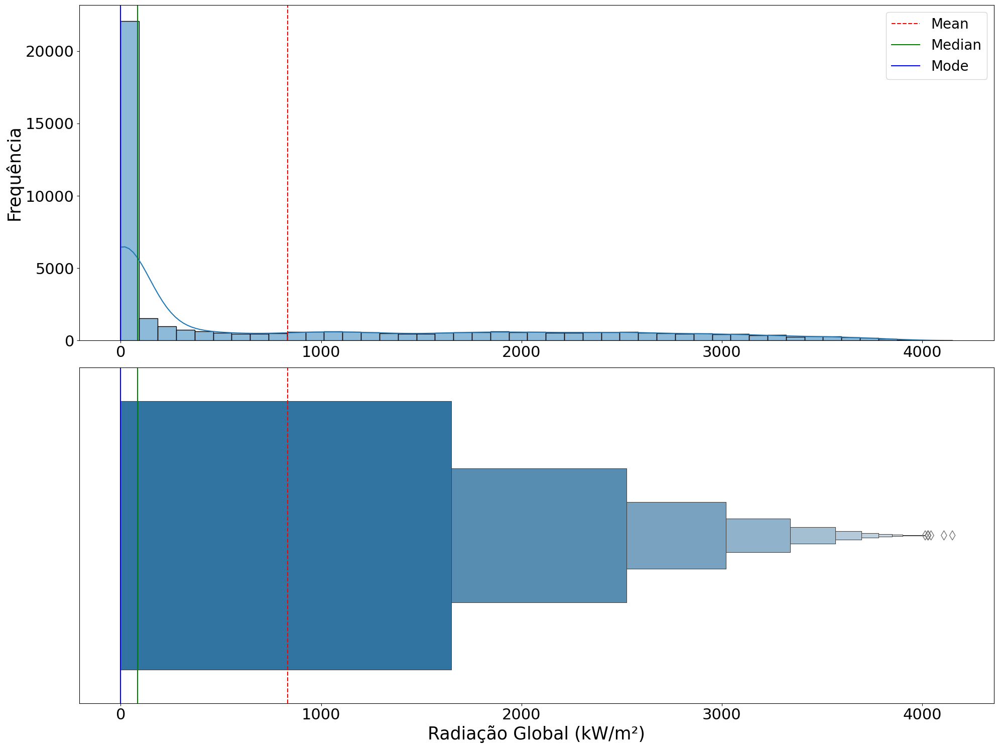

In [401]:
plota_boxplot_geral(data, variavel, label)

#### 2.11.6. Boxplot por semana e hora do dia

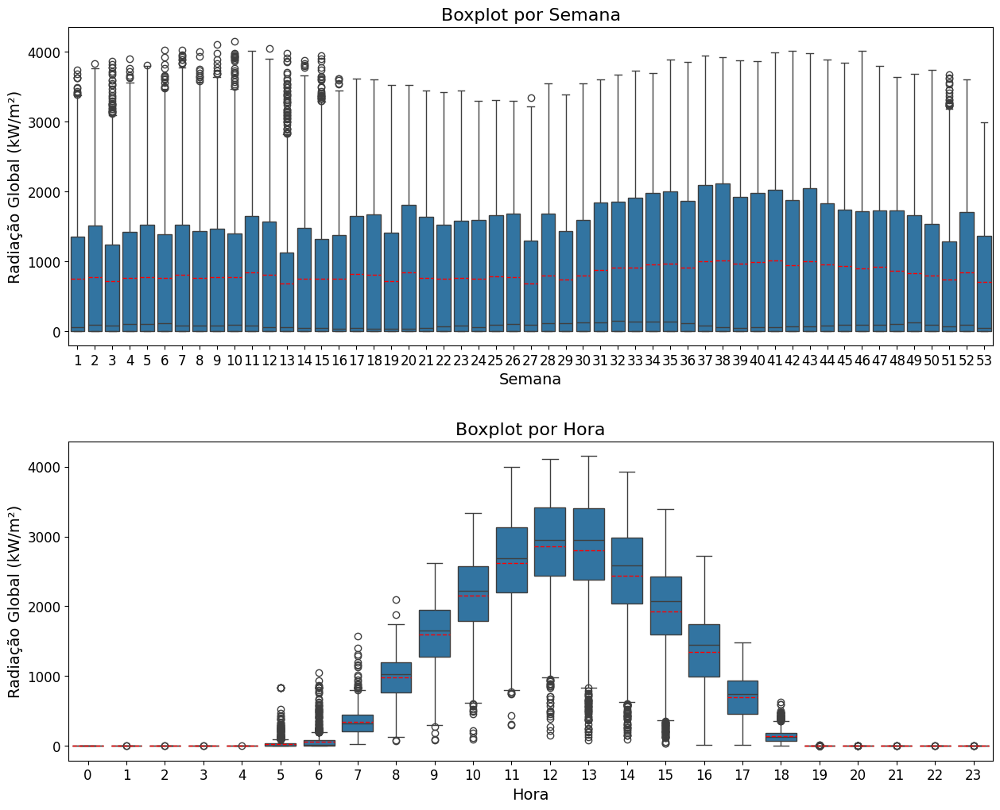

In [402]:
plota_boxplot_semana_hora(data, variavel, label)

#### 2.11.7. Teste de Estacionariedade (Dickey-Fuller)

In [403]:
dickey_fuller(data, variavel)

ADF Statistic: -18.452408
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [404]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -46.323019
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [405]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -64.430540
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


#### 2.11.8. Decomposição em Tendência e Sazonalidade

##### 2.11.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [406]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

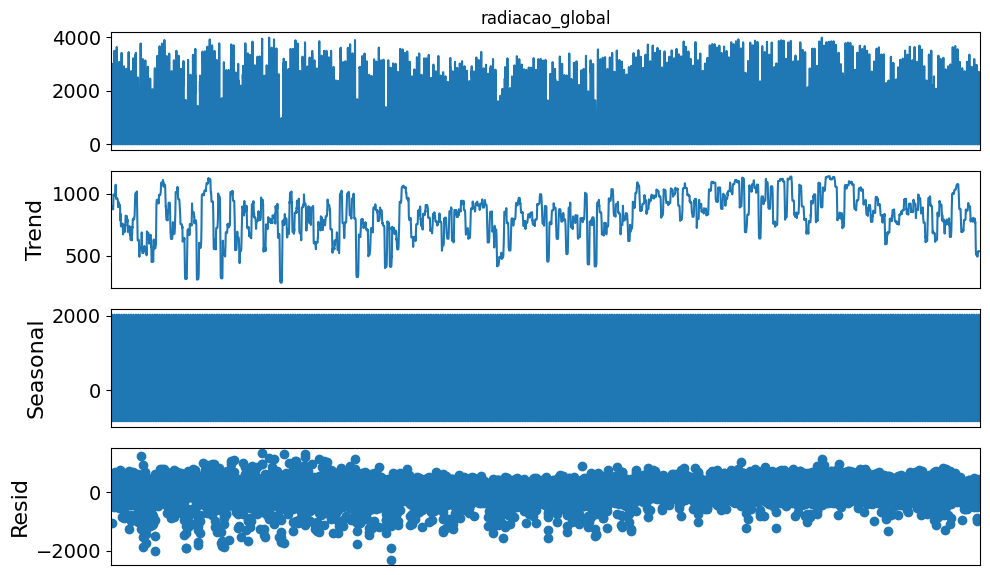

In [407]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.11.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [408]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

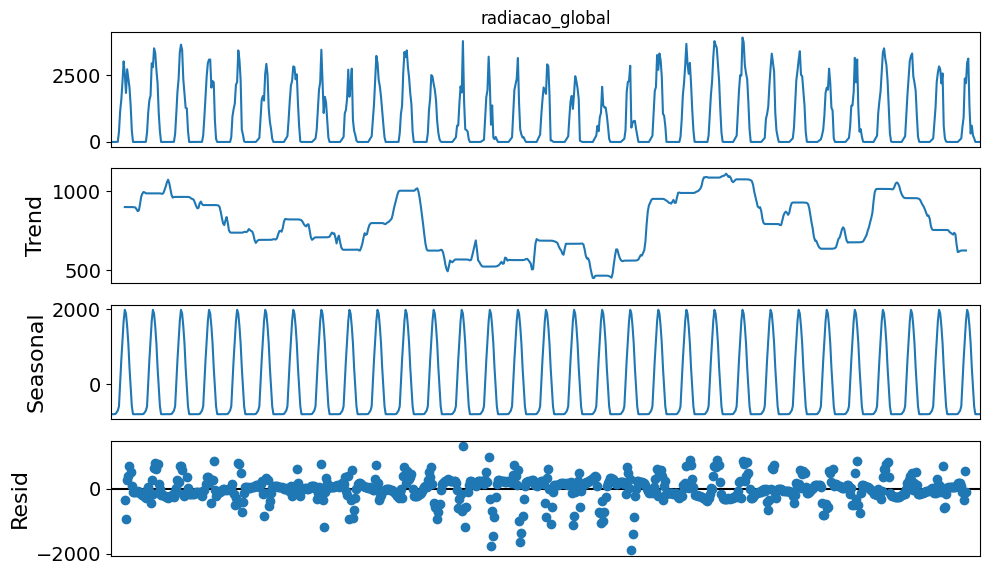

In [409]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.11.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [410]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

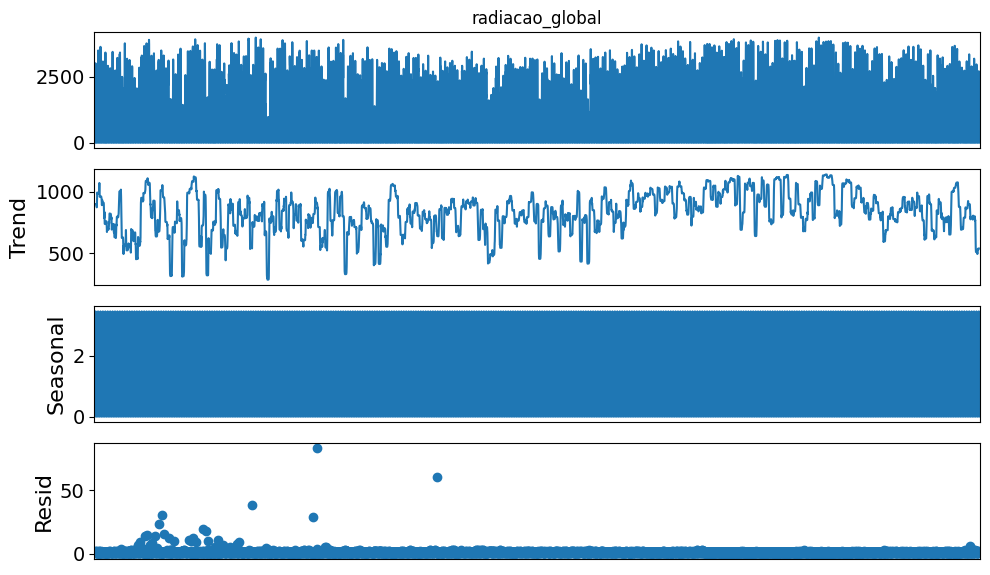

In [411]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.11.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [412]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

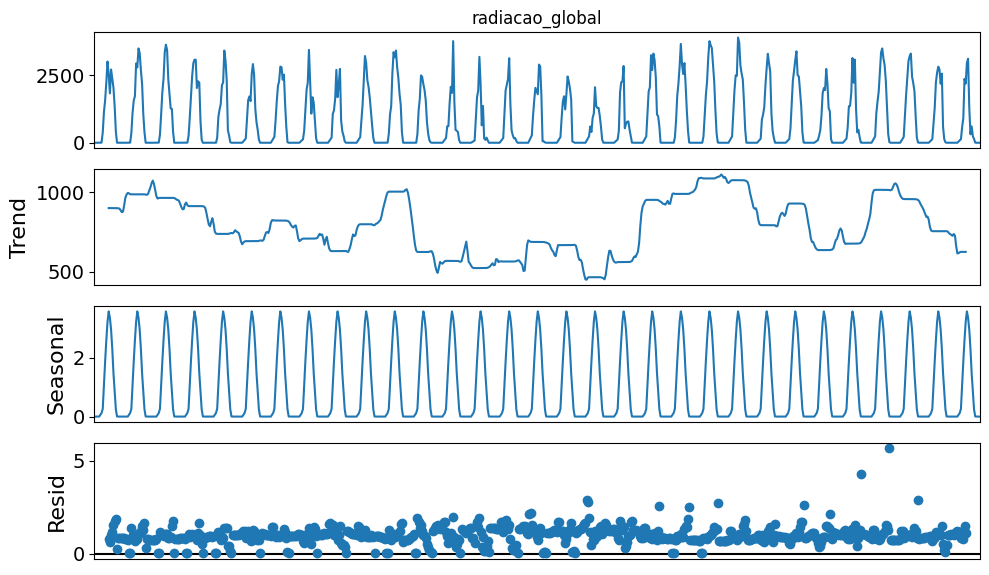

In [413]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.11.9. Análise de Autocorrelação

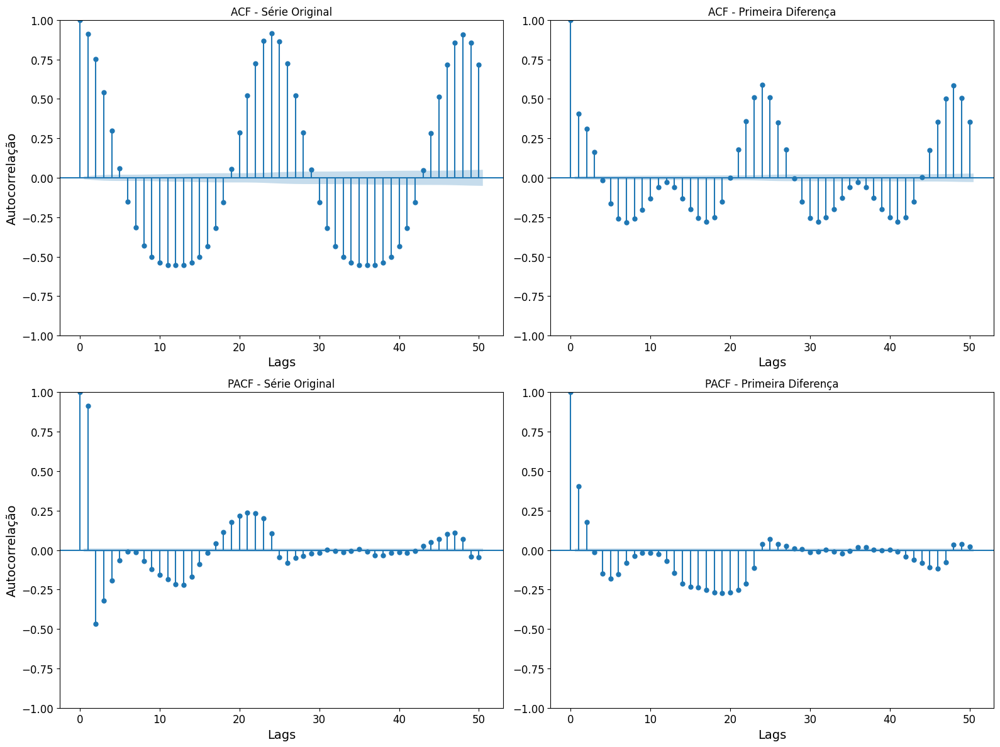

In [414]:
plot_acf_pacf(data, variavel)